In [1]:
# Install required libraries from Kaggle input directory
!pip install /kaggle/input/pip-install-lifelines/autograd-1.7.0-py3-none-any.whl
!pip install /kaggle/input/pip-install-lifelines/autograd-gamma-0.5.0.tar.gz
!pip install /kaggle/input/pip-install-lifelines/interface_meta-1.3.0-py3-none-any.whl
!pip install /kaggle/input/pip-install-lifelines/formulaic-1.0.2-py3-none-any.whl
!pip install /kaggle/input/pip-install-lifelines/lifelines-0.30.0-py3-none-any.whl

Processing /kaggle/input/pip-install-lifelines/autograd-1.7.0-py3-none-any.whl
Processing /kaggle/input/pip-install-lifelines/autograd-gamma-0.5.0.tar.gz
  Preparing metadata (setup.py) ... - done
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4030 sha256=15edc0516e1a6d686fbf793c394c8de2780f789cb8f7ce76fd49d839e5d4c168
  Stored in directory: /root/.cache/pip/wheels/6b/b5/e0/4c79e15c0b5f2c15ecf613c720bb20daab20a666eb67135155
Successfully built autograd-gamma
Processing /kaggle/input/pip-install-lifelines/interface_meta-1.3.0-py3-none-any.whl
Processing /kaggle/input/pip-install-lifelines/formulaic-1.0.2-py3-none-any.whl
Processing /kaggle/input/pip-install-lifelines/lifelines-0.30.0-py3-none-any.whl


In [2]:
# Import standard libraries
import numpy as np
import pandas as pd
import warnings
from pathlib import Path
from typing import Tuple, List, Dict
from IPython.display import display #To display dataframe with a nice format.


# Import visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Import scientific computing libraries
from scipy.stats import rankdata
from scipy.optimize import minimize

# Import scikit-learn libraries for model selection, preprocessing, and evaluation
from sklearn.model_selection import StratifiedKFold, StratifiedGroupKFold, train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.calibration import CalibratedClassifierCV
from sklearn.isotonic import IsotonicRegression
from sklearn.base import BaseEstimator, RegressorMixin

# Import machine learning frameworks
from lightgbm import LGBMRegressor
import lightgbm as lgb
from catboost import CatBoostRegressor  # Importing the Cox model implementation (CatBoost can be used for Cox model)
import xgboost as xgb
from xgboost import XGBRegressor

# Import survival analysis libraries
from lifelines import CoxPHFitter, KaplanMeierFitter, NelsonAalenFitter
from lifelines.utils import concordance_index


# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from lifelines import KaplanMeierFitter


warnings.filterwarnings('ignore') # Suppress warnings for cleaner output

# Configure pandas display settings
pd.set_option('display.max_columns', None) # Set the maximum number of columns to display
pd.set_option('display.width', None) # Set the width of the display


# Set up visualization settings
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (12, 6)

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;"> <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;"> 1. 🛠️ LOADING AND INSPECTING THE DATA </h2> <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;"> This section loads and inspects the training and test datasets to understand their structure, content, and potential issues like missing values. </p> <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;"> Key Steps: </h3> <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;"> <li><strong>Load Training Data:</strong> The training dataset is loaded from the provided CSV file using <code>pd.read_csv()</code>.</li> <li><strong>Display Data Preview:</strong> The first few rows of the training data are displayed using <code>train_df.head()</code> to get a quick overview.</li> <li><strong>Check Data Structure:</strong> The <code>train_df.info()</code> method is used to inspect the data types and structure of the dataset.</li> <li><strong>Identify Missing Values:</strong> The <code>train_df.isnull().sum()</code> method checks for missing values in the dataset.</li> <li><strong>Load Test Data:</strong> The test dataset is loaded similarly for further analysis or predictions.</li> </ul> </div>

In [3]:
######################################################
# 1. Load and Inspect the Data
######################################################
print("1. 🛠️ LOADING AND INSPECTING THE DATA ...")

# Load the training data
train_df = pd.read_csv('/kaggle/input/equity-post-HCT-survival-predictions/train.csv')

# Display the first few rows
print("Training Data:")
display(train_df.head())

# Check the data structure
print("\nTraining Data Info:")
display(train_df.info())

# Check for missing values
print("\nMissing Values in Training Data:")
display(train_df.isnull().sum())

# Load the test data (if needed)
test_df = pd.read_csv('/kaggle/input/equity-post-HCT-survival-predictions/test.csv')



1. 🛠️ LOADING AND INSPECTING THE DATA ...
Training Data:


,ID,dri_score,psych_disturb,cyto_score,diabetes,hla_match_c_high,hla_high_res_8,tbi_status,arrhythmia,hla_low_res_6,graft_type,vent_hist,renal_issue,pulm_severe,prim_disease_hct,hla_high_res_6,cmv_status,hla_high_res_10,hla_match_dqb1_high,tce_imm_match,hla_nmdp_6,hla_match_c_low,rituximab,hla_match_drb1_low,hla_match_dqb1_low,prod_type,cyto_score_detail,conditioning_intensity,ethnicity,year_hct,obesity,mrd_hct,in_vivo_tcd,tce_match,hla_match_a_high,hepatic_severe,donor_age,prior_tumor,hla_match_b_low,peptic_ulcer,age_at_hct,hla_match_a_low,gvhd_proph,rheum_issue,sex_match,hla_match_b_high,race_group,comorbidity_score,karnofsky_score,hepatic_mild,tce_div_match,donor_related,melphalan_dose,hla_low_res_8,cardiac,hla_match_drb1_high,pulm_moderate,hla_low_res_10,efs,efs_time
0,0,N/A - non-malignant indication,No,NaN,No,NaN,NaN,No TBI,No,6.0,Bone marrow,No,No,No,IEA,6.0,+/+,NaN,2.0,NaN,6.0,2.0,No,2.0,2.0,BM,NaN,NaN,Not Hispanic or Latino,2016,No,NaN,Yes,NaN,2.0,No,NaN,No,2.0,No,9.942,2.0,FKalone,No,M-F,2.0,More than one race,0.0,90.0,No,NaN,Unrelated,"N/A, Mel not given",8.0,No,2.0,No,10.0,0.0,42.356
1,1,Intermediate,No,Intermediate,No,2.0,8.0,"TBI +- Other, >cGy",No,6.0,Peripheral blood,No,No,No,AML,6.0,+/+,10.0,2.0,P/P,6.0,2.0,No,2.0,2.0,PB,Intermediate,MAC,Not Hispanic or Latino,2008,No,Positive,No,Permissive,2.0,No,72.29,No,2.0,No,43.705,2.0,Other GVHD Prophylaxis,No,F-F,2.0,Asian,3.0,90.0,No,Permissive mismatched,Related,"N/A, Mel not given",8.0,No,2.0,Yes,10.0,1.0,4.672
2,2,N/A - non-malignant indication,No,NaN,No,2.0,8.0,No TBI,No,6.0,Bone marrow,No,No,No,HIS,6.0,+/+,10.0,2.0,P/P,6.0,2.0,No,2.0,2.0,BM,NaN,NaN,Not Hispanic or Latino,2019,No,NaN,Yes,NaN,2.0,No,NaN,No,2.0,No,33.997,2.0,Cyclophosphamide alone,No,F-M,2.0,More than one race,0.0,90.0,No,Permissive mismatched,Related,"N/A, Mel not given",8.0,No,2.0,No,10.0,0.0,19.793
3,3,High,No,Intermediate,No,2.0,8.0,No TBI,No,6.0,Bone marrow,No,No,No,ALL,6.0,+/+,10.0,2.0,P/P,6.0,2.0,No,2.0,2.0,BM,Intermediate,MAC,Not Hispanic or Latino,2009,No,Positive,No,Permissive,2.0,No,29.23,No,2.0,No,43.245,2.0,FK+ MMF +- others,No,M-M,2.0,White,0.0,90.0,Yes,Permissive mismatched,Unrelated,"N/A, Mel not given",8.0,No,2.0,No,10.0,0.0,102.349
4,4,High,No,NaN,No,2.0,8.0,No TBI,No,6.0,Peripheral blood,No,No,No,MPN,6.0,+/+,10.0,2.0,NaN,5.0,2.0,No,2.0,2.0,PB,NaN,MAC,Hispanic or Latino,2018,No,NaN,Yes,NaN,2.0,No,56.81,No,2.0,No,29.740,2.0,TDEPLETION +- other,No,M-F,2.0,American Indian or Alaska Native,1.0,90.0,No,Permissive mismatched,Related,MEL,8.0,No,2.0,No,10.0,0.0,16.223



Training Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28800 entries, 0 to 28799
Data columns (total 60 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ID                      28800 non-null  int64  
 1   dri_score               28646 non-null  object 
 2   psych_disturb           26738 non-null  object 
 3   cyto_score              20732 non-null  object 
 4   diabetes                26681 non-null  object 
 5   hla_match_c_high        24180 non-null  float64
 6   hla_high_res_8          22971 non-null  float64
 7   tbi_status              28800 non-null  object 
 8   arrhythmia              26598 non-null  object 
 9   hla_low_res_6           25530 non-null  float64
 10  graft_type              28800 non-null  object 
 11  vent_hist               28541 non-null  object 
 12  renal_issue             26885 non-null  object 
 13  pulm_severe             26665 non-null  object 
 14  prim_disease_hct 

None


Missing Values in Training Data:


ID                            0
dri_score                   154
psych_disturb              2062
cyto_score                 8068
diabetes                   2119
hla_match_c_high           4620
hla_high_res_8             5829
tbi_status                    0
arrhythmia                 2202
hla_low_res_6              3270
graft_type                    0
vent_hist                   259
renal_issue                1915
pulm_severe                2135
prim_disease_hct              0
hla_high_res_6             5284
cmv_status                  634
hla_high_res_10            7163
hla_match_dqb1_high        5199
tce_imm_match             11133
hla_nmdp_6                 4197
hla_match_c_low            2800
rituximab                  2148
hla_match_drb1_low         2643
hla_match_dqb1_low         4194
prod_type                     0
cyto_score_detail         11923
conditioning_intensity     4789
ethnicity                   587
year_hct                      0
obesity                    1760
mrd_hct 

<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section involves loading the dataset and performing an initial inspection to understand its structure, content, and missing values. The dataset contains 28,800 entries and 60 columns, including demographic, medical, and transplant-related variables.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Missing Values:</strong> Several columns have a significant number of missing values, particularly HLA-related and clinical variables. For example:
            <ul>
                <li><code>tce_match</code>: 18,996 missing values (~66% missing).</li>
                <li><code>mrd_hct</code>: 16,597 missing values (~58% missing).</li>
                <li><code>cyto_score_detail</code>: 11,923 missing values (~41% missing).</li>
            </ul>
            These missing values could indicate that certain variables are only relevant for specific patient groups or conditions.
        </li>
        <li><strong>Target Variables:</strong> The target variables (<code>efs</code> and <code>efs_time</code>) are complete with no missing values, which is ideal for modeling. <code>efs</code> represents event-free survival (binary outcome), and <code>efs_time</code> represents the time to event-free survival (continuous variable).</li>
        <li><strong>Data Types:</strong> The dataset includes both numerical (float64, int64) and categorical (object) data types. For example:
            <ul>
                <li>Numerical: <code>age_at_hct</code>, <code>donor_age</code>, <code>karnofsky_score</code>.</li>
                <li>Categorical: <code>graft_type</code>, <code>prim_disease_hct</code>, <code>race_group</code>.</li>
            </ul>
            This mix of data types will require appropriate preprocessing (e.g., encoding for categorical variables and scaling for numerical variables).
        </li>
        <li><strong>HLA-Related Variables:</strong> Many HLA-related columns (e.g., <code>hla_match_c_high</code>, <code>hla_high_res_8</code>, <code>hla_match_dqb1_high</code>) have a high percentage of missing values. These variables are critical for transplant compatibility and outcomes, so their missingness may need careful handling (e.g., imputation or feature engineering).</li>
        <li><strong>Clinical Variables:</strong> Variables like <code>cyto_score</code> and <code>tce_imm_match</code> also have high missingness, which could be due to their relevance only for specific diseases or conditions. Understanding their importance in the context of the target variable will be crucial.</li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> Columns like <code>tce_match</code> and <code>mrd_hct</code> have extremely high missingness (>50%). These columns may need to be dropped or imputed carefully, as they could introduce bias if not handled properly.
        </p>
    </div>
</div>

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        2. 📊 BASIC STATISTICS
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section calculates and displays basic statistics for both numerical and categorical features in the dataset. These statistics provide insights into the distribution and characteristics of the data.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Steps:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Numerical Features:</strong> The <code>train_df.describe()</code> method is used to generate summary statistics (e.g., mean, standard deviation, min, max) for numerical features.</li>
        <li><strong>Categorical Features:</strong> The <code>train_df.describe(include=['object', 'category'])</code> method is used to generate summary statistics (e.g., count, unique, top frequency) for categorical features.</li>
    </ul>
</div>

In [4]:
######################################################
# 2. Basic Statistics
######################################################
print("\n2. 📊 BASIC STATISTICS ...")

# Summary statistics for numerical features
print("Summary Statistics for Numerical Features:")
display(train_df.describe())

# Summary statistics for categorical features
print("\nSummary Statistics for Categorical Features:")
display(train_df.describe(include=['object', 'category']))




2. 📊 BASIC STATISTICS ...
Summary Statistics for Numerical Features:


,ID,hla_match_c_high,hla_high_res_8,hla_low_res_6,hla_high_res_6,hla_high_res_10,hla_match_dqb1_high,hla_nmdp_6,hla_match_c_low,hla_match_drb1_low,hla_match_dqb1_low,year_hct,hla_match_a_high,donor_age,hla_match_b_low,age_at_hct,hla_match_a_low,hla_match_b_high,comorbidity_score,karnofsky_score,hla_low_res_8,hla_match_drb1_high,hla_low_res_10,efs,efs_time
count,28800.000000,24180.000000,22971.000000,25530.000000,23516.000000,21637.000000,23601.000000,24603.000000,26000.000000,26157.000000,24606.000000,28800.000000,24499.000000,26992.000000,26235.000000,28800.000000,26410.000000,24712.00000,28323.000000,27930.00000,25147.000000,25448.000000,23736.000000,28800.000000,28800.000000
mean,14399.500000,1.764516,6.876801,5.143322,5.109202,8.617230,1.736876,5.160346,1.757808,1.715296,1.773795,2015.179444,1.703743,42.511591,1.719916,38.663162,1.709087,1.69962,1.702327,83.83208,6.903448,1.707128,8.664687,0.539306,23.237678
std,8313.988213,0.431941,1.564313,1.207757,1.214162,1.905125,0.447687,1.203240,0.435453,0.451282,0.427130,3.153914,0.462213,15.251434,0.454449,21.147581,0.458259,0.46518,1.994443,11.02884,1.565017,0.461179,1.882746,0.498461,24.799748
min,0.000000,0.000000,2.000000,2.000000,0.000000,3.000000,0.000000,2.000000,0.000000,1.000000,0.000000,2008.000000,0.000000,18.010000,0.000000,0.044000,0.000000,0.00000,0.000000,40.00000,2.000000,0.000000,4.000000,0.000000,0.333000
25%,7199.750000,2.000000,6.000000,4.000000,4.000000,7.000000,1.000000,4.000000,2.000000,1.000000,2.000000,2013.000000,1.000000,28.447000,1.000000,19.539000,1.000000,1.00000,0.000000,70.00000,6.000000,1.000000,7.000000,0.000000,5.619750
50%,14399.500000,2.000000,8.000000,6.000000,6.000000,10.000000,2.000000,6.000000,2.000000,2.000000,2.000000,2016.000000,2.000000,40.063000,2.000000,41.006000,2.000000,2.00000,1.000000,90.00000,8.000000,2.000000,10.000000,1.000000,9.796500
75%,21599.250000,2.000000,8.000000,6.000000,6.000000,10.000000,2.000000,6.000000,2.000000,2.000000,2.000000,2018.000000,2.000000,56.131500,2.000000,55.965250,2.000000,2.00000,2.000000,90.00000,8.000000,2.000000,10.000000,1.000000,35.100000
max,28799.000000,2.000000,8.000000,6.000000,6.000000,10.000000,2.000000,6.000000,2.000000,2.000000,2.000000,2020.000000,2.000000,84.800000,2.000000,73.726000,2.000000,2.00000,10.000000,100.00000,8.000000,2.000000,10.000000,1.000000,156.819000



Summary Statistics for Categorical Features:


,dri_score,psych_disturb,cyto_score,diabetes,tbi_status,arrhythmia,graft_type,vent_hist,renal_issue,pulm_severe,prim_disease_hct,cmv_status,tce_imm_match,rituximab,prod_type,cyto_score_detail,conditioning_intensity,ethnicity,obesity,mrd_hct,in_vivo_tcd,tce_match,hepatic_severe,prior_tumor,peptic_ulcer,gvhd_proph,rheum_issue,sex_match,race_group,hepatic_mild,tce_div_match,donor_related,melphalan_dose,cardiac,pulm_moderate
count,28646,26738,20732,26681,28800,26598,28800,28541,26885,26665,28800,28166,17667,26652,28800,16877,24011,28213,27040,12203,28575,9804,26929,27122,26381,28575,26617,28539,28800,26883,17404,28642,27395,26258,26753
unique,11,3,7,3,8,3,2,2,3,3,18,4,8,2,2,5,6,3,3,2,2,4,3,3,3,17,3,4,6,3,4,3,2,3,3
top,Intermediate,No,Poor,No,No TBI,No,Peripheral blood,No,No,No,ALL,+/+,P/P,No,PB,Intermediate,MAC,Not Hispanic or Latino,No,Negative,No,Permissive,No,No,No,FK+ MMF +- others,No,M-M,More than one race,No,Permissive mismatched,Related,"N/A, Mel not given",No,No
freq,10436,23005,8802,22201,18861,25203,20546,27721,26548,24779,8102,13596,13114,26033,20381,11158,12288,24482,25144,8068,17591,6272,25238,23828,25956,10440,26015,7980,4845,24989,12936,16208,20135,24592,21338


<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section provides basic statistical summaries for both numerical and categorical features in the dataset. These statistics help us understand the distribution, central tendencies, and variability of the data.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Numerical Features:</strong>
            <ul>
                <li><strong>ID:</strong> The IDs range from 0 to 28,799, confirming there are 28,800 unique entries.</li>
                <li><strong>Age:</strong> The average age of patients at the time of transplant (<code>age_at_hct</code>) is 38.66 years, with a wide range from 0.044 to 73.726 years. This indicates that the dataset includes both pediatric and adult patients.</li>
                <li><strong>Donor Age:</strong> The average donor age is 42.51 years, with a range from 18.01 to 84.8 years.</li>
                <li><strong>Karnofsky Score:</strong> The average Karnofsky score (a measure of patient performance status) is 83.83, with a range from 40 to 100. Most patients have a score of 90, indicating relatively good health status.</li>
                <li><strong>Event-Free Survival (<code>efs</code>):</strong> The mean value is 0.54, indicating that approximately 54% of patients experienced event-free survival.</li>
                <li><strong>Time to Event-Free Survival (<code>efs_time</code>):</strong> The average time to event-free survival is 23.24 months, with a wide range from 0.333 to 156.819 months.</li>
            </ul>
        </li>
        <li><strong>Categorical Features:</strong>
            <ul>
                <li><strong>Graft Type:</strong> The most common graft type is <code>Peripheral blood</code> (20,546 occurrences), followed by <code>Bone marrow</code> (8,254 occurrences).</li>
                <li><strong>Primary Disease (<code>prim_disease_hct</code>):</strong> The most common disease requiring transplantation is <code>ALL</code> (Acute Lymphoblastic Leukemia), with 8,102 occurrences.</li>
                <li><strong>CMV Status:</strong> The majority of patients have a CMV status of <code>+/+</code> (13,596 occurrences), indicating both donor and recipient are CMV positive.</li>
                <li><strong>Race Group:</strong> The most frequent race group is <code>More than one race</code> (4,845 occurrences), followed by <code>White</code> and <code>Asian</code>.</li>
                <li><strong>Conditioning Intensity:</strong> The most common conditioning intensity is <code>MAC</code> (Myeloablative Conditioning), with 12,288 occurrences.</li>
            </ul>
        </li>
        <li><strong>Missing Values:</strong> The summary statistics confirm the presence of missing values in both numerical and categorical features, as observed in the previous step. For example:
            <ul>
                <li><code>tce_match</code> has only 9,804 non-missing values out of 28,800.</li>
                <li><code>mrd_hct</code> has only 12,203 non-missing values.</li>
            </ul>
        </li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> The high variability in some numerical features (e.g., <code>age_at_hct</code> and <code>efs_time</code>) suggests the need for scaling or normalization before modeling. Additionally, the high frequency of certain categories (e.g., <code>Peripheral blood</code> in <code>graft_type</code>) may lead to class imbalance issues in predictive modeling.
        </p>
    </div>
</div>

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        3. 🔍 MISSING VALUES ANALYSIS
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section analyzes and visualizes missing values in the dataset. Missing values can impact model performance, so identifying and addressing them is a critical step in data preprocessing.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Steps:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Visualize Missing Values:</strong> A heatmap is created using <code>sns.heatmap()</code> to visualize the distribution of missing values across the dataset. The <code>viridis</code> colormap highlights missing values.</li>
        <li><strong>Identify Columns with Missing Values:</strong> The columns containing missing values are identified using <code>train_df.columns[train_df.isnull().any()].tolist()</code> and displayed for further analysis.</li>
    </ul>
</div>


3. 🔍 MISSING VALUES ANALYSIS ...


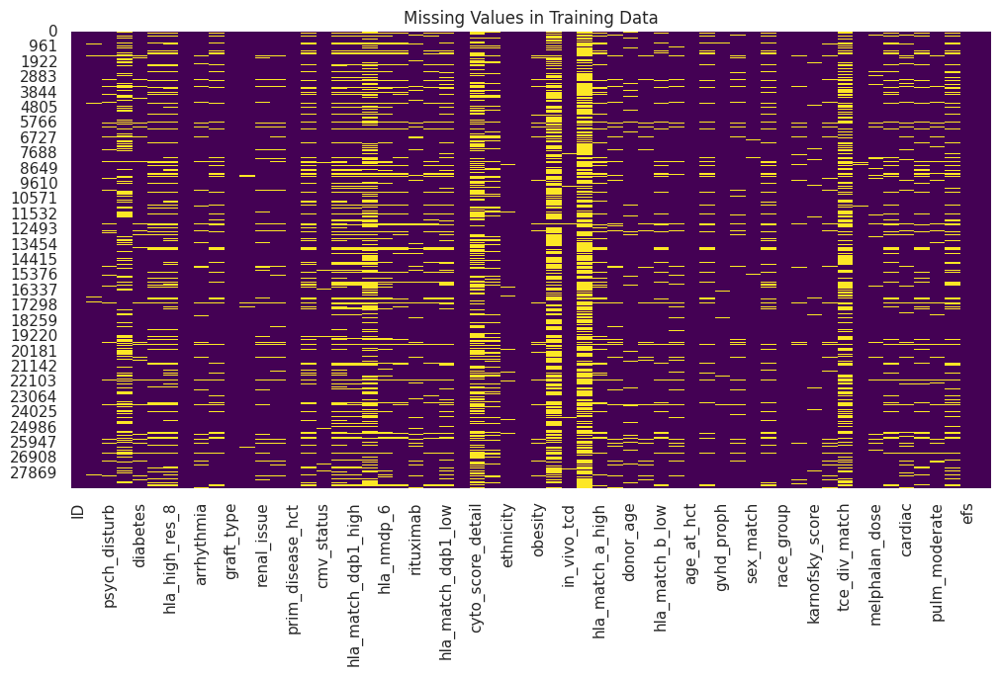

Columns with Missing Values:


['dri_score',
 'psych_disturb',
 'cyto_score',
 'diabetes',
 'hla_match_c_high',
 'hla_high_res_8',
 'arrhythmia',
 'hla_low_res_6',
 'vent_hist',
 'renal_issue',
 'pulm_severe',
 'hla_high_res_6',
 'cmv_status',
 'hla_high_res_10',
 'hla_match_dqb1_high',
 'tce_imm_match',
 'hla_nmdp_6',
 'hla_match_c_low',
 'rituximab',
 'hla_match_drb1_low',
 'hla_match_dqb1_low',
 'cyto_score_detail',
 'conditioning_intensity',
 'ethnicity',
 'obesity',
 'mrd_hct',
 'in_vivo_tcd',
 'tce_match',
 'hla_match_a_high',
 'hepatic_severe',
 'donor_age',
 'prior_tumor',
 'hla_match_b_low',
 'peptic_ulcer',
 'hla_match_a_low',
 'gvhd_proph',
 'rheum_issue',
 'sex_match',
 'hla_match_b_high',
 'comorbidity_score',
 'karnofsky_score',
 'hepatic_mild',
 'tce_div_match',
 'donor_related',
 'melphalan_dose',
 'hla_low_res_8',
 'cardiac',
 'hla_match_drb1_high',
 'pulm_moderate',
 'hla_low_res_10']

In [5]:
######################################################
# 3. Missing Values Analysis
######################################################
print("\n3. 🔍 MISSING VALUES ANALYSIS ...")

# Visualize missing values
plt.figure(figsize=(12, 6))
sns.heatmap(train_df.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values in Training Data")
plt.show()

# List columns with missing values
missing_columns = train_df.columns[train_df.isnull().any()].tolist()
print("Columns with Missing Values:")
display(missing_columns)



<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section focuses on analyzing missing values in the dataset. Missing data can significantly impact model performance, so understanding its distribution and extent is crucial for effective preprocessing.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Missing Values Heatmap:</strong> The heatmap visualization reveals that missing values are spread across many columns, with some columns having a higher concentration of missing data than others. This aligns with the earlier observation that HLA-related and clinical variables have significant missingness.</li>
        <li><strong>Columns with Missing Values:</strong> A total of <strong>48 out of 60 columns</strong> have missing values. Some of the most affected columns include:
            <ul>
                <li><code>tce_match</code>: 18,996 missing values (~66% missing).</li>
                <li><code>mrd_hct</code>: 16,597 missing values (~58% missing).</li>
                <li><code>cyto_score_detail</code>: 11,923 missing values (~41% missing).</li>
                <li><code>tce_imm_match</code>: 11,133 missing values (~39% missing).</li>
                <li><code>tce_div_match</code>: 11,396 missing values (~40% missing).</li>
            </ul>
        </li>
        <li><strong>HLA-Related Variables:</strong> Many HLA-related columns (e.g., <code>hla_match_c_high</code>, <code>hla_high_res_8</code>, <code>hla_match_dqb1_high</code>) have a high percentage of missing values. These variables are critical for transplant compatibility and outcomes, so their missingness may need careful handling (e.g., imputation or feature engineering).</li>
        <li><strong>Clinical Variables:</strong> Variables like <code>cyto_score</code> and <code>tce_imm_match</code> also have high missingness, which could be due to their relevance only for specific diseases or conditions. Understanding their importance in the context of the target variable will be crucial.</li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> The high percentage of missing values in key columns (e.g., <code>tce_match</code>, <code>mrd_hct</code>) suggests that these variables may need to be dropped or imputed carefully. Imputing these variables without proper consideration could introduce bias into the model.
        </p>
    </div>
</div>

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        4. 🎯 TARGET VARIABLE ANALYSIS
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section analyzes the target variables (<code>efs</code> and <code>efs_time</code>) to understand their distribution and characteristics. The target variables are critical for survival analysis, as they represent the event status and time to event.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Steps:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Distribution of <code>efs</code>:</strong> A count plot is created using <code>sns.countplot()</code> to visualize the distribution of the event-free survival status (<code>efs</code>).</li>
        <li><strong>Distribution of <code>efs_time</code>:</strong> A histogram with a kernel density estimate (KDE) is created using <code>sns.histplot()</code> to visualize the distribution of the time to event (<code>efs_time</code>).</li>
        <li><strong>Censoring Analysis:</strong> The number of censored observations (where <code>efs == 0</code>) is calculated and displayed. Censoring occurs when the event of interest has not been observed for some patients during the study period.</li>
    </ul>
</div>


4. 🎯 TARGET VARIABLE ANALYSIS ...


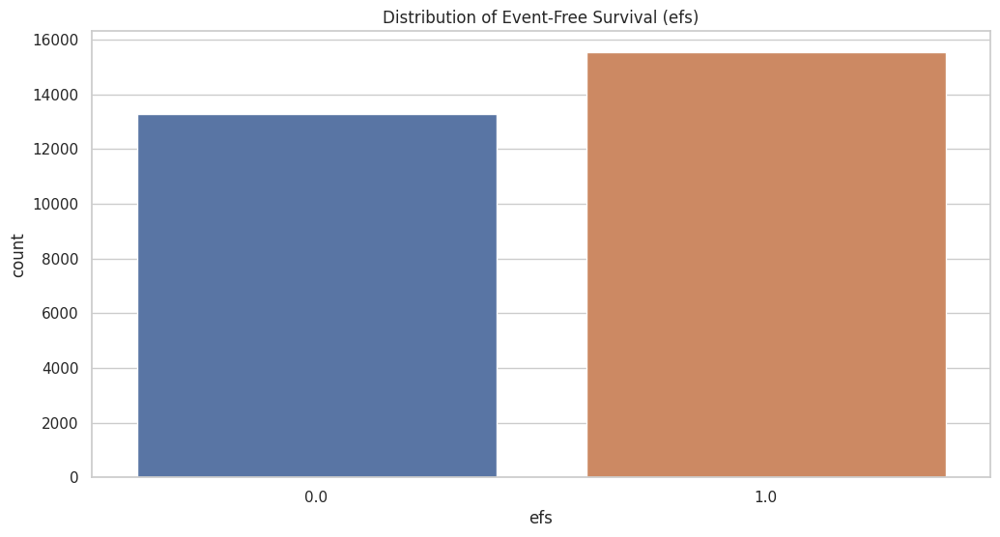

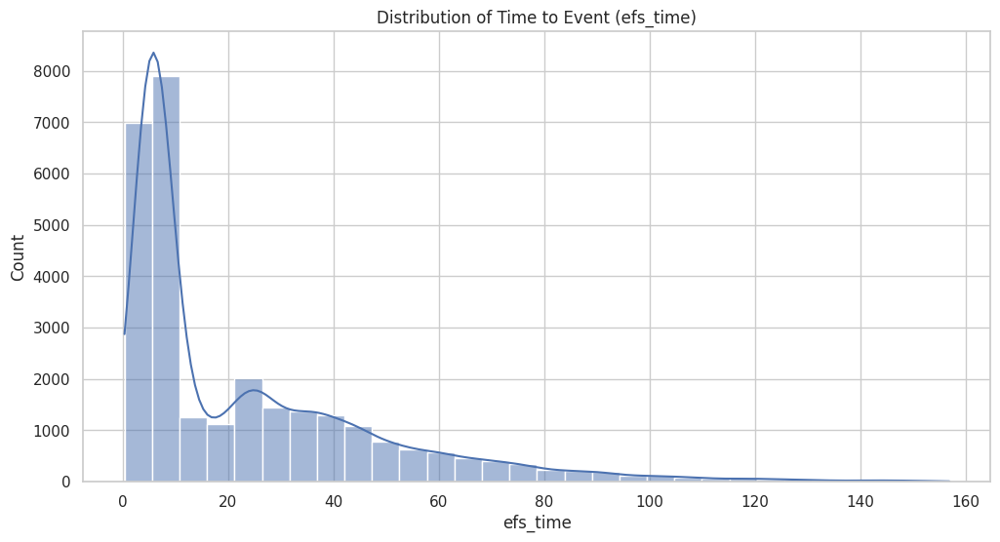

Number of Censored Observations: 13268


In [6]:
######################################################
# 4. Target Variable Analysis
######################################################
print("\n4. 🎯 TARGET VARIABLE ANALYSIS ...")

# Distribution of efs (event-free survival)
plt.figure(figsize=(12, 6))
sns.countplot(x='efs', data=train_df)
plt.title("Distribution of Event-Free Survival (efs)")
plt.show()

# Distribution of efs_time (time to event)
plt.figure(figsize=(12, 6))
sns.histplot(train_df['efs_time'], bins=30, kde=True)
plt.title("Distribution of Time to Event (efs_time)")
plt.show()

# Check for censoring
censored_count = train_df[train_df['efs'] == 0].shape[0]
print(f"Number of Censored Observations: {censored_count}")



<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section analyzes the target variables, <code>efs</code> (event-free survival) and <code>efs_time</code> (time to event-free survival), to understand their distribution and the presence of censoring in the dataset.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Distribution of <code>efs</code>:</strong>
            <ul>
                <li>The target variable <code>efs</code> is binary, with:
                    <ul>
                        <li><strong>0:</strong> Indicates no event-free survival (13,268 observations).</li>
                        <li><strong>1:</strong> Indicates event-free survival (15,532 observations).</li>
                    </ul>
                </li>
                <li>The distribution is relatively balanced, with slightly more patients experiencing event-free survival.</li>
            </ul>
        </li>
        <li><strong>Distribution of <code>efs_time</code>:</strong>
            <ul>
                <li>The time to event-free survival (<code>efs_time</code>) ranges from 0.333 to 156.819 months, with an average of 23.24 months.</li>
                <li>The distribution is right-skewed, indicating that most patients have shorter event-free survival times, while a smaller number of patients have significantly longer survival times.</li>
            </ul>
        </li>
        <li><strong>Censoring:</strong>
            <ul>
                <li>There are <strong>13,268 censored observations</strong> (<code>efs == 0</code>), meaning these patients did not experience the event (e.g., relapse or death) during the study period.</li>
                <li>Censoring is a critical aspect of survival analysis and must be accounted for in the modeling process.</li>
            </ul>
        </li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> The right-skewed distribution of <code>efs_time</code> suggests that the data may require transformation (e.g., log transformation) to better fit certain survival models. Additionally, the presence of censoring necessitates the use of survival analysis techniques (e.g., Cox Proportional Hazards model) rather than traditional regression methods.
        </p>
    </div>
</div>

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        4.BIS 🎯 ENHANCED TARGET VARIABLES ANALYSIS
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section provides a deeper analysis of the target variables (<code>efs</code> and <code>efs_time</code>) by exploring their joint distribution, event rates over time, and key survival statistics. These insights help understand the relationship between event status and time, as well as the overall survival characteristics of the dataset.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Steps:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Joint Distribution of Targets:</strong> A scatter plot is created using <code>sns.scatterplot()</code> to visualize the relationship between <code>efs_time</code> (time to event/censoring) and <code>efs</code> (event status).</li>
        <li><strong>Event Rate Over Time:</strong> The dataset is divided into time windows using <code>pd.qcut()</code>, and the event rate is calculated for each window. A bar plot is created to visualize how the event rate changes over time.</li>
        <li><strong>Survival Statistics:</strong> Key survival statistics are calculated, including the median follow-up time, overall event rate, and 5-year event rate.</li>
    </ul>
</div>


4. 🎯 ENHANCED TARGET VARIABLES ANALYSIS ...


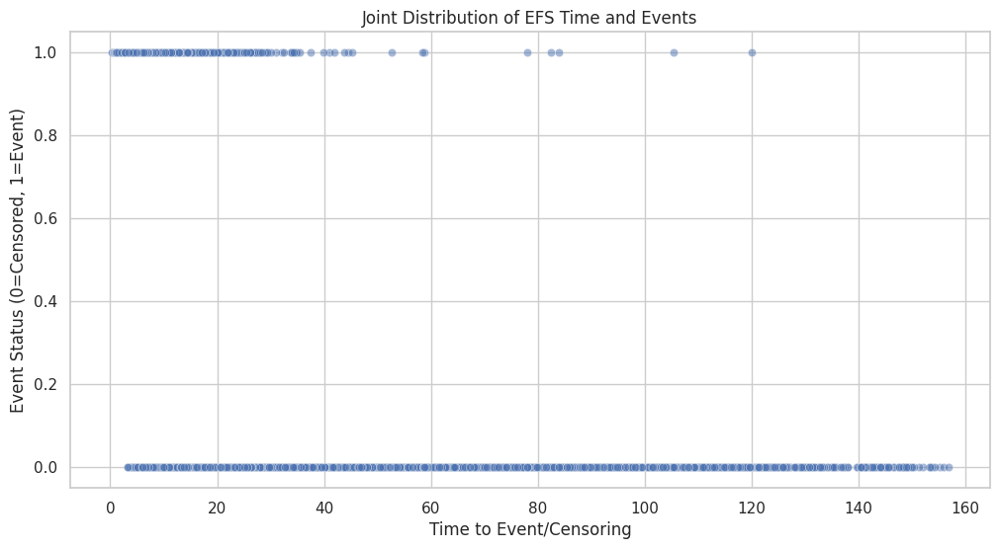

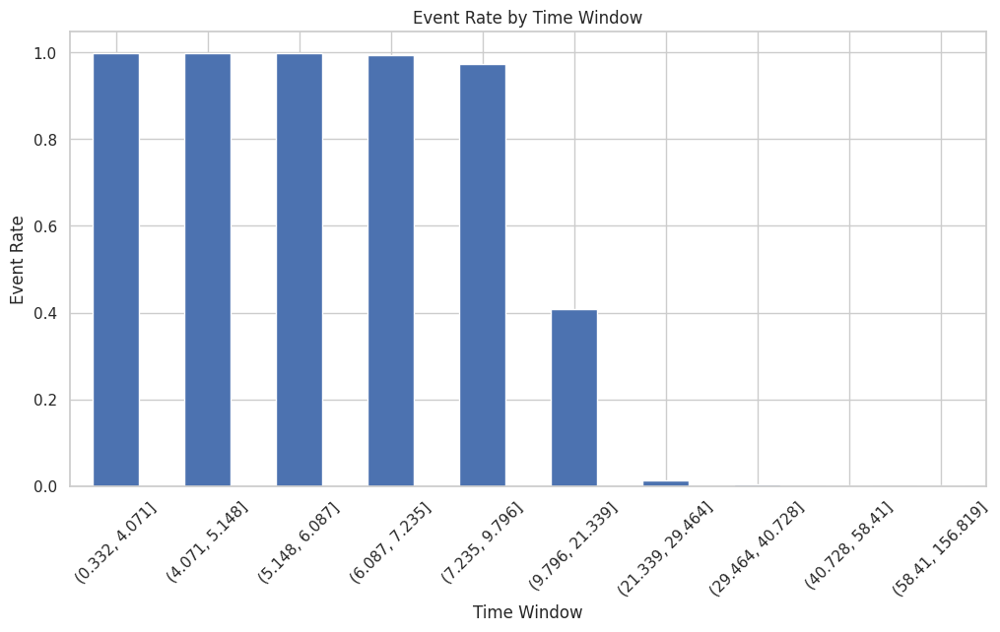


Survival Statistics:
Median follow-up time: 9.80
Overall event rate: 53.93%
5-year event rate: nan%


In [7]:
######################################################
# 4.BIS. Enhanced Target Variables Analysis
######################################################

def analyze_dual_targets(df: pd.DataFrame):
    # 1. Joint Distribution of both targets
    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=df, x='efs_time', y='efs', alpha=0.5)
    plt.title('Joint Distribution of EFS Time and Events')
    plt.xlabel('Time to Event/Censoring')
    plt.ylabel('Event Status (0=Censored, 1=Event)')
    plt.show()
    
    # 2. Event Rate Over Time
    time_windows = pd.qcut(df['efs_time'], q=10)
    event_rates = df.groupby(time_windows)['efs'].mean()
    
    plt.figure(figsize=(12, 6))
    event_rates.plot(kind='bar')
    plt.title('Event Rate by Time Window')
    plt.xlabel('Time Window')
    plt.ylabel('Event Rate')
    plt.xticks(rotation=45)
    plt.show()
    
    # 3. Survival Statistics
    print("\nSurvival Statistics:")
    print(f"Median follow-up time: {df['efs_time'].median():.2f}")
    print(f"Overall event rate: {df['efs'].mean():.2%}")
    print(f"5-year event rate: {df[df['efs_time'] >= 1825]['efs'].mean():.2%}")

print("\n4. 🎯 ENHANCED TARGET VARIABLES ANALYSIS ...")
analyze_dual_targets(train_df)

<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section provides an enhanced analysis of the target variables, <code>efs</code> (event-free survival) and <code>efs_time</code> (time to event-free survival), by examining their joint distribution, event rates over time, and key survival statistics.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Joint Distribution of <code>efs_time</code> and <code>efs</code>:</strong>
            <ul>
                <li>The scatter plot shows the relationship between time to event/censoring (<code>efs_time</code>) and event status (<code>efs</code>).</li>
                <li>Patients with shorter <code>efs_time</code> are more likely to have experienced an event (<code>efs == 1</code>), while those with longer <code>efs_time</code> are more likely to be censored (<code>efs == 0</code>).</li>
            </ul>
        </li>
        <li><strong>Event Rate Over Time:</strong>
            <ul>
                <li>The event rate decreases over time, as shown by the bar plot of event rates across different time windows.</li>
                <li>This indicates that the risk of an event (e.g., relapse or death) is highest in the early stages post-transplant and decreases as time progresses.</li>
            </ul>
        </li>
        <li><strong>Survival Statistics:</strong>
            <ul>
                <li><strong>Median follow-up time:</strong> 9.80 months, indicating that half of the patients were followed for less than 10 months.</li>
                <li><strong>Overall event rate:</strong> 53.93%, meaning slightly more than half of the patients experienced an event during the study period.</li>
                <li><strong>5-year event rate:</strong> The calculation returned <code>nan%</code>, suggesting that very few patients (<code>efs_time >= 1825 days</code>) reached the 5-year mark, making it difficult to estimate the 5-year event rate accurately.</li>
            </ul>
        </li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> The low number of patients reaching the 5-year mark (<code>efs_time >= 1825 days</code>) suggests that long-term survival analysis may be limited due to insufficient data. This could impact the model's ability to predict long-term outcomes accurately.
        </p>
    </div>
</div>

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        5. 📊 ENHANCED FEATURE-TARGET RELATIONSHIPS
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section analyzes the relationships between features and the target variables (<code>efs</code> and <code>efs_time</code>). By exploring these relationships, we can identify which features are most predictive of survival outcomes and understand their impact on the target variables.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Steps:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Numerical Features:</strong>
            <ul>
                <li>Scatter plots are created to visualize the relationship between each numerical feature and <code>efs_time</code>, with points colored by <code>efs</code> (event status).</li>
                <li>Box plots are used to compare the distribution of each numerical feature between event and non-event groups (<code>efs == 1</code> vs. <code>efs == 0</code>).</li>
                <li>Correlation statistics and mean differences are calculated to quantify the relationships.</li>
            </ul>
        </li>
        <li><strong>Categorical Features:</strong>
            <ul>
                <li>Box plots are created to visualize the distribution of <code>efs_time</code> across categories of each categorical feature.</li>
                <li>Bar plots are used to show the event rate (<code>efs</code>) for each category.</li>
                <li>Summary statistics (mean, median, and event rate) are calculated for each category.</li>
            </ul>
        </li>
    </ul>
</div>


5. 📊 ENHANCED FEATURE-TARGET RELATIONSHIPS ...


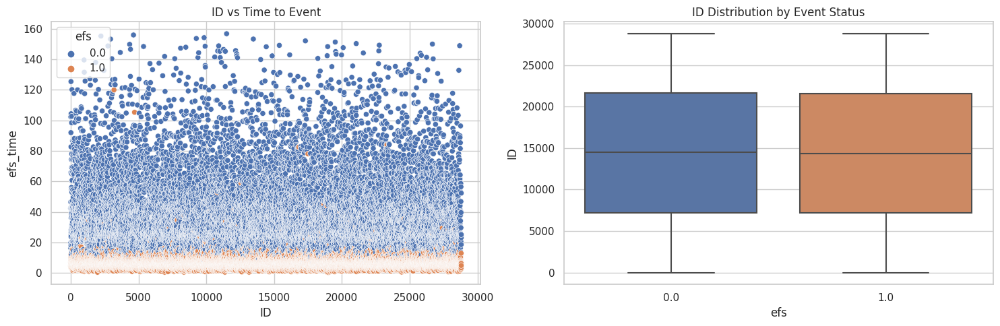


Correlation Statistics for ID:
Correlation with efs_time: -0.001
Mean difference between events vs non-events: -58.665


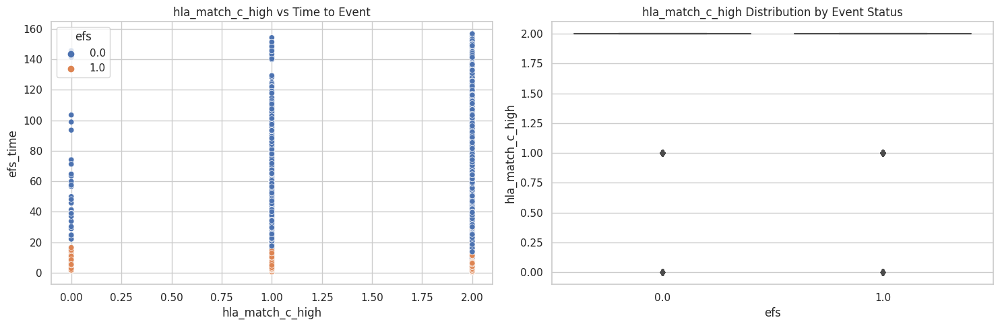


Correlation Statistics for hla_match_c_high:
Correlation with efs_time: 0.033
Mean difference between events vs non-events: 0.028


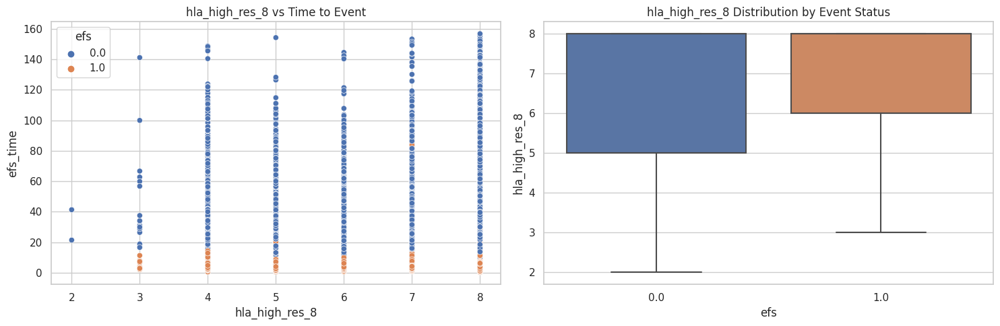


Correlation Statistics for hla_high_res_8:
Correlation with efs_time: 0.038
Mean difference between events vs non-events: 0.139


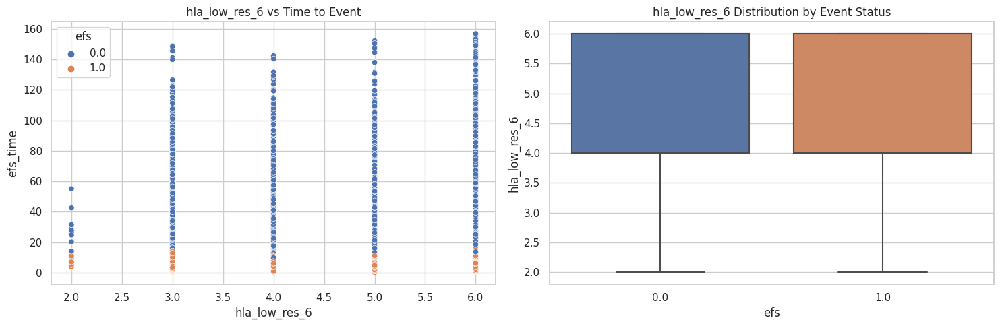


Correlation Statistics for hla_low_res_6:
Correlation with efs_time: 0.032
Mean difference between events vs non-events: 0.114


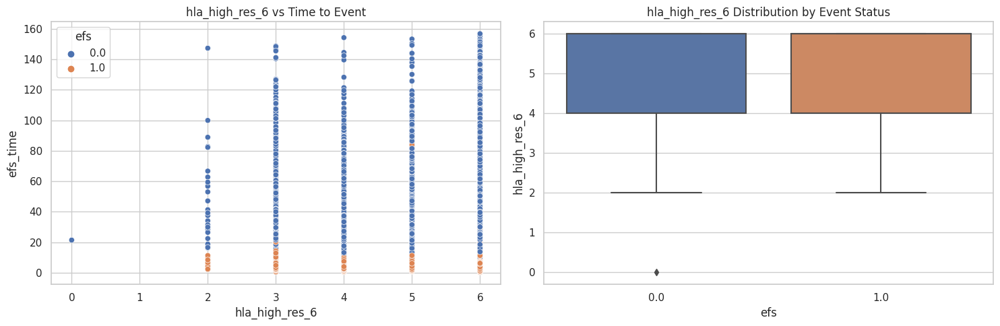


Correlation Statistics for hla_high_res_6:
Correlation with efs_time: 0.036
Mean difference between events vs non-events: 0.110


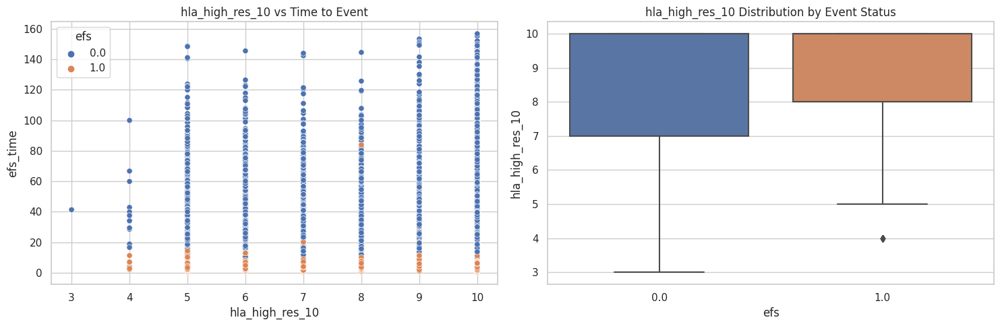


Correlation Statistics for hla_high_res_10:
Correlation with efs_time: 0.034
Mean difference between events vs non-events: 0.185


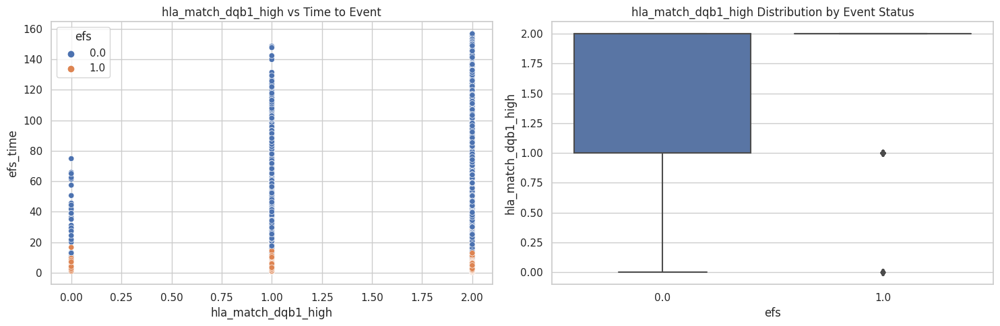


Correlation Statistics for hla_match_dqb1_high:
Correlation with efs_time: 0.018
Mean difference between events vs non-events: 0.036


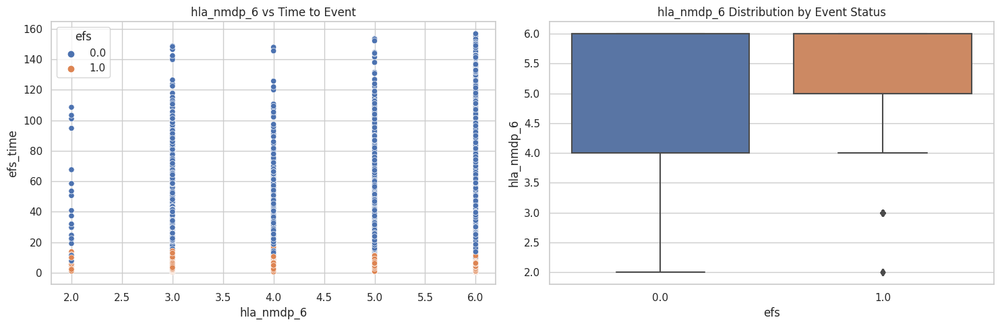


Correlation Statistics for hla_nmdp_6:
Correlation with efs_time: 0.039
Mean difference between events vs non-events: 0.097


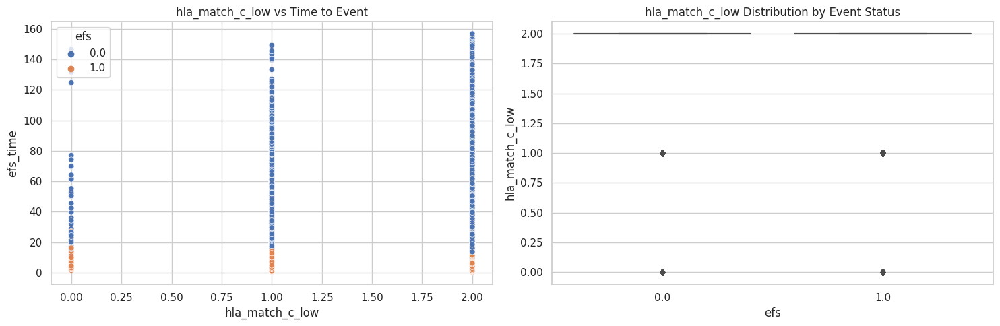


Correlation Statistics for hla_match_c_low:
Correlation with efs_time: 0.043
Mean difference between events vs non-events: 0.014


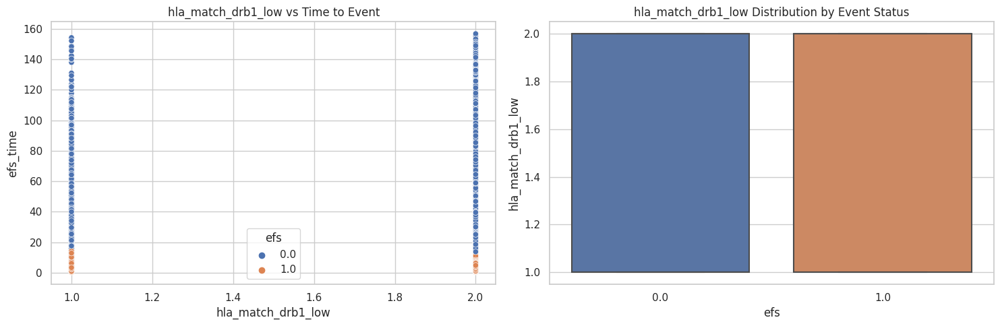


Correlation Statistics for hla_match_drb1_low:
Correlation with efs_time: 0.011
Mean difference between events vs non-events: 0.061


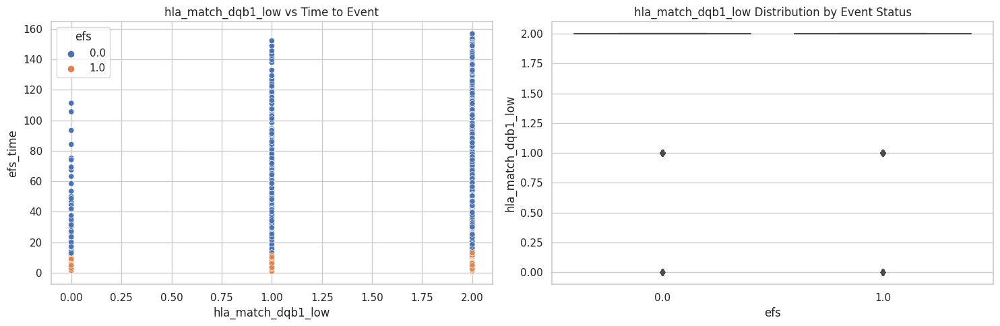


Correlation Statistics for hla_match_dqb1_low:
Correlation with efs_time: 0.021
Mean difference between events vs non-events: 0.028


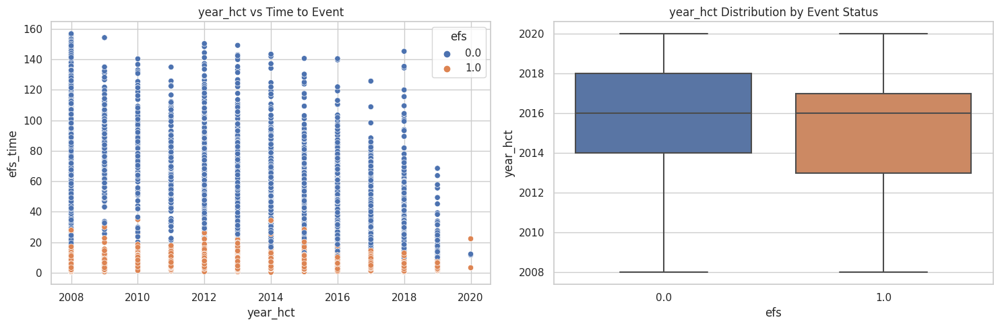


Correlation Statistics for year_hct:
Correlation with efs_time: -0.256
Mean difference between events vs non-events: -0.673


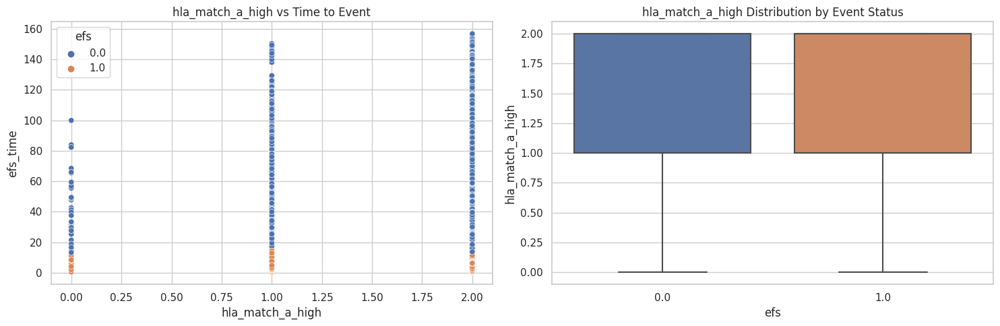


Correlation Statistics for hla_match_a_high:
Correlation with efs_time: 0.043
Mean difference between events vs non-events: 0.015


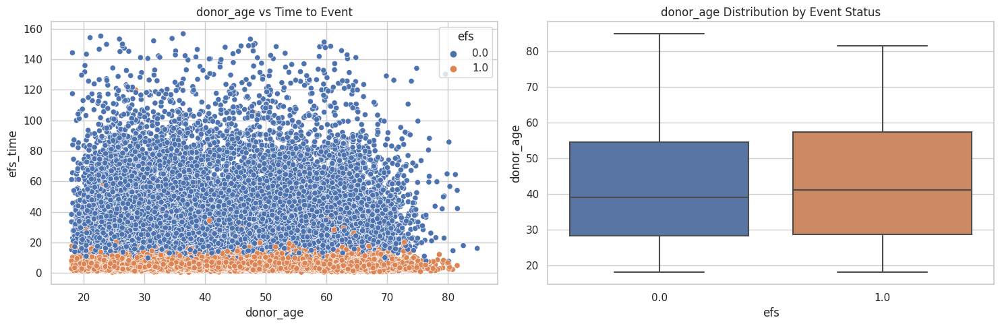


Correlation Statistics for donor_age:
Correlation with efs_time: -0.015
Mean difference between events vs non-events: 1.459


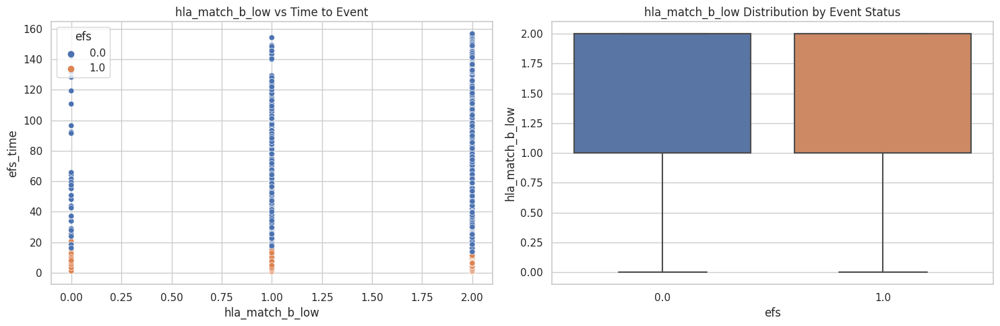


Correlation Statistics for hla_match_b_low:
Correlation with efs_time: 0.022
Mean difference between events vs non-events: 0.037


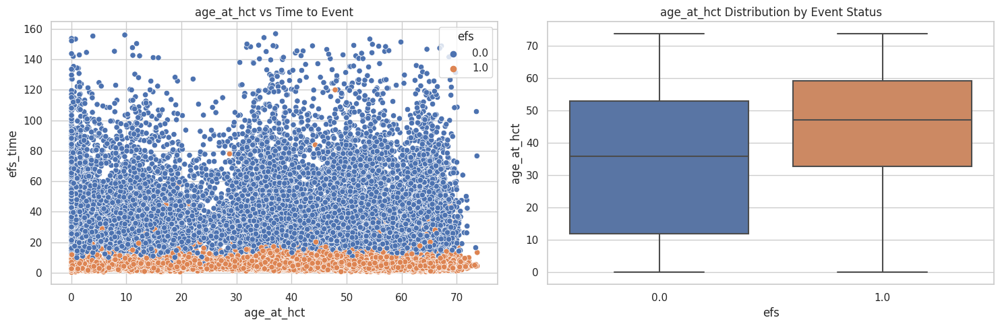


Correlation Statistics for age_at_hct:
Correlation with efs_time: -0.146
Mean difference between events vs non-events: 9.667


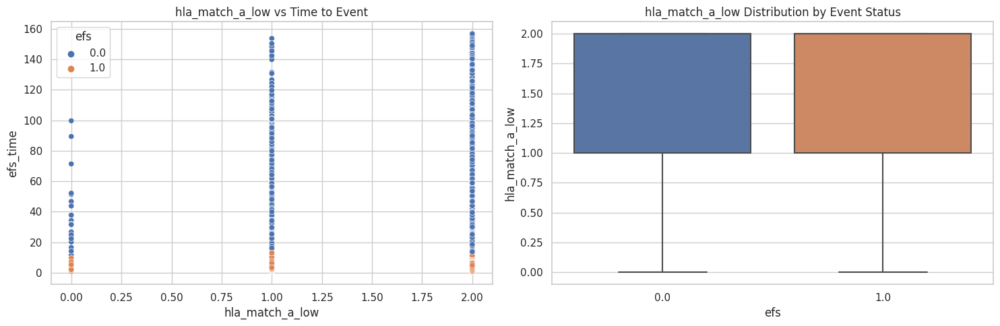


Correlation Statistics for hla_match_a_low:
Correlation with efs_time: 0.049
Mean difference between events vs non-events: 0.014


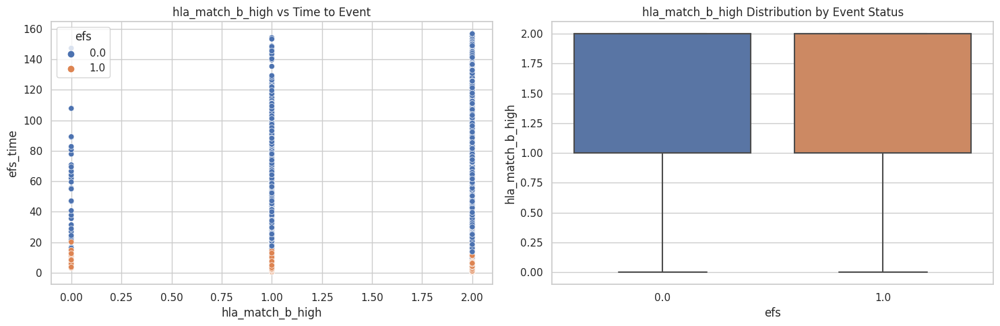


Correlation Statistics for hla_match_b_high:
Correlation with efs_time: 0.036
Mean difference between events vs non-events: 0.025


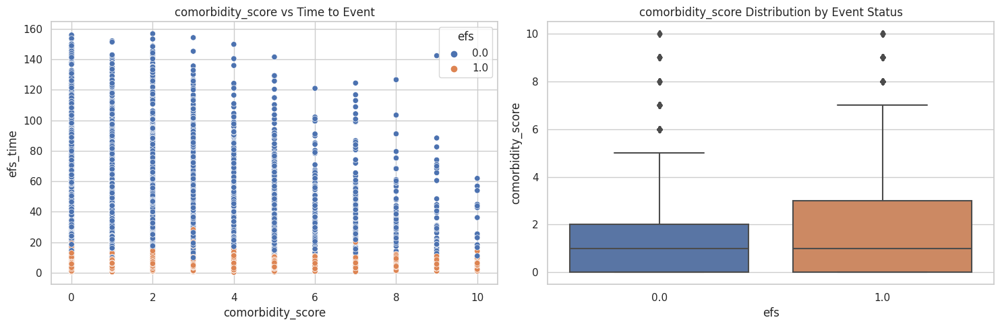


Correlation Statistics for comorbidity_score:
Correlation with efs_time: -0.144
Mean difference between events vs non-events: 0.583


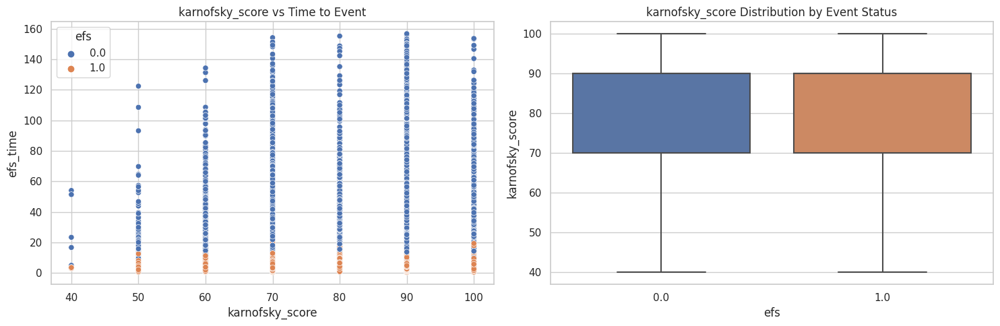


Correlation Statistics for karnofsky_score:
Correlation with efs_time: 0.098
Mean difference between events vs non-events: -2.018


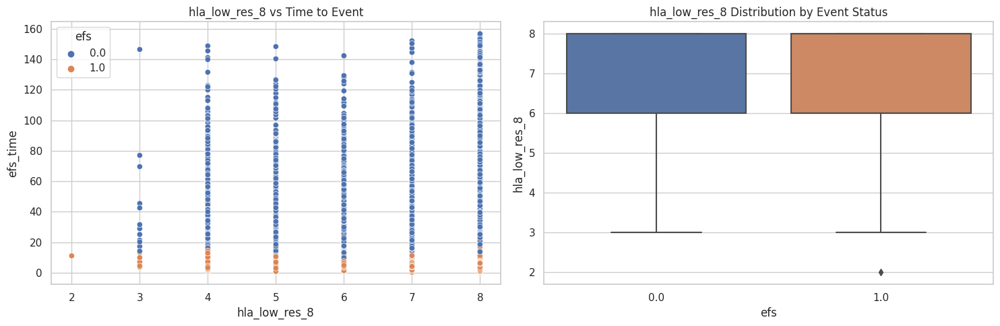


Correlation Statistics for hla_low_res_8:
Correlation with efs_time: 0.038
Mean difference between events vs non-events: 0.128


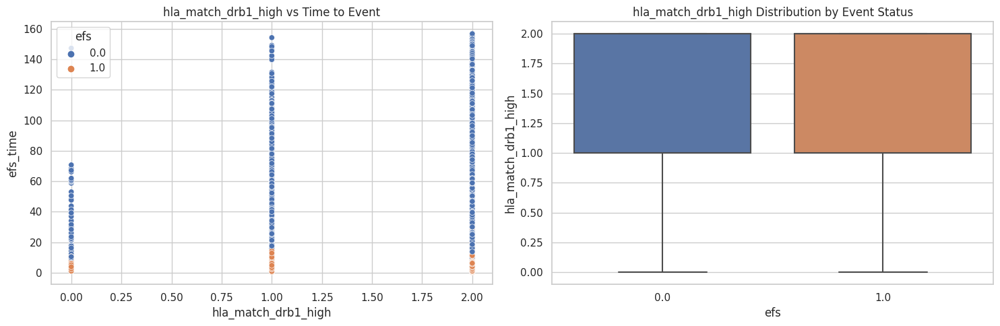


Correlation Statistics for hla_match_drb1_high:
Correlation with efs_time: 0.010
Mean difference between events vs non-events: 0.069


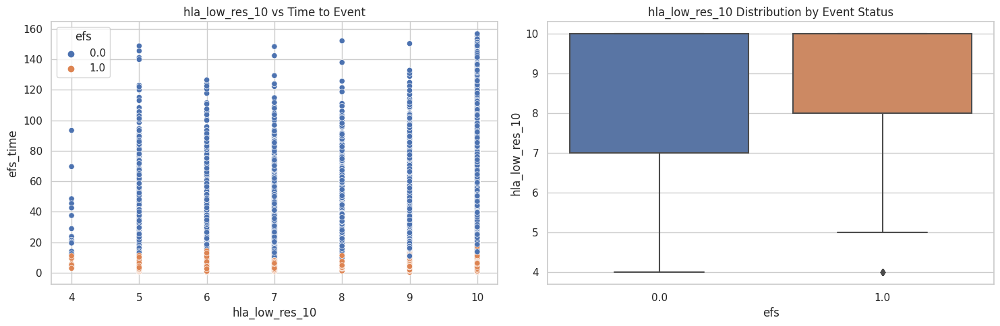


Correlation Statistics for hla_low_res_10:
Correlation with efs_time: 0.036
Mean difference between events vs non-events: 0.158


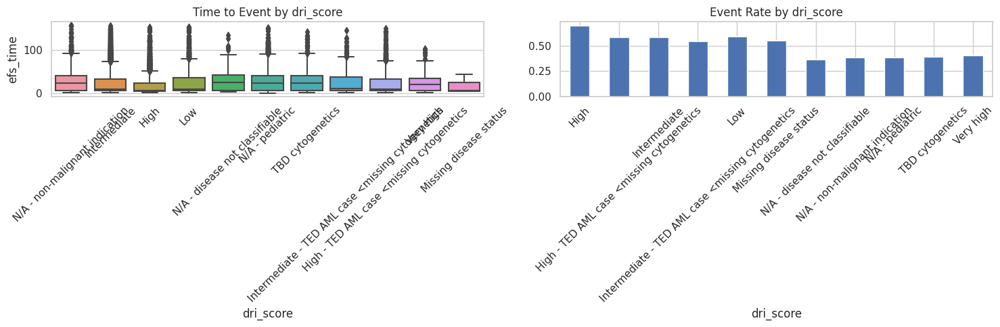


Summary Statistics for dri_score:
                                                  efs_time          efs
                                                      mean median  mean
dri_score                                                              
High                                                 17.34   6.03  0.71
High - TED AML case <missing cytogenetics            22.66   8.70  0.59
Intermediate                                         22.34   9.06  0.59
Intermediate - TED AML case <missing cytogenetics    24.30  10.75  0.55
Low                                                  24.33   8.99  0.59
Missing disease status                               16.64   6.41  0.56
N/A - disease not classifiable                       28.27  24.71  0.37
N/A - non-malignant indication                       27.30  22.70  0.39
N/A - pediatric                                      26.81  22.56  0.39
TBD cytogenetics                                     26.43  22.39  0.39
Very high                    

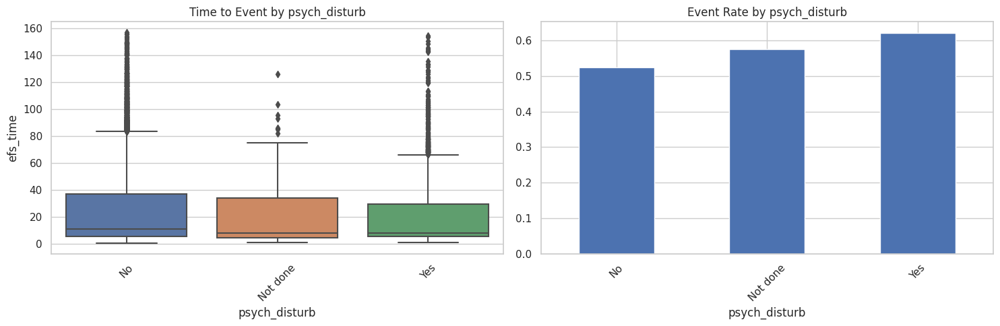


Summary Statistics for psych_disturb:
              efs_time          efs
                  mean median  mean
psych_disturb                      
No               24.21  10.76  0.52
Not done         21.87   8.22  0.58
Yes              20.15   7.73  0.62


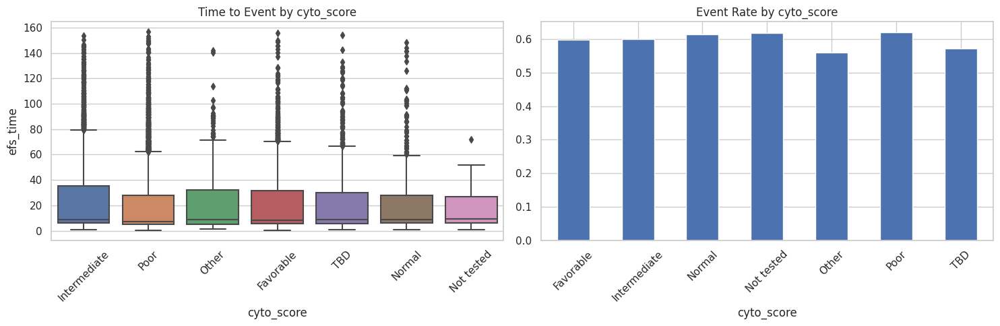


Summary Statistics for cyto_score:
             efs_time          efs
                 mean median  mean
cyto_score                        
Favorable       21.67   8.47  0.60
Intermediate    23.05   8.72  0.60
Normal          20.66   8.74  0.61
Not tested      17.13   9.28  0.62
Other           21.48   8.65  0.56
Poor            19.47   7.28  0.62
TBD             20.77   8.75  0.57


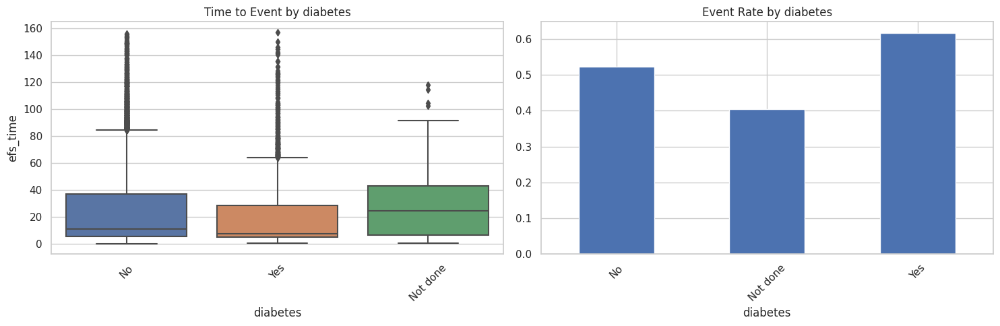


Summary Statistics for diabetes:
         efs_time          efs
             mean median  mean
diabetes                      
No          24.37  10.85  0.52
Not done    29.06  24.46  0.40
Yes         19.51   7.54  0.62


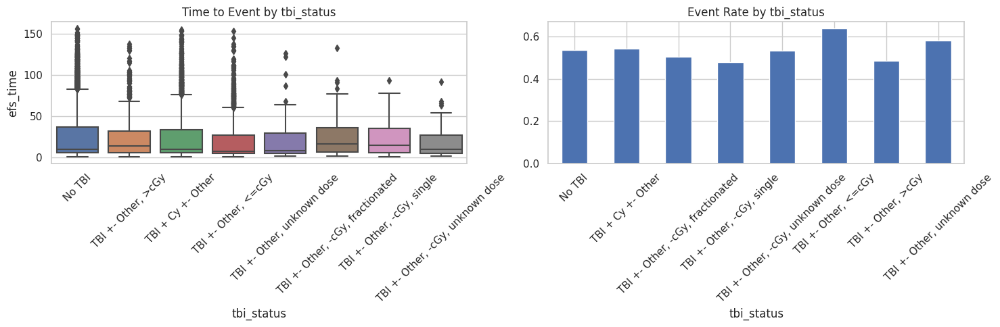


Summary Statistics for tbi_status:
                                 efs_time          efs
                                     mean median  mean
tbi_status                                            
No TBI                              23.89   9.96  0.53
TBI + Cy +- Other                   22.68   9.78  0.54
TBI +- Other, -cGy, fractionated    24.66  16.29  0.50
TBI +- Other, -cGy, single          21.76  14.33  0.48
TBI +- Other, -cGy, unknown dose    18.23   9.28  0.53
TBI +- Other, <=cGy                 20.00   7.49  0.64
TBI +- Other, >cGy                  21.63  14.09  0.48
TBI +- Other, unknown dose          21.40   8.17  0.58


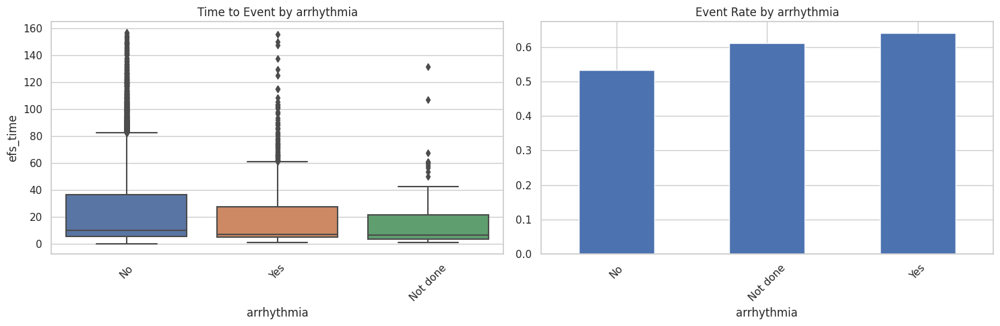


Summary Statistics for arrhythmia:
           efs_time          efs
               mean median  mean
arrhythmia                      
No            23.94  10.20  0.53
Not done      15.92   6.64  0.61
Yes           19.33   7.33  0.64


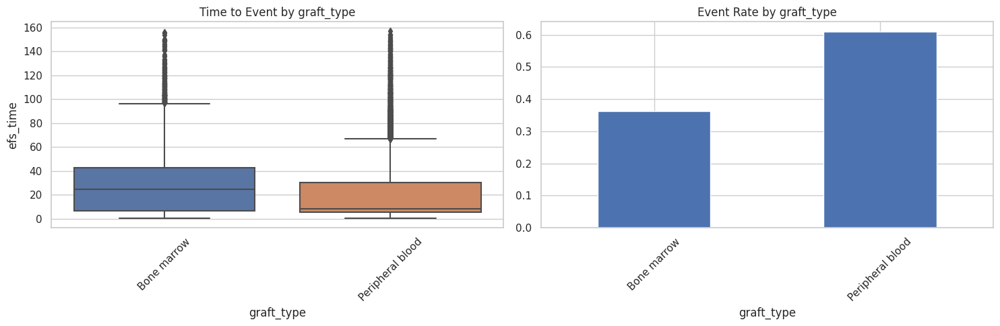


Summary Statistics for graft_type:
                 efs_time          efs
                     mean median  mean
graft_type                            
Bone marrow         29.09  24.48  0.36
Peripheral blood    20.89   8.03  0.61


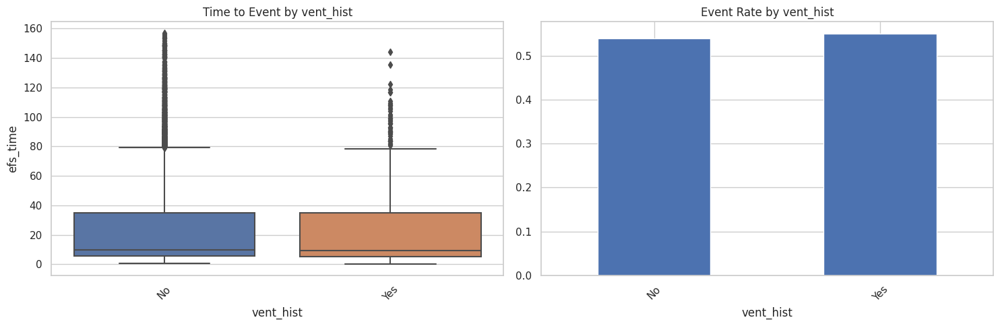


Summary Statistics for vent_hist:
          efs_time          efs
              mean median  mean
vent_hist                      
No           23.21   9.76  0.54
Yes          23.35   9.39  0.55


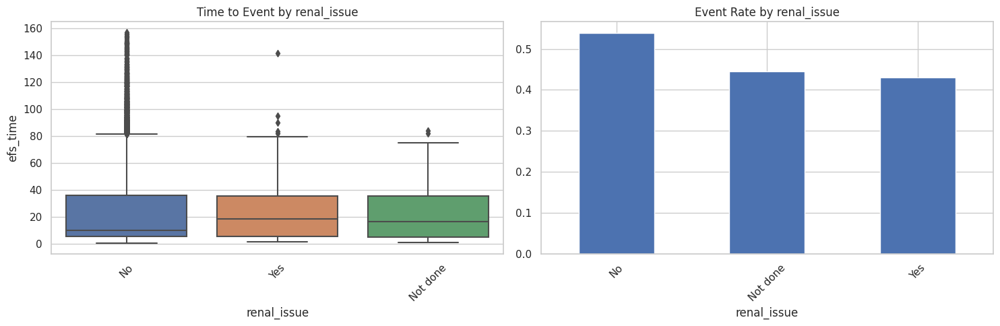


Summary Statistics for renal_issue:
            efs_time          efs
                mean median  mean
renal_issue                      
No             23.63   9.87  0.54
Not done       22.24  16.60  0.45
Yes            24.31  18.41  0.43


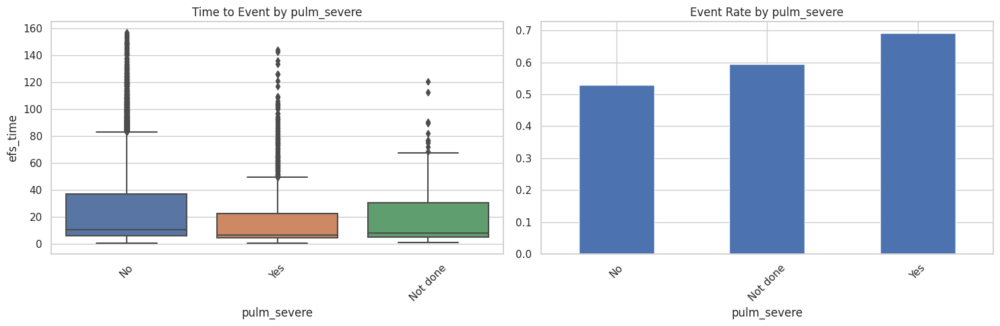


Summary Statistics for pulm_severe:
            efs_time          efs
                mean median  mean
pulm_severe                      
No             24.07  10.38  0.53
Not done       21.17   7.79  0.59
Yes            17.03   6.55  0.69


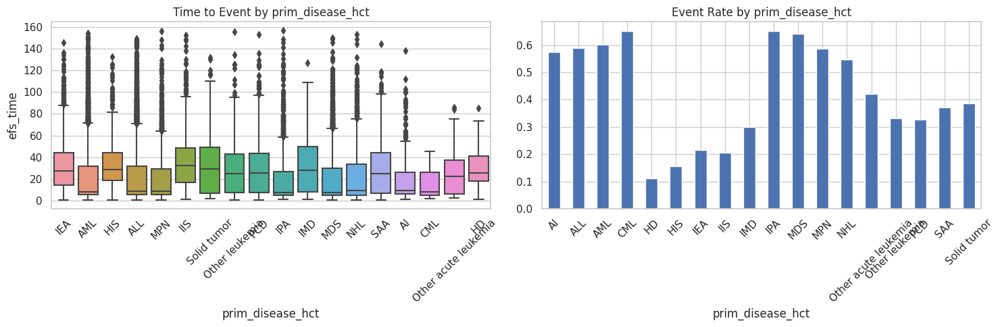


Summary Statistics for prim_disease_hct:
                     efs_time          efs
                         mean median  mean
prim_disease_hct                          
AI                      19.67   9.18  0.57
ALL                     21.58   8.46  0.59
AML                     21.29   8.08  0.60
CML                     15.32   7.76  0.65
HD                      30.62  25.45  0.11
HIS                     34.22  28.47  0.16
IEA                     32.52  27.63  0.22
IIS                     35.80  32.22  0.21
IMD                     33.64  27.71  0.30
IPA                     19.25   7.48  0.65
MDS                     20.24   7.28  0.64
MPN                     21.26   8.78  0.59
NHL                     23.20   9.34  0.55
Other acute leukemia    24.75  22.67  0.42
Other leukemia          30.34  24.98  0.33
PCD                     30.15  25.48  0.33
SAA                     29.66  24.87  0.37
Solid tumor             33.02  28.98  0.39


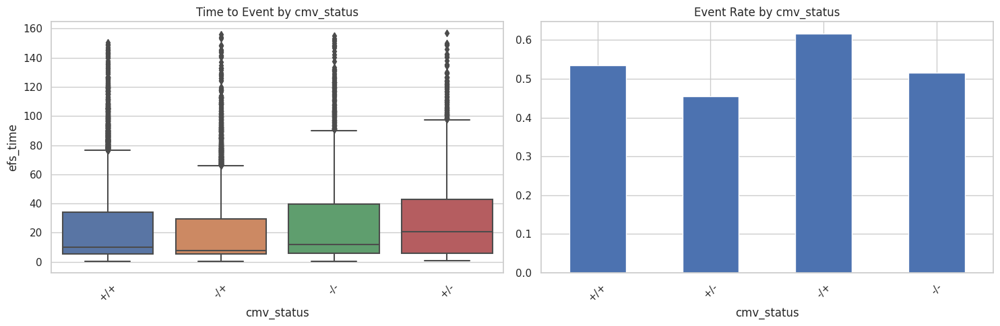


Summary Statistics for cmv_status:
           efs_time          efs
               mean median  mean
cmv_status                      
+/+           22.49   9.83  0.53
+/-           28.23  20.64  0.46
-/+           20.35   7.83  0.62
-/-           26.07  12.07  0.52


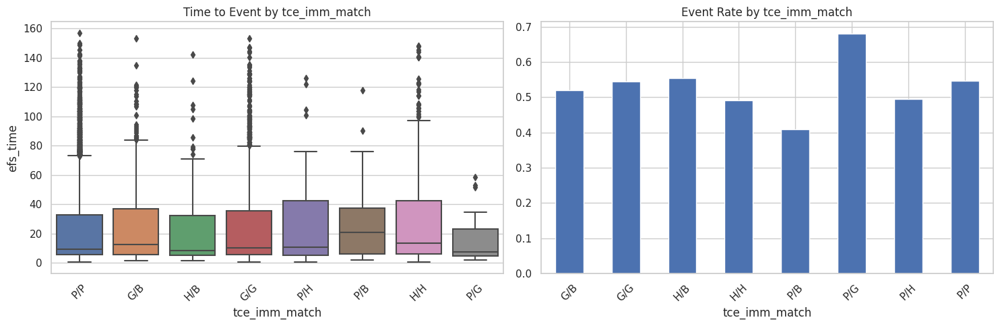


Summary Statistics for tce_imm_match:
              efs_time          efs
                  mean median  mean
tce_imm_match                      
G/B              24.75  12.67  0.52
G/G              24.20   9.96  0.54
H/B              21.11   8.45  0.55
H/H              26.99  13.48  0.49
P/B              26.01  20.95  0.41
P/G              16.02   7.62  0.68
P/H              27.08  10.80  0.49
P/P              21.59   9.21  0.55


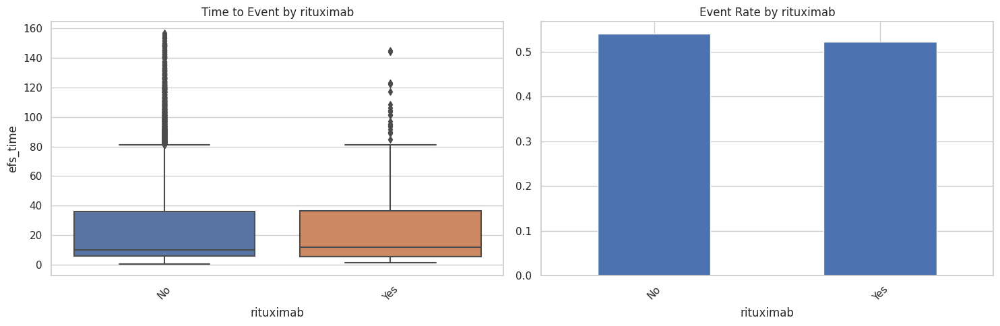


Summary Statistics for rituximab:
          efs_time          efs
              mean median  mean
rituximab                      
No           23.58   9.82  0.54
Yes          24.26  11.71  0.52


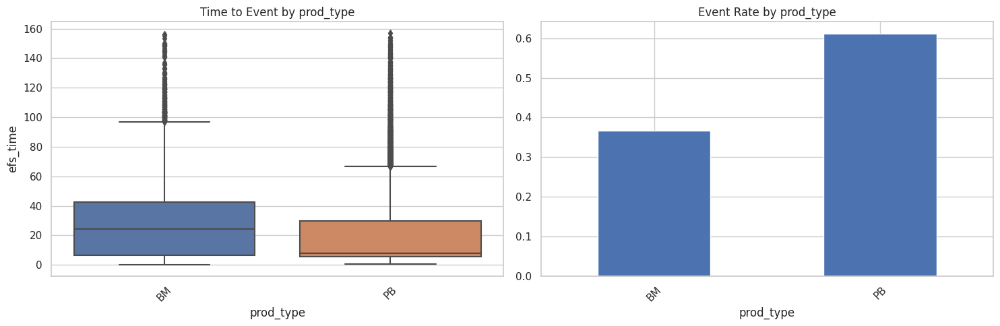


Summary Statistics for prod_type:
          efs_time          efs
              mean median  mean
prod_type                      
BM           29.00  24.30  0.37
PB           20.86   8.01  0.61


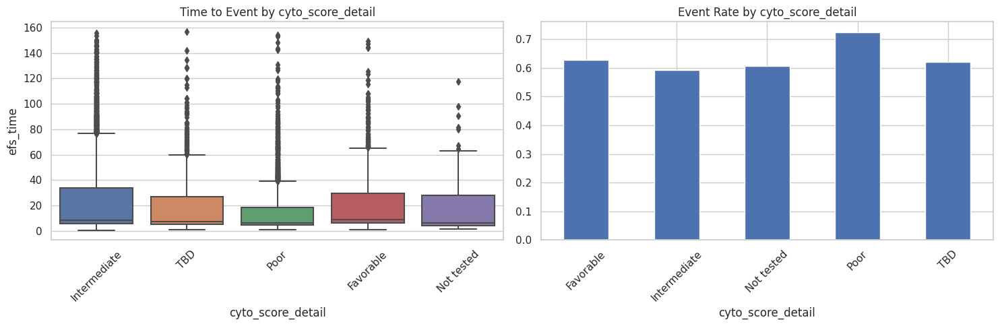


Summary Statistics for cyto_score_detail:
                  efs_time          efs
                      mean median  mean
cyto_score_detail                      
Favorable            21.25   9.08  0.63
Intermediate         22.57   8.50  0.59
Not tested           18.99   6.04  0.61
Poor                 15.41   6.03  0.72
TBD                  19.17   7.37  0.62


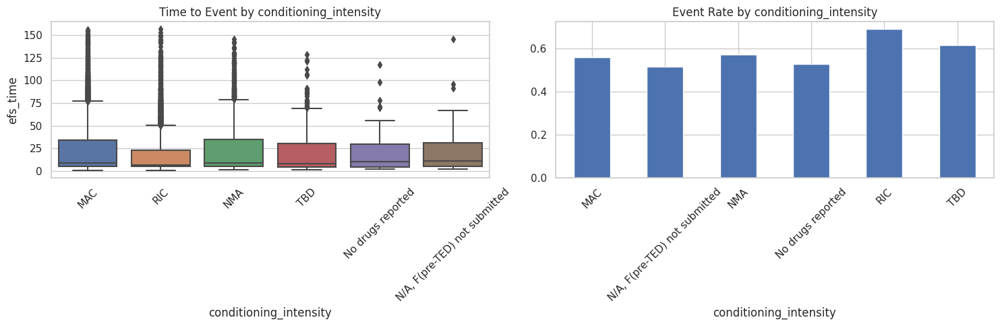


Summary Statistics for conditioning_intensity:
                              efs_time          efs
                                  mean median  mean
conditioning_intensity                             
MAC                              22.95   9.06  0.56
N/A, F(pre-TED) not submitted    22.70  11.09  0.52
NMA                              22.66   8.71  0.57
No drugs reported                20.24  10.37  0.53
RIC                              17.52   7.04  0.69
TBD                              21.14   8.22  0.62


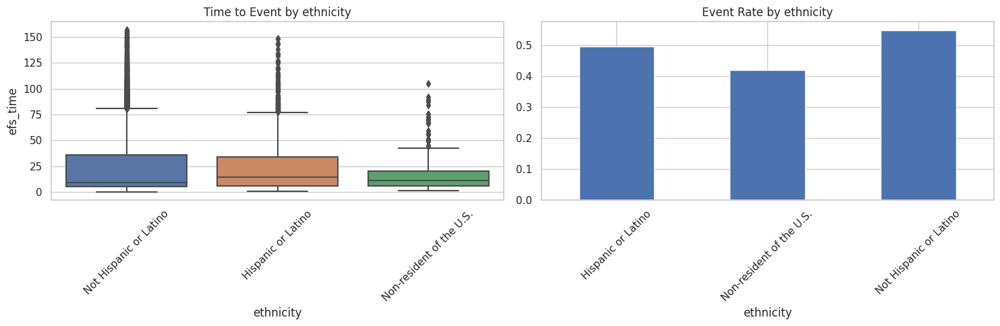


Summary Statistics for ethnicity:
                         efs_time          efs
                             mean median  mean
ethnicity                                     
Hispanic or Latino          22.96  14.16  0.50
Non-resident of the U.S.    16.09  10.91  0.42
Not Hispanic or Latino      23.46   9.48  0.55


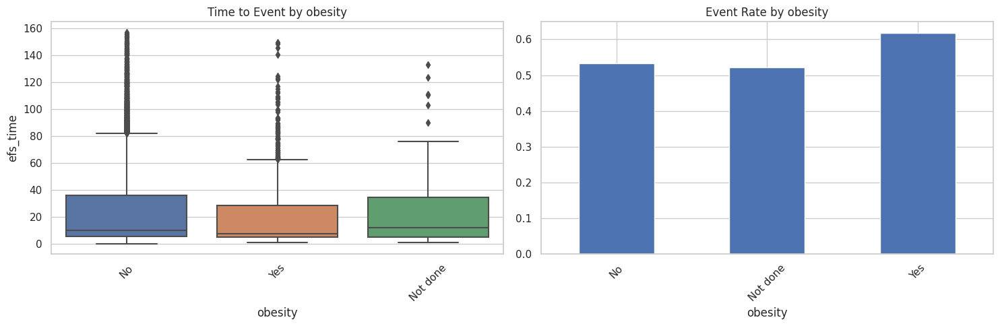


Summary Statistics for obesity:
         efs_time          efs
             mean median  mean
obesity                       
No          23.84  10.12  0.53
Not done    25.59  12.19  0.52
Yes         19.57   7.80  0.62


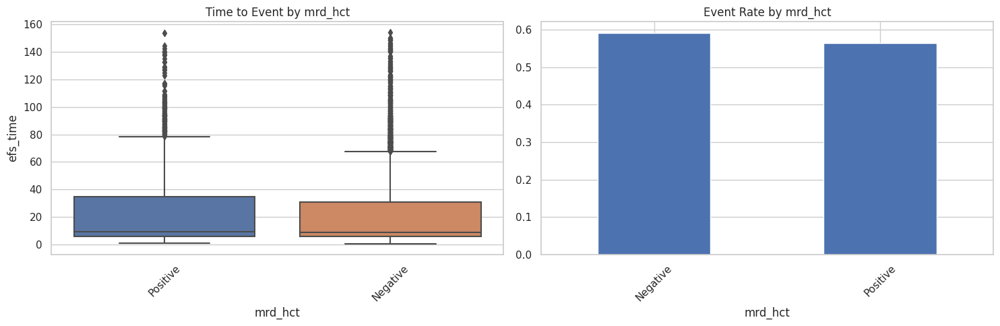


Summary Statistics for mrd_hct:
         efs_time          efs
             mean median  mean
mrd_hct                       
Negative    21.69   8.75  0.59
Positive    22.20   9.09  0.56


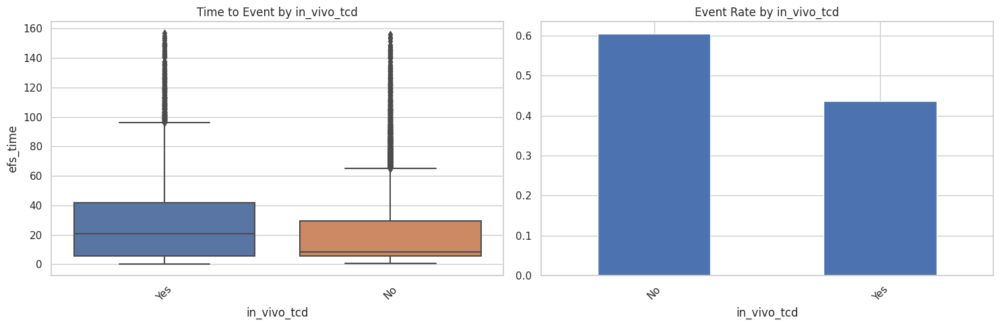


Summary Statistics for in_vivo_tcd:
            efs_time          efs
                mean median  mean
in_vivo_tcd                      
No             20.46   8.27  0.60
Yes            27.49  20.80  0.44


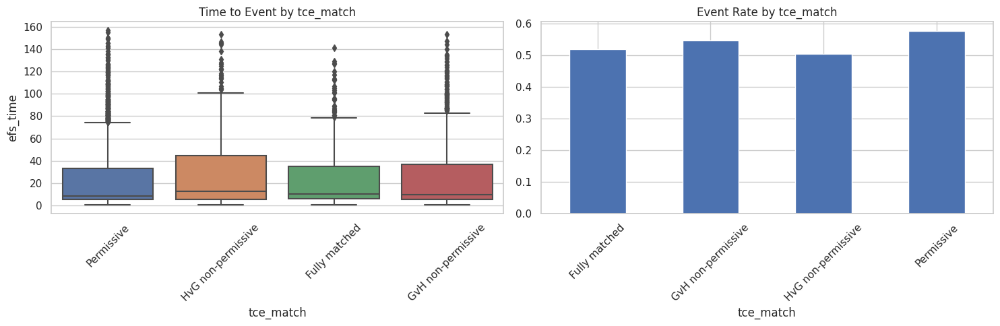


Summary Statistics for tce_match:
                   efs_time          efs
                       mean median  mean
tce_match                               
Fully matched         22.84  10.07  0.52
GvH non-permissive    24.85   9.62  0.55
HvG non-permissive    27.97  12.59  0.51
Permissive            22.04   8.29  0.58


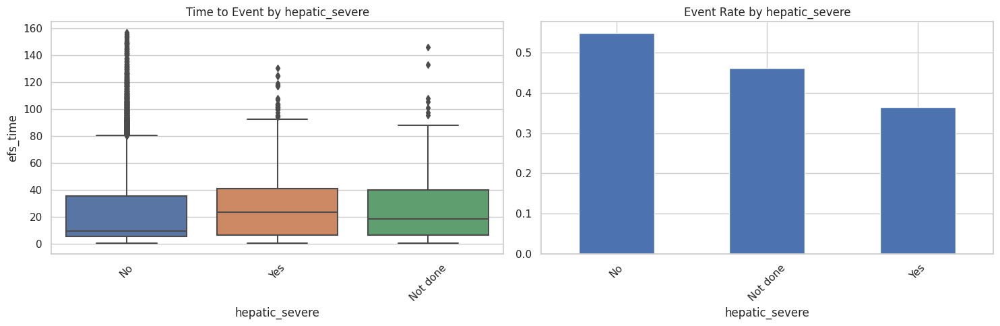


Summary Statistics for hepatic_severe:
               efs_time          efs
                   mean median  mean
hepatic_severe                      
No                23.36   9.40  0.55
Not done          26.89  18.57  0.46
Yes               27.32  23.65  0.36


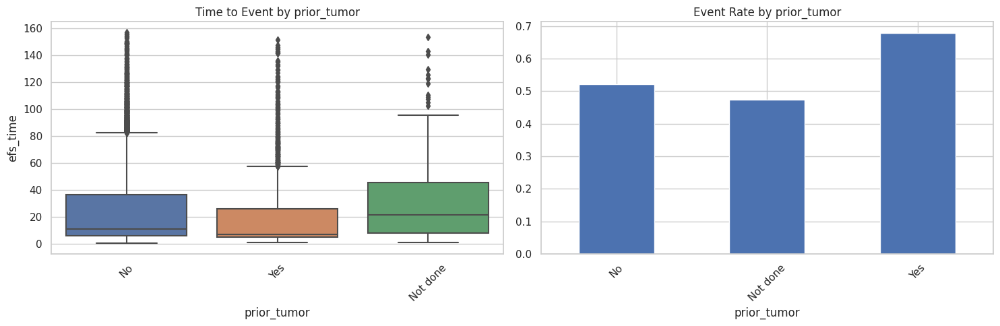


Summary Statistics for prior_tumor:
            efs_time          efs
                mean median  mean
prior_tumor                      
No             23.98  10.77  0.52
Not done       31.22  21.57  0.47
Yes            19.26   7.22  0.68


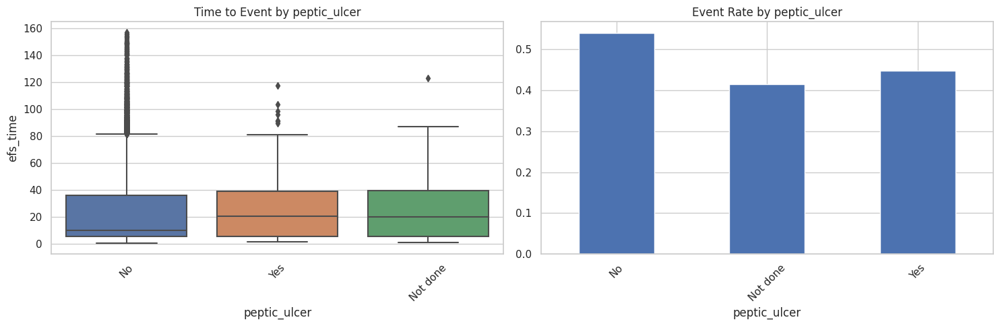


Summary Statistics for peptic_ulcer:
             efs_time          efs
                 mean median  mean
peptic_ulcer                      
No              23.60   9.79  0.54
Not done        25.58  19.72  0.42
Yes             26.01  20.39  0.45


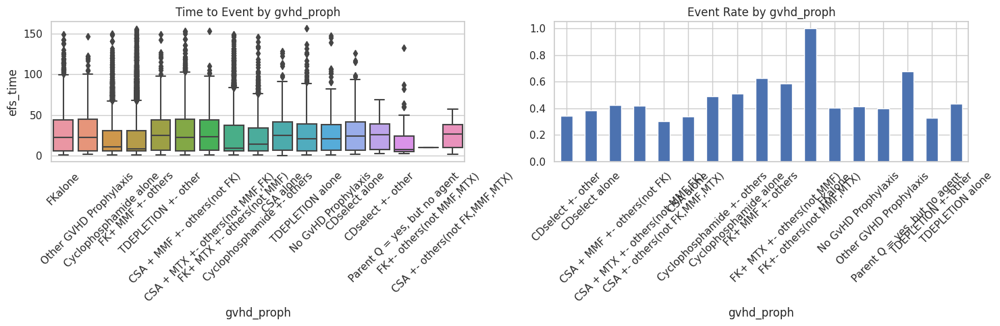


Summary Statistics for gvhd_proph:
                                efs_time          efs
                                    mean median  mean
gvhd_proph                                           
CDselect +- other                  26.36  25.31  0.35
CDselect alone                     27.92  23.62  0.38
CSA + MMF +- others(not FK)        28.80  22.56  0.42
CSA + MTX +- others(not MMF,FK)    29.70  22.80  0.42
CSA +- others(not FK,MMF,MTX)      25.46  26.19  0.30
CSA alone                          29.77  24.41  0.34
Cyclophosphamide +- others         22.27  14.25  0.49
Cyclophosphamide alone             20.98  10.82  0.51
FK+ MMF +- others                  21.07   7.88  0.62
FK+ MTX +- others(not MMF)         23.87   8.89  0.59
FK+- others(not MMF,MTX)            9.98   9.98  1.00
FKalone                            29.22  22.65  0.40
No GvHD Prophylaxis                26.97  20.69  0.42
Other GVHD Prophylaxis             29.34  22.35  0.40
Parent Q = yes, but no agent       18.62   7.0

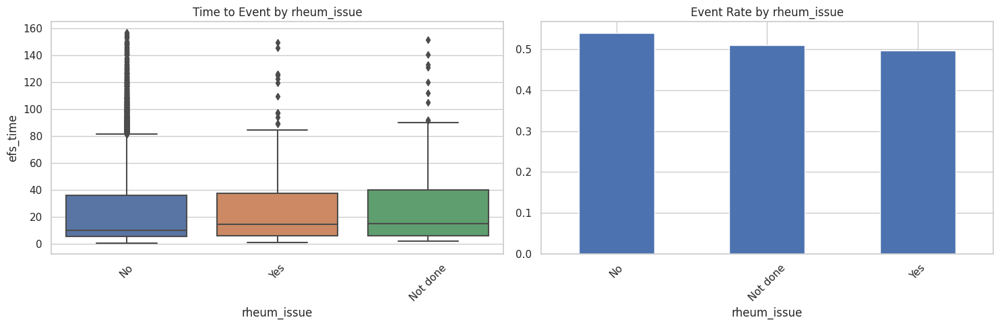


Summary Statistics for rheum_issue:
            efs_time          efs
                mean median  mean
rheum_issue                      
No             23.59   9.80  0.54
Not done       28.93  14.89  0.51
Yes            24.98  14.26  0.50


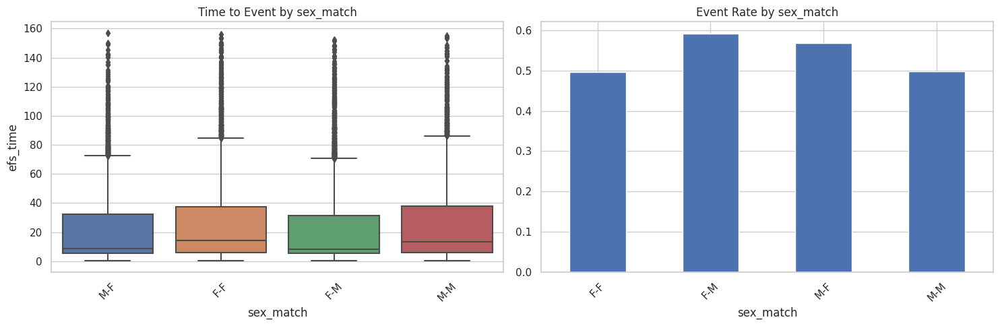


Summary Statistics for sex_match:
          efs_time          efs
              mean median  mean
sex_match                      
F-F          25.67  14.06  0.50
F-M          21.27   8.40  0.59
M-F          21.57   8.51  0.57
M-M          24.70  13.27  0.50


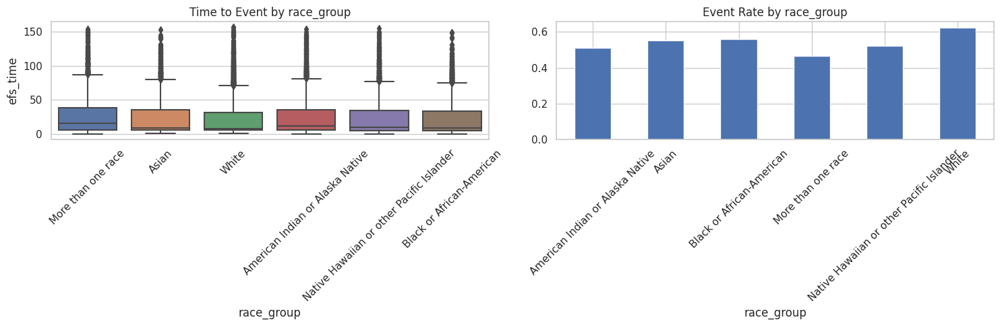


Summary Statistics for race_group:
                                          efs_time          efs
                                              mean median  mean
race_group                                                     
American Indian or Alaska Native             24.16  11.78  0.51
Asian                                        22.63   8.97  0.55
Black or African-American                    21.81   8.54  0.56
More than one race                           25.91  16.07  0.47
Native Hawaiian or other Pacific Islander    23.07  10.43  0.52
White                                        21.83   7.98  0.63


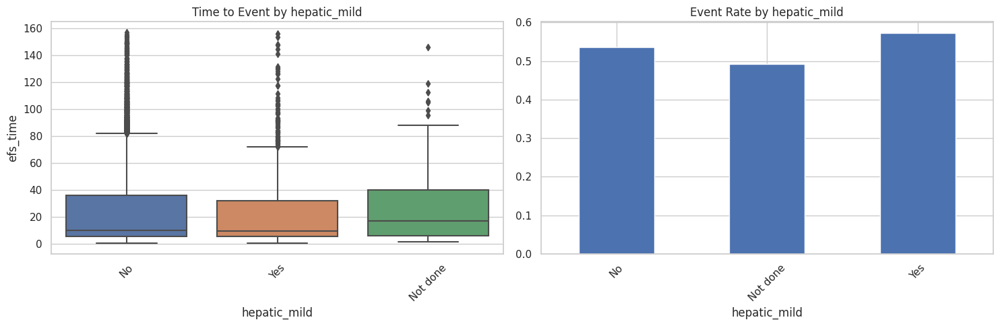


Summary Statistics for hepatic_mild:
             efs_time          efs
                 mean median  mean
hepatic_mild                      
No              23.68   9.91  0.54
Not done        26.58  16.98  0.49
Yes             21.93   9.27  0.57


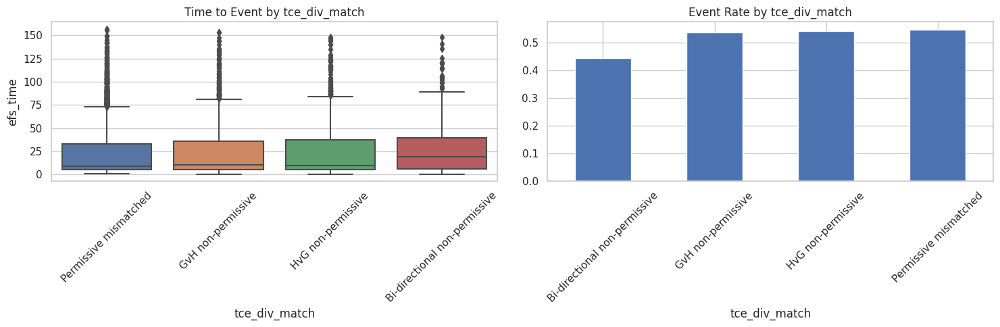


Summary Statistics for tce_div_match:
                              efs_time          efs
                                  mean median  mean
tce_div_match                                      
Bi-directional non-permissive    27.20  18.98  0.44
GvH non-permissive               24.22  10.16  0.54
HvG non-permissive               24.84   9.86  0.54
Permissive mismatched            21.64   9.17  0.55


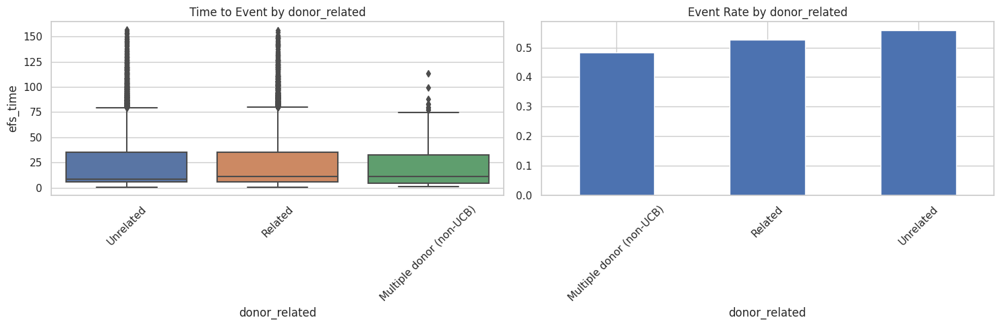


Summary Statistics for donor_related:
                         efs_time          efs
                             mean median  mean
donor_related                                 
Multiple donor (non-UCB)    20.83  10.97  0.48
Related                     23.39  10.80  0.53
Unrelated                   23.09   8.68  0.56


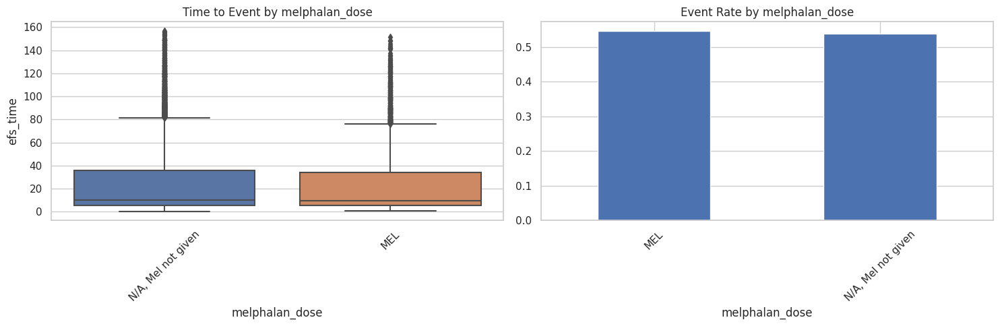


Summary Statistics for melphalan_dose:
                   efs_time          efs
                       mean median  mean
melphalan_dose                          
MEL                   22.23   9.45  0.55
N/A, Mel not given    23.84   9.87  0.54


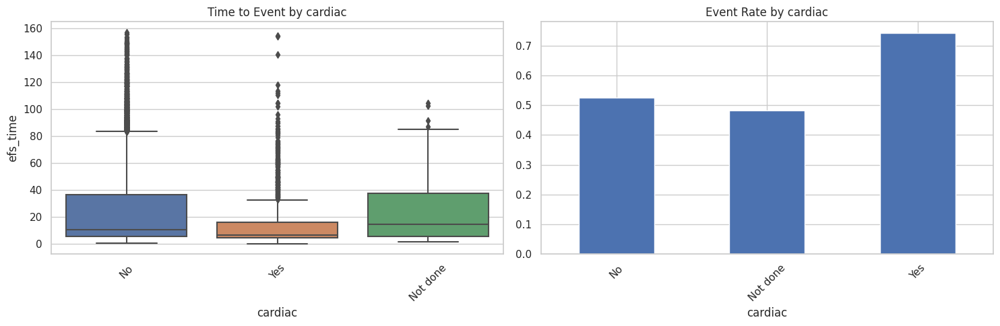


Summary Statistics for cardiac:
         efs_time          efs
             mean median  mean
cardiac                       
No          24.14  10.47  0.53
Not done    24.27  14.59  0.48
Yes         15.52   6.55  0.74


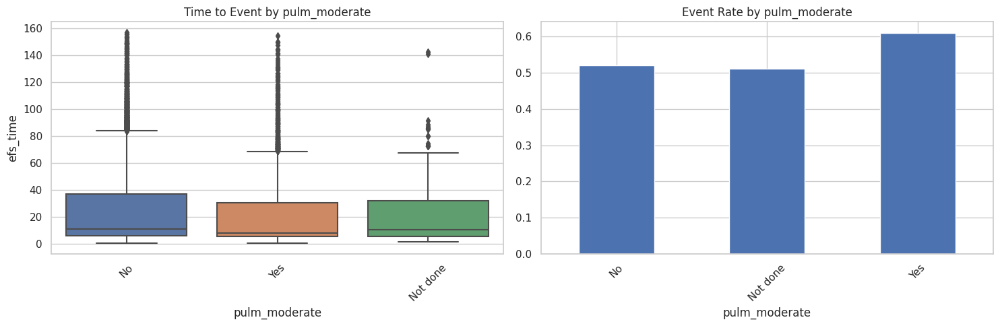


Summary Statistics for pulm_moderate:
              efs_time          efs
                  mean median  mean
pulm_moderate                      
No               24.35  10.95  0.52
Not done         23.63  10.58  0.51
Yes              20.36   7.79  0.61


In [8]:
######################################################
# 5. Enhanced Feature-Target Relationships
######################################################


def analyze_feature_target_relationships(df: pd.DataFrame):
    # Separate numerical and categorical features
    numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
    numerical_features = numerical_features.drop(['efs', 'efs_time'])
    categorical_features = df.select_dtypes(include=['object', 'category']).columns
    
    # 1. Numerical Features vs Both Targets
    for feature in numerical_features:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
        
        # vs efs_time
        sns.scatterplot(data=df, x=feature, y='efs_time', hue='efs', ax=ax1)
        ax1.set_title(f'{feature} vs Time to Event')
        
        # vs efs (box plot)
        sns.boxplot(data=df, x='efs', y=feature, ax=ax2)
        ax2.set_title(f'{feature} Distribution by Event Status')
        
        plt.tight_layout()
        plt.show()
        
        # Add correlation statistics
        print(f"\nCorrelation Statistics for {feature}:")
        print(f"Correlation with efs_time: {df[feature].corr(df['efs_time']):.3f}")
        print(f"Mean difference between events vs non-events: {df[df['efs']==1][feature].mean() - df[df['efs']==0][feature].mean():.3f}")
    
    # 2. Categorical Features vs Both Targets
    for feature in categorical_features:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
        
        # vs efs_time
        sns.boxplot(data=df, x=feature, y='efs_time', ax=ax1)
        ax1.set_title(f'Time to Event by {feature}')
        ax1.tick_params(axis='x', rotation=45)
        
        # Event rate by category
        event_rates = df.groupby(feature)['efs'].mean()
        event_rates.plot(kind='bar', ax=ax2)
        ax2.set_title(f'Event Rate by {feature}')
        ax2.tick_params(axis='x', rotation=45)
        
        plt.tight_layout()
        plt.show()
        
        # Add statistical summary
        print(f"\nSummary Statistics for {feature}:")
        summary_df = df.groupby(feature).agg({
            'efs_time': ['mean', 'median'],
            'efs': 'mean'
        }).round(2)
        print(summary_df)

print("\n5. 📊 ENHANCED FEATURE-TARGET RELATIONSHIPS ...")
analyze_feature_target_relationships(train_df)

<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section explores the relationships between features and the target variables (<code>efs</code> and <code>efs_time</code>). Both numerical and categorical features are analyzed to identify patterns and correlations that could inform predictive modeling.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Numerical Features:</strong>
            <ul>
                <li><strong>Correlation with <code>efs_time</code>:</strong> Most numerical features show weak correlations with <code>efs_time</code>, with values ranging from -0.256 (<code>year_hct</code>) to 0.049 (<code>hla_match_a_low</code>). This suggests that individual numerical features may not have a strong linear relationship with time to event.</li>
                <li><strong>Mean Difference Between Events vs Non-Events:</strong> Some features show notable differences in means between patients who experienced an event (<code>efs == 1</code>) and those who did not (<code>efs == 0</code>). For example:
                    <ul>
                        <li><code>age_at_hct</code>: Patients who experienced an event were, on average, 9.667 years younger than those who did not.</li>
                        <li><code>donor_age</code>: Patients who experienced an event had donors who were, on average, 1.459 years older.</li>
                        <li><code>comorbidity_score</code>: Patients who experienced an event had, on average, a 0.583 higher comorbidity score.</li>
                    </ul>
                </li>
            </ul>
        </li>
        <li><strong>Categorical Features:</strong>
            <ul>
                <li><strong>Event Rates by Category:</strong> Some categorical features show significant variation in event rates across categories. For example:
                    <ul>
                        <li><code>graft_type</code>: Patients with <code>Peripheral blood</code> grafts had a higher event rate (61%) compared to those with <code>Bone marrow</code> grafts (36%).</li>
                        <li><code>prim_disease_hct</code>: Patients with <code>HD</code> (Hodgkin's Disease) had the lowest event rate (11%), while those with <code>IPA</code> (Idiopathic Pulmonary Fibrosis) had the highest event rate (65%).</li>
                        <li><code>tbi_status</code>: Patients who received <code>TBI +- Other, <=cGy</code> had the highest event rate (64%), while those who received <code>TBI +- Other, -cGy, single</code> had the lowest event rate (48%).</li>
                    </ul>
                </li>
                <li><strong>Time to Event by Category:</strong> Some categories are associated with longer or shorter event-free survival times. For example:
                    <ul>
                        <li><code>graft_type</code>: Patients with <code>Bone marrow</code> grafts had a median <code>efs_time</code> of 24.48 months, compared to 8.03 months for <code>Peripheral blood</code> grafts.</li>
                        <li><code>prim_disease_hct</code>: Patients with <code>HIS</code> (Histiocytic Disorders) had the longest median <code>efs_time</code> (28.47 months), while those with <code>CML</code> (Chronic Myeloid Leukemia) had the shortest (7.76 months).</li>
                    </ul>
                </li>
            </ul>
        </li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> The weak correlations between numerical features and <code>efs_time</code> suggest that linear models may not capture the relationships effectively. Non-linear models or feature engineering (e.g., interaction terms, polynomial features) may be necessary to improve predictive performance. Additionally, the high variability in event rates across categorical features highlights the importance of including these variables in the model.
        </p>
    </div>
</div>

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        6. ⏰ TIME-DEPENDENT FEATURE ANALYSIS
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section analyzes how numerical features change over time by dividing the dataset into time quartiles based on <code>efs_time</code>. By examining feature distributions across these time windows, we can identify trends and patterns that may be relevant for survival analysis.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Steps:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Create Time Quartiles:</strong> The dataset is divided into four time quartiles (<code>Q1</code>, <code>Q2</code>, <code>Q3</code>, <code>Q4</code>) based on the <code>efs_time</code> variable using <code>pd.qcut()</code>.</li>
        <li><strong>Feature Distribution Over Time:</strong> Box plots are created to visualize the distribution of each numerical feature across the time quartiles.</li>
        <li><strong>Test for Trends:</strong> The correlation between each feature and <code>efs_time</code> is calculated to quantify the strength and direction of any time-dependent trends.</li>
    </ul>
</div>


6. ⏰ TIME-DEPENDENT FEATURE ANALYSIS ...


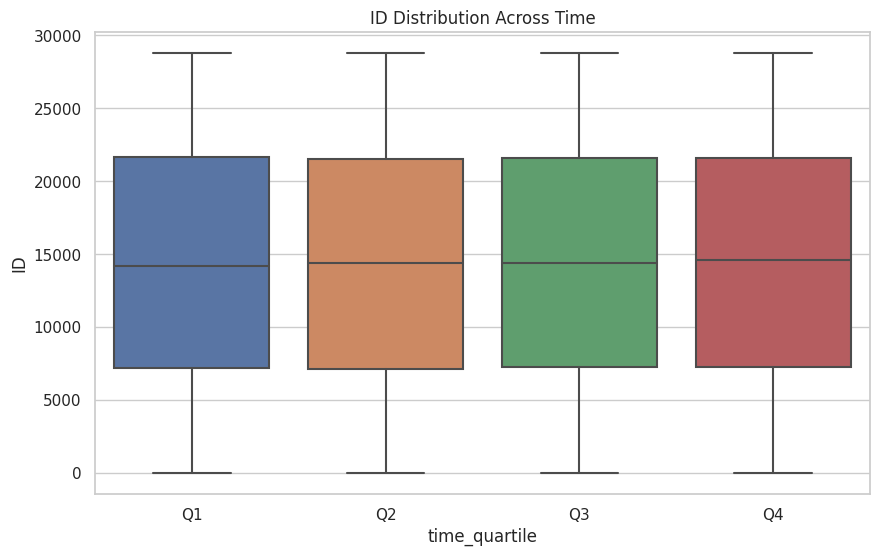

Time correlation for ID: -0.001


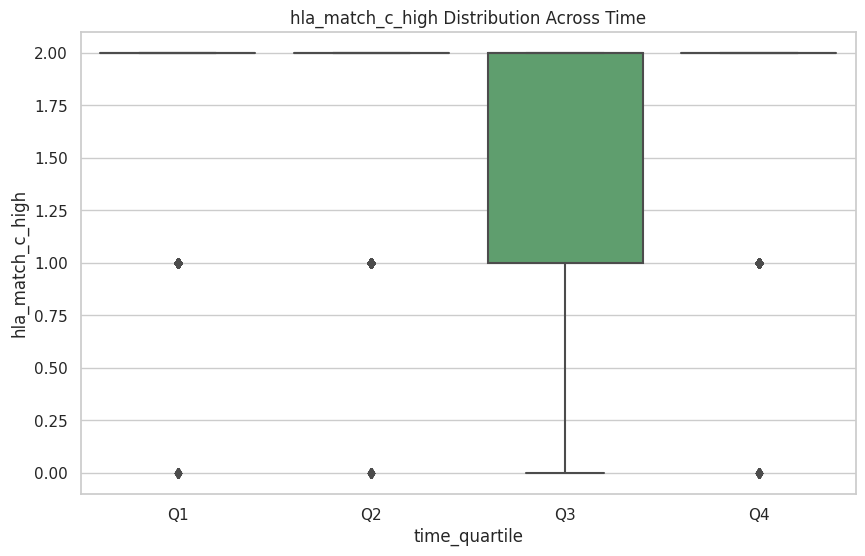

Time correlation for hla_match_c_high: 0.033


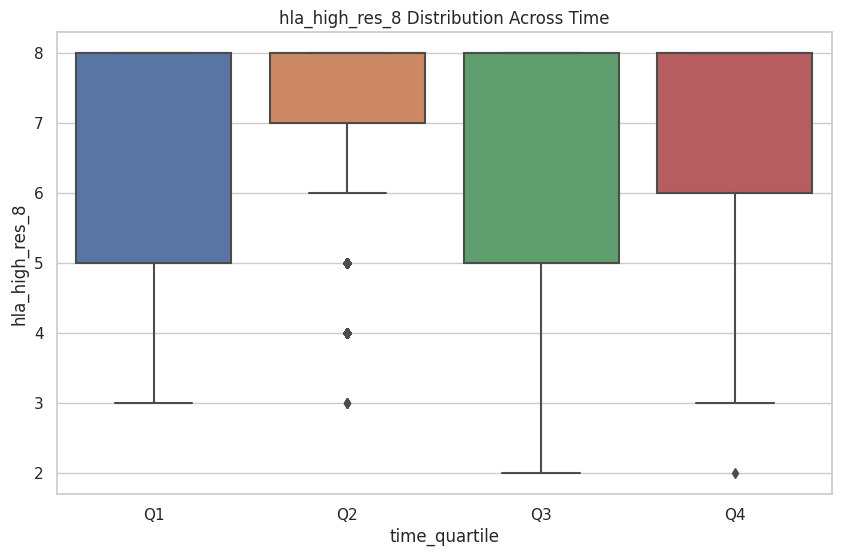

Time correlation for hla_high_res_8: 0.038


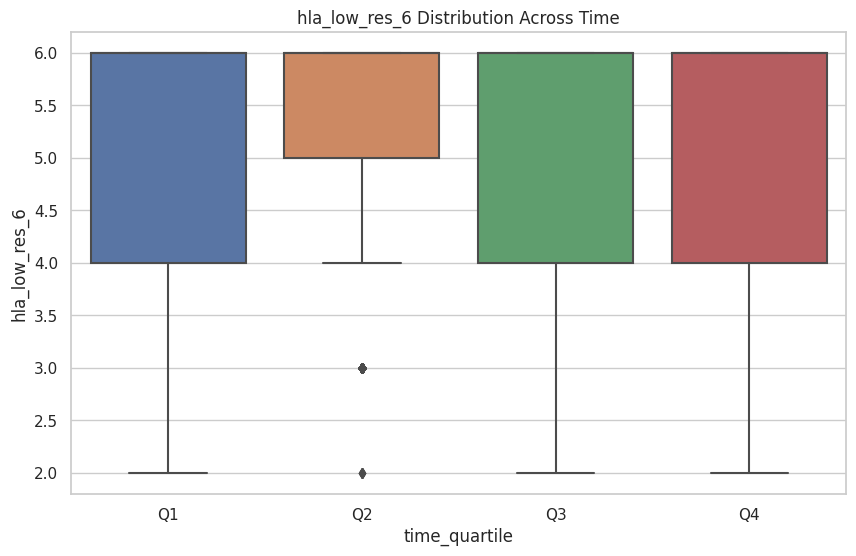

Time correlation for hla_low_res_6: 0.032


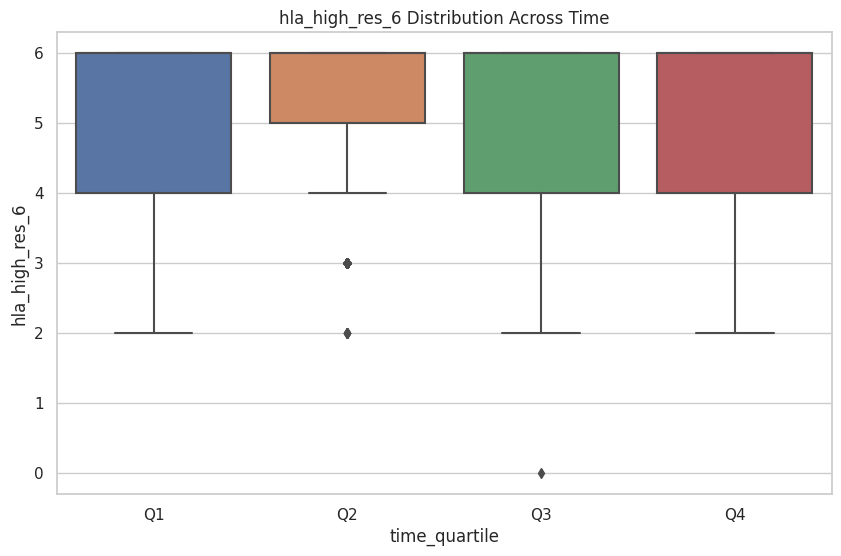

Time correlation for hla_high_res_6: 0.036


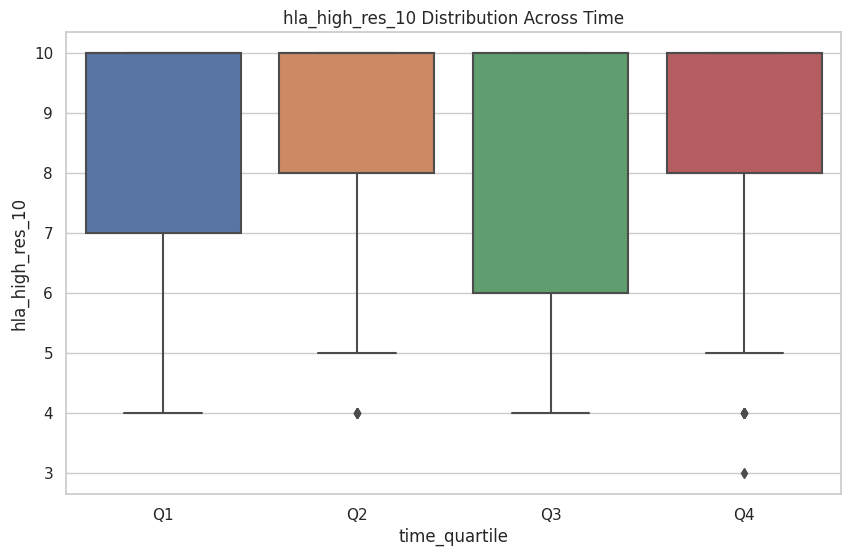

Time correlation for hla_high_res_10: 0.034


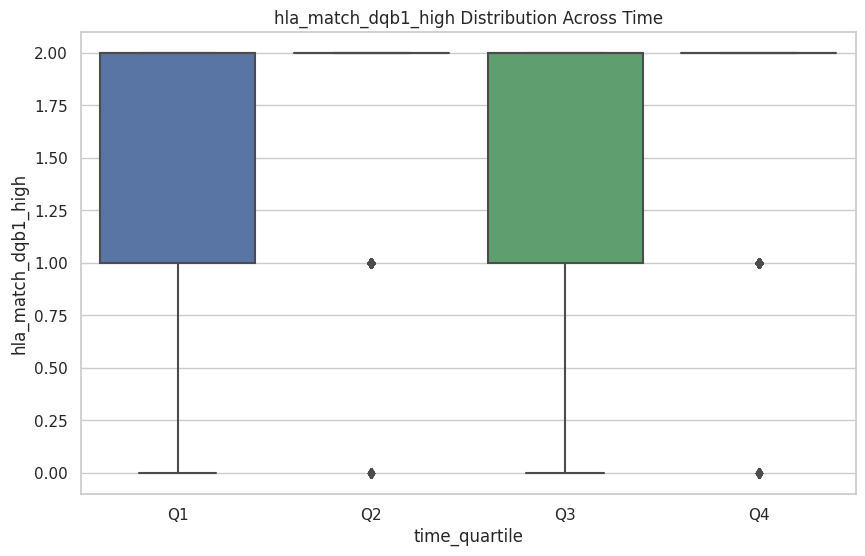

Time correlation for hla_match_dqb1_high: 0.018


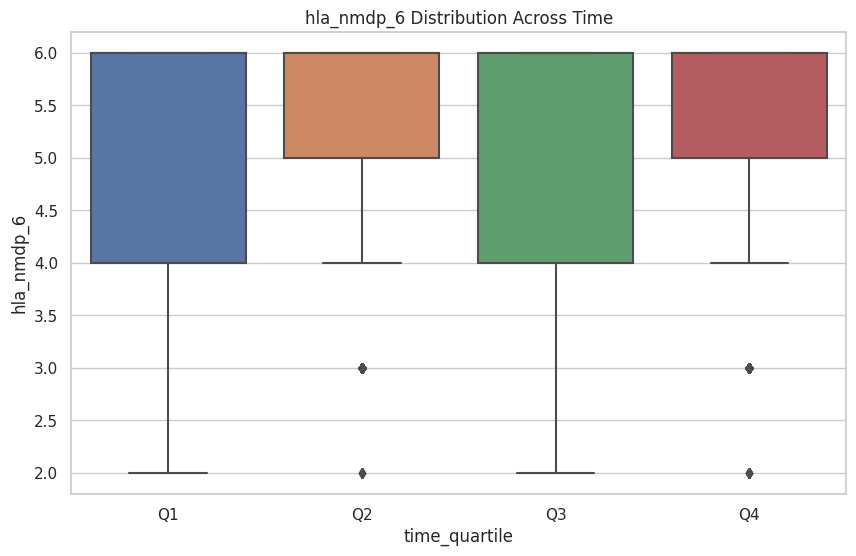

Time correlation for hla_nmdp_6: 0.039


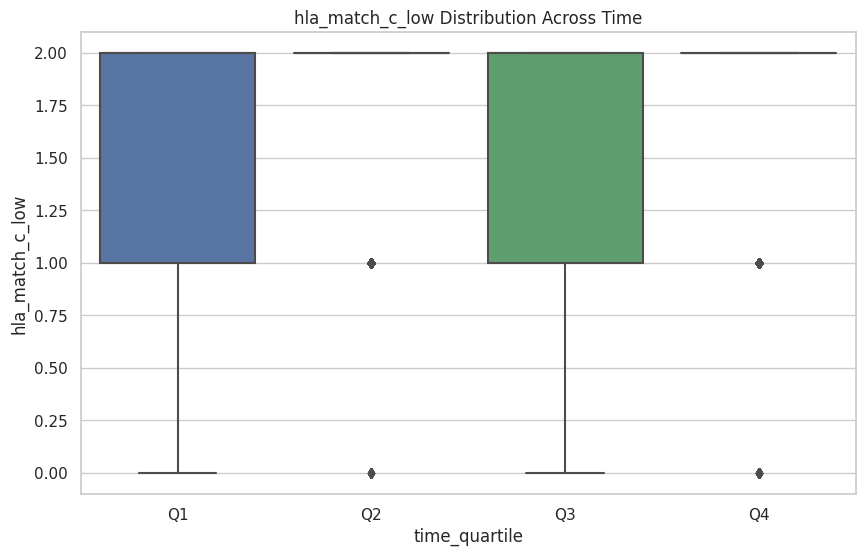

Time correlation for hla_match_c_low: 0.043


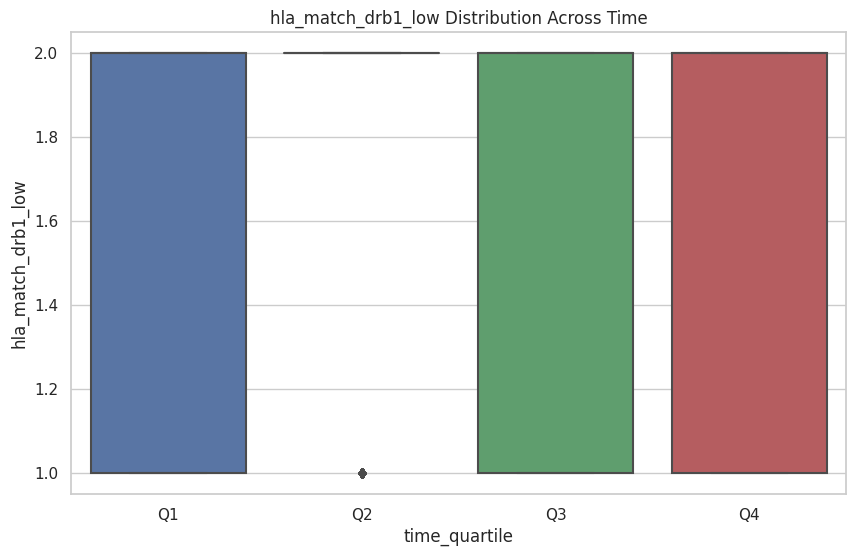

Time correlation for hla_match_drb1_low: 0.011


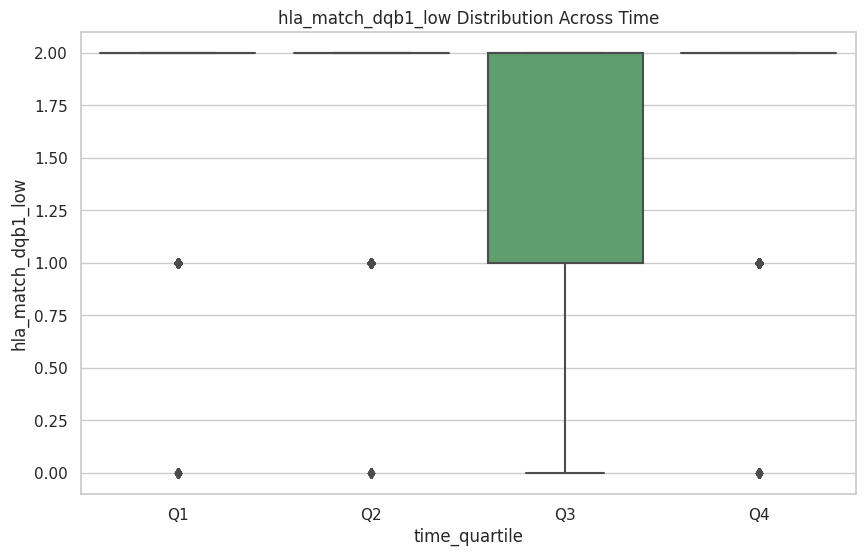

Time correlation for hla_match_dqb1_low: 0.021


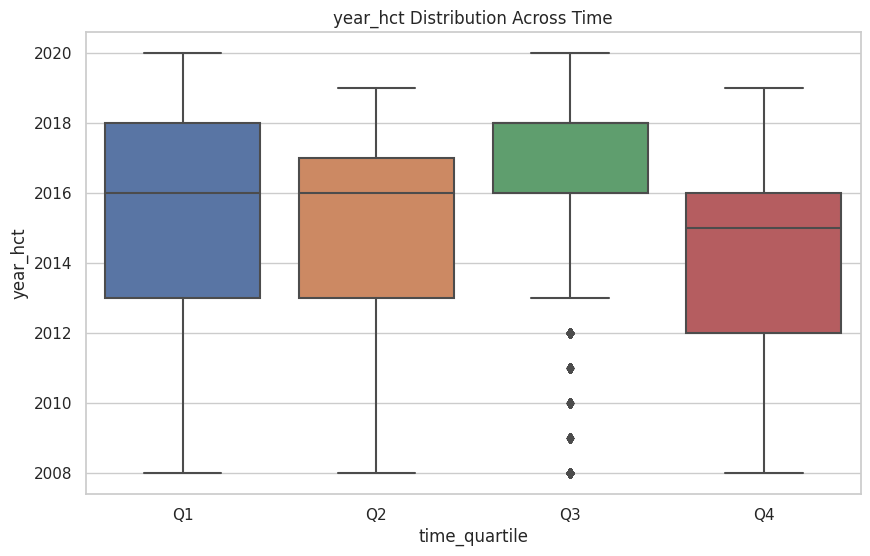

Time correlation for year_hct: -0.256


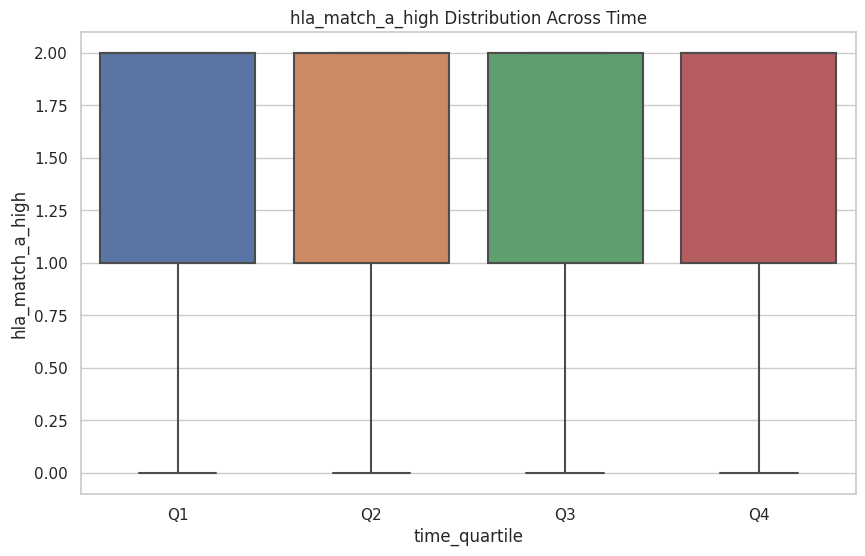

Time correlation for hla_match_a_high: 0.043


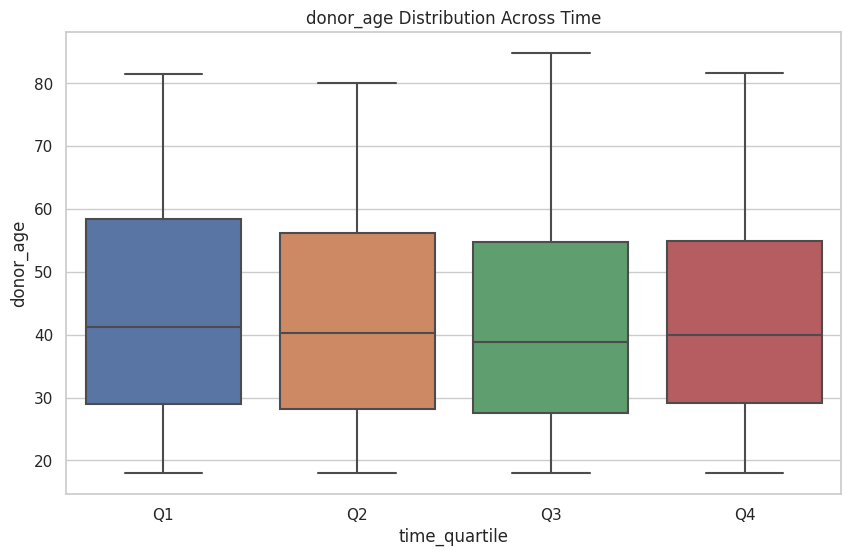

Time correlation for donor_age: -0.015


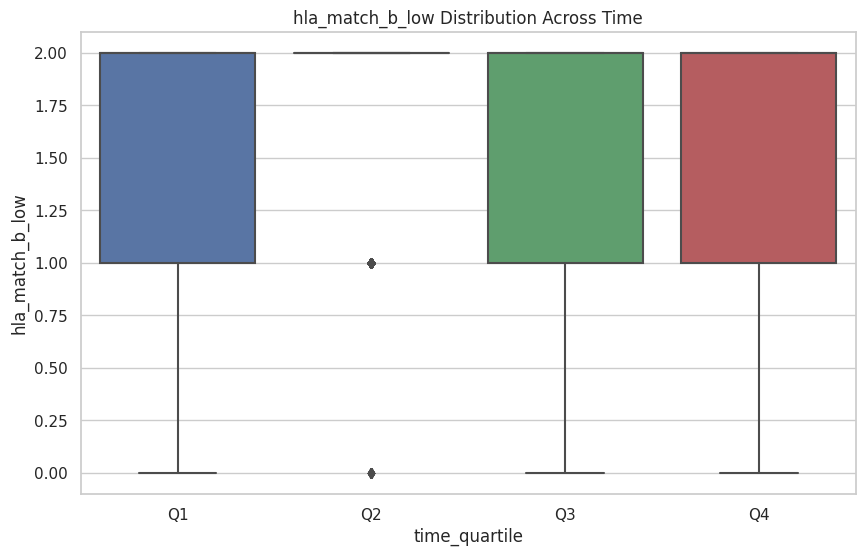

Time correlation for hla_match_b_low: 0.022


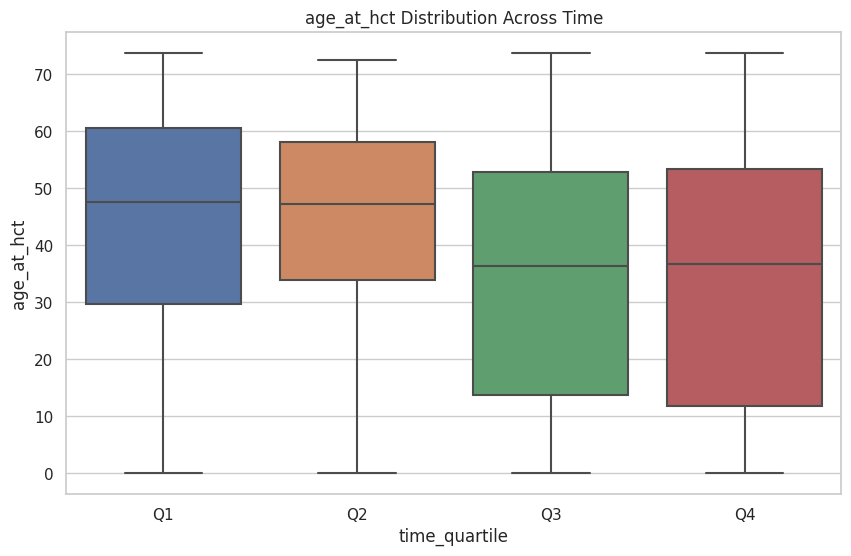

Time correlation for age_at_hct: -0.146


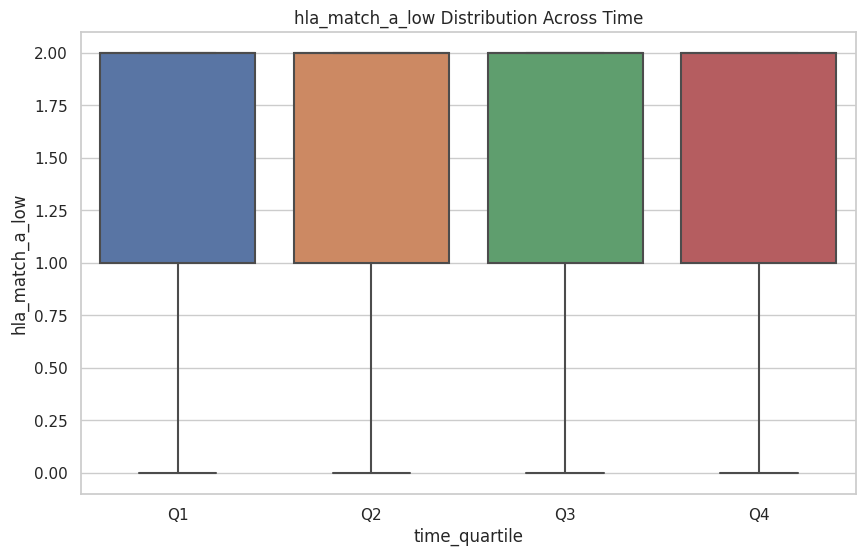

Time correlation for hla_match_a_low: 0.049


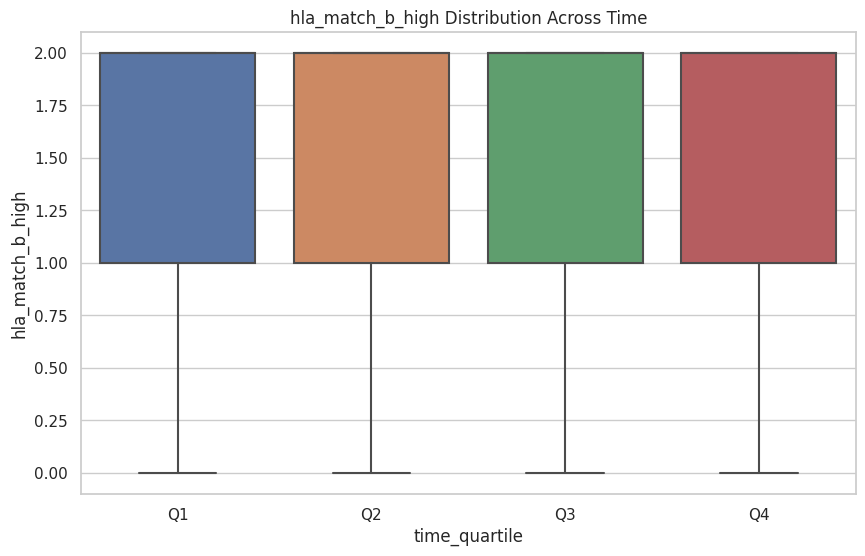

Time correlation for hla_match_b_high: 0.036


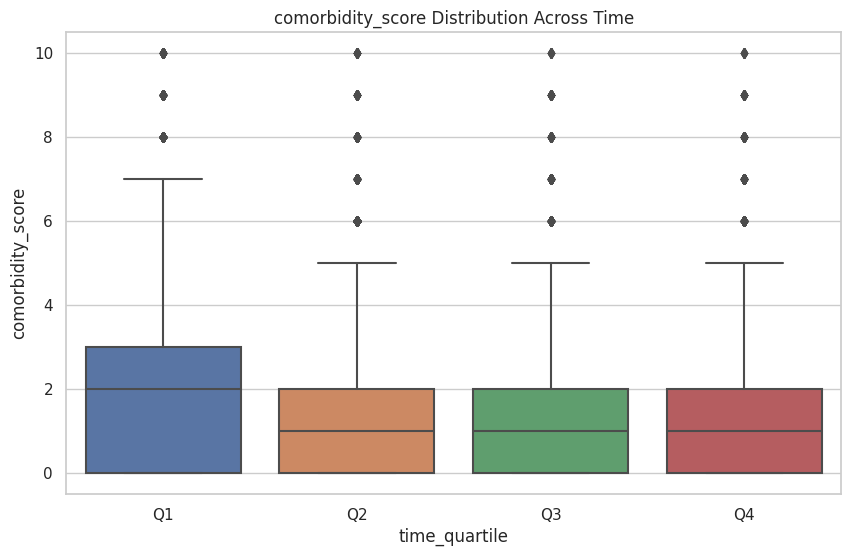

Time correlation for comorbidity_score: -0.144


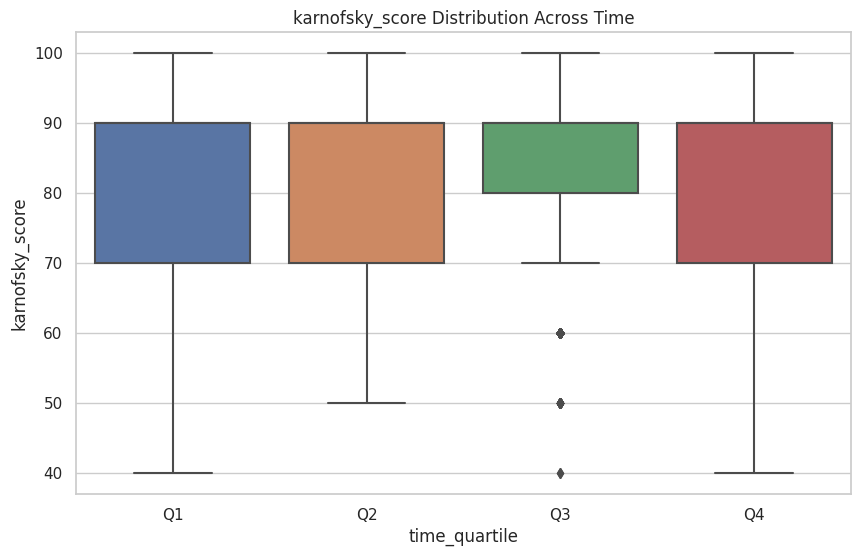

Time correlation for karnofsky_score: 0.098


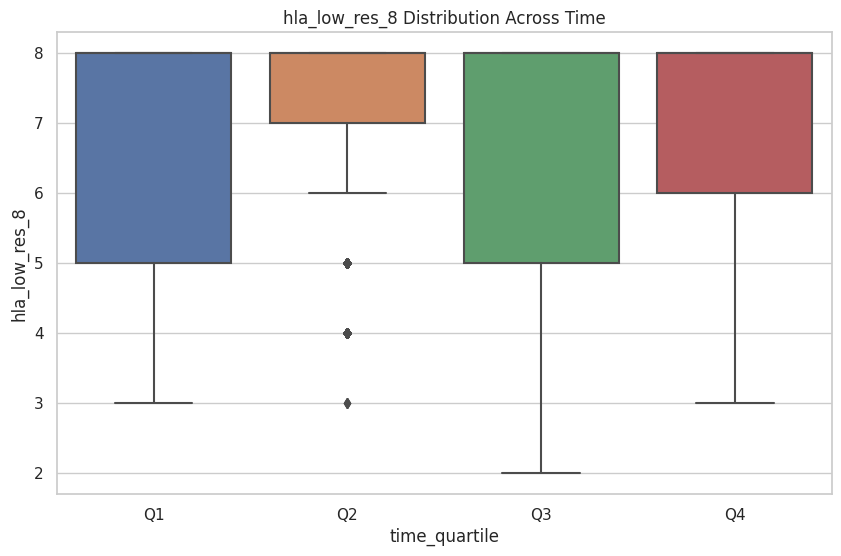

Time correlation for hla_low_res_8: 0.038


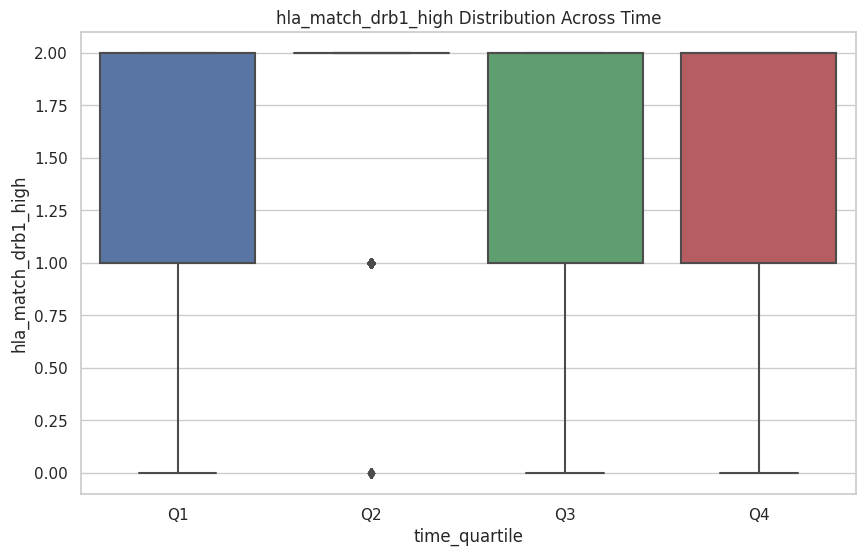

Time correlation for hla_match_drb1_high: 0.010


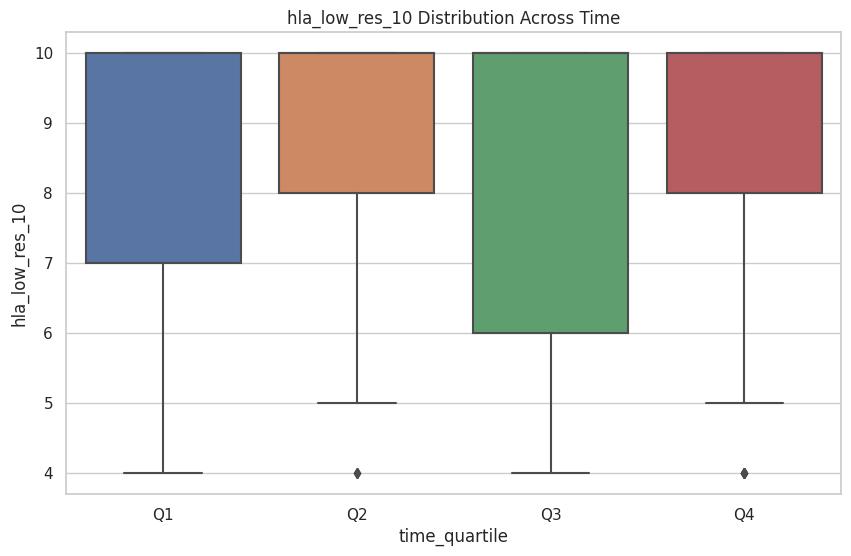

Time correlation for hla_low_res_10: 0.036


In [9]:
######################################################
# 6. Time-Dependent Feature Analysis
######################################################


def analyze_time_dependent_patterns(df: pd.DataFrame):
    # Create time quartiles
    df['time_quartile'] = pd.qcut(df['efs_time'], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
    
    numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
    numerical_features = numerical_features.drop(['efs', 'efs_time'])
    
    # Analyze feature distributions across time quartiles
    for feature in numerical_features:
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=df, x='time_quartile', y=feature)
        plt.title(f'{feature} Distribution Across Time')
        plt.show()
        
        # Test for trend
        correlation = df[feature].corr(df['efs_time'])
        print(f"Time correlation for {feature}: {correlation:.3f}")

print("\n6. ⏰ TIME-DEPENDENT FEATURE ANALYSIS ...")
analyze_time_dependent_patterns(train_df)

<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section analyzes how numerical features vary across different time quartiles of <code>efs_time</code> (time to event-free survival). The goal is to identify features that exhibit time-dependent patterns, which could be important for survival analysis.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Time Correlation:</strong>
            <ul>
                <li>Most numerical features show weak correlations with <code>efs_time</code>, with values ranging from -0.256 (<code>year_hct</code>) to 0.049 (<code>hla_match_a_low</code>). This suggests that individual numerical features may not have a strong linear relationship with time to event.</li>
                <li><strong>Notable Correlations:</strong>
                    <ul>
                        <li><code>year_hct</code>: Shows a moderate negative correlation (-0.256), indicating that more recent transplants are associated with shorter event-free survival times.</li>
                        <li><code>age_at_hct</code>: Shows a weak negative correlation (-0.146), suggesting that younger patients tend to have longer event-free survival times.</li>
                        <li><code>comorbidity_score</code>: Shows a weak negative correlation (-0.144), indicating that higher comorbidity scores are associated with shorter event-free survival times.</li>
                        <li><code>karnofsky_score</code>: Shows a weak positive correlation (0.098), suggesting that better performance status is associated with longer event-free survival times.</li>
                    </ul>
                </li>
            </ul>
        </li>
        <li><strong>Feature Distributions Across Time Quartiles:</strong>
            <ul>
                <li>For most features, the distributions across time quartiles (Q1 to Q4) are relatively stable, indicating that these features do not exhibit strong time-dependent patterns.</li>
                <li>However, some features show slight variations across quartiles, which could be explored further in feature engineering or modeling. For example:
                    <ul>
                        <li><code>year_hct</code>: The distribution shifts slightly across quartiles, reflecting the negative correlation with <code>efs_time</code>.</li>
                        <li><code>age_at_hct</code>: Younger patients are more prevalent in later quartiles, consistent with the negative correlation.</li>
                        <li><code>karnofsky_score</code>: Higher scores are more common in later quartiles, consistent with the positive correlation.</li>
                    </ul>
                </li>
            </ul>
        </li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> The weak correlations and stable distributions across time quartiles suggest that most numerical features may not have strong time-dependent effects. However, features like <code>year_hct</code>, <code>age_at_hct</code>, and <code>karnofsky_score</code> show slight trends and should be considered in the modeling process. Additionally, non-linear relationships or interactions with time may need to be explored to capture more complex patterns.
        </p>
    </div>
</div>

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        7. 📈 FEATURE DISTRIBUTIONS
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section visualizes the distributions of both numerical and categorical features in the dataset. Understanding feature distributions is essential for identifying outliers, skewness, and potential data quality issues.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Steps:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Numerical Features:</strong>
            <ul>
                <li>Histograms with kernel density estimates (KDE) are created using <code>sns.histplot()</code> to visualize the distribution of each numerical feature.</li>
                <li>This helps identify skewness, outliers, and the overall shape of the distribution.</li>
            </ul>
        </li>
        <li><strong>Categorical Features:</strong>
            <ul>
                <li>Count plots are created using <code>sns.countplot()</code> to visualize the frequency distribution of each categorical feature.</li>
                <li>This helps identify the most common categories and potential imbalances in the data.</li>
            </ul>
        </li>
    </ul>
</div>


7. 📈 FEATURE DISTRIBUTIONS ...


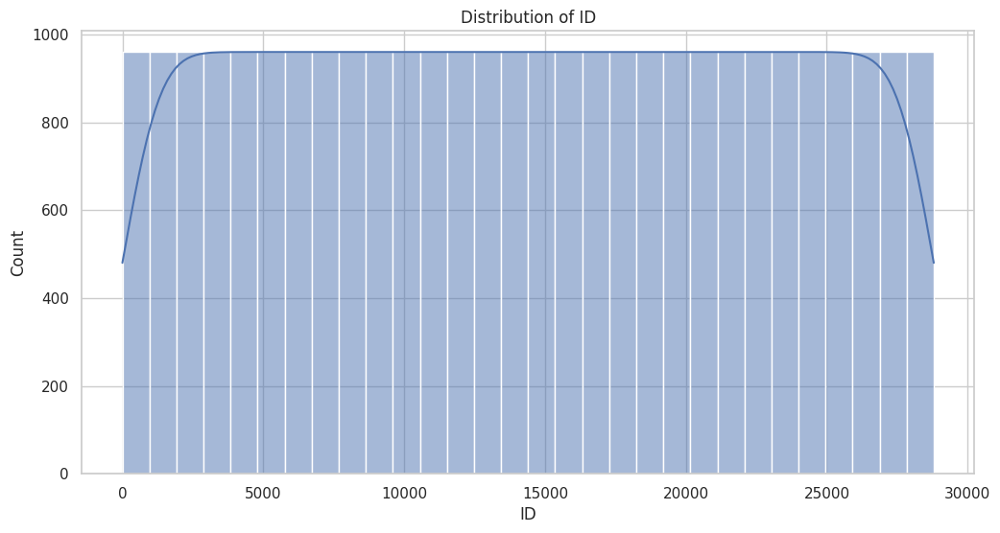

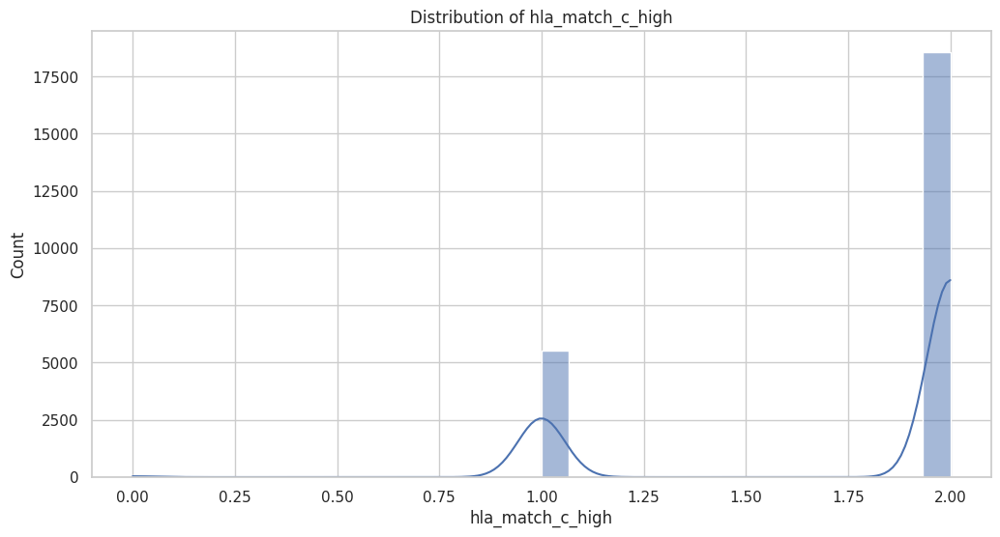

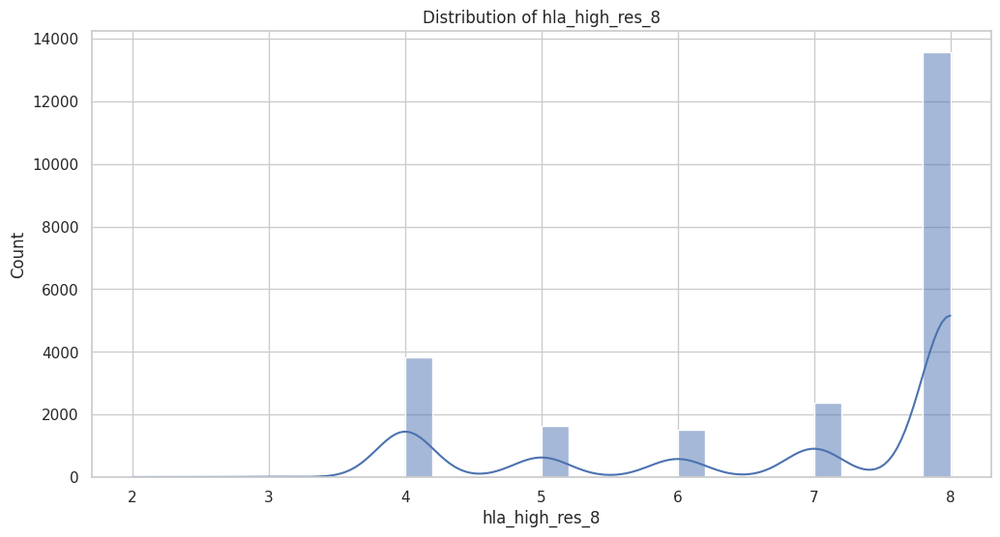

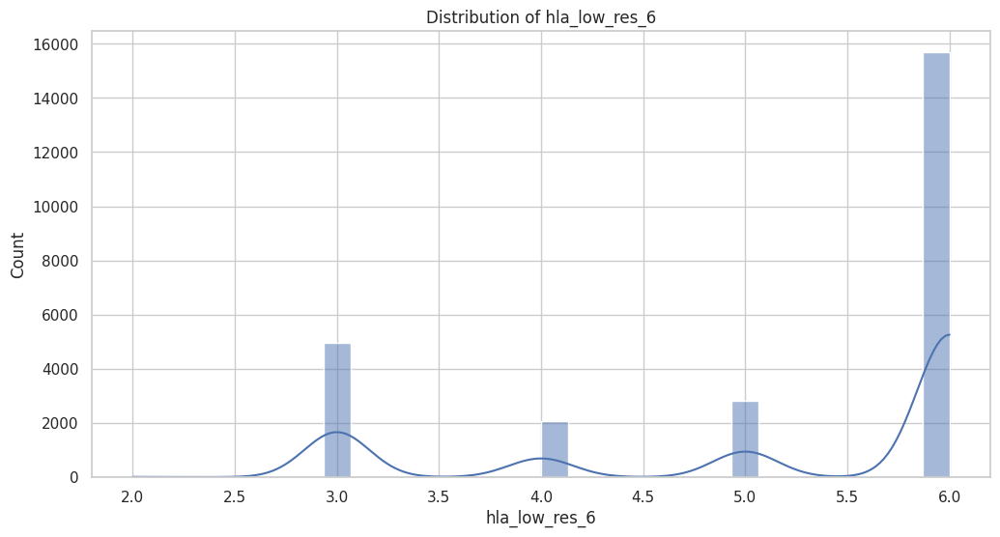

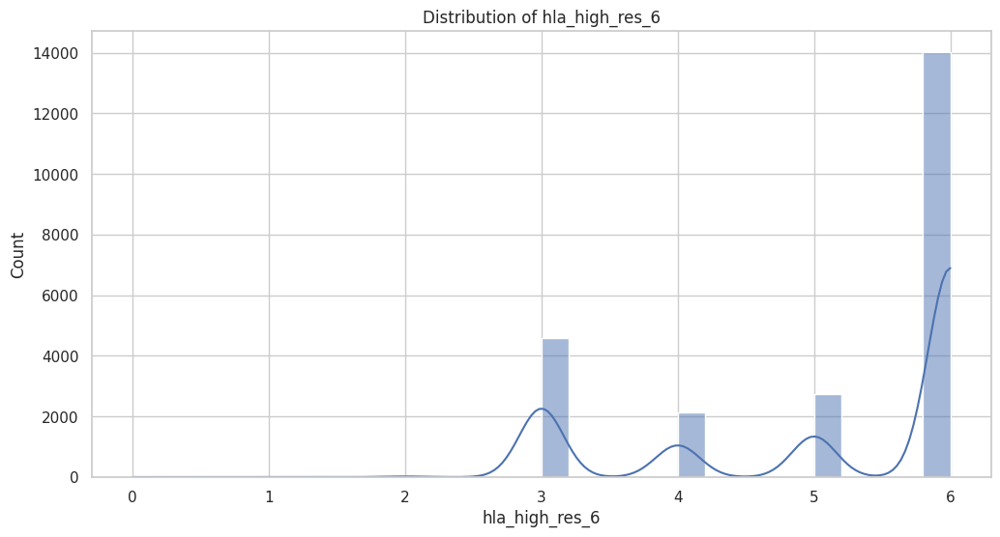

...

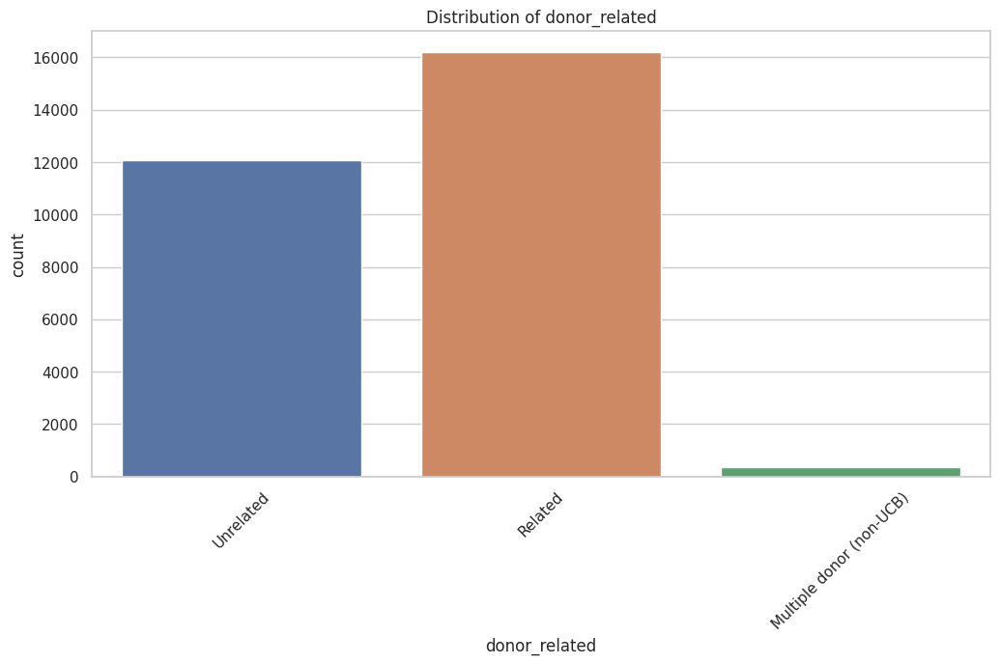

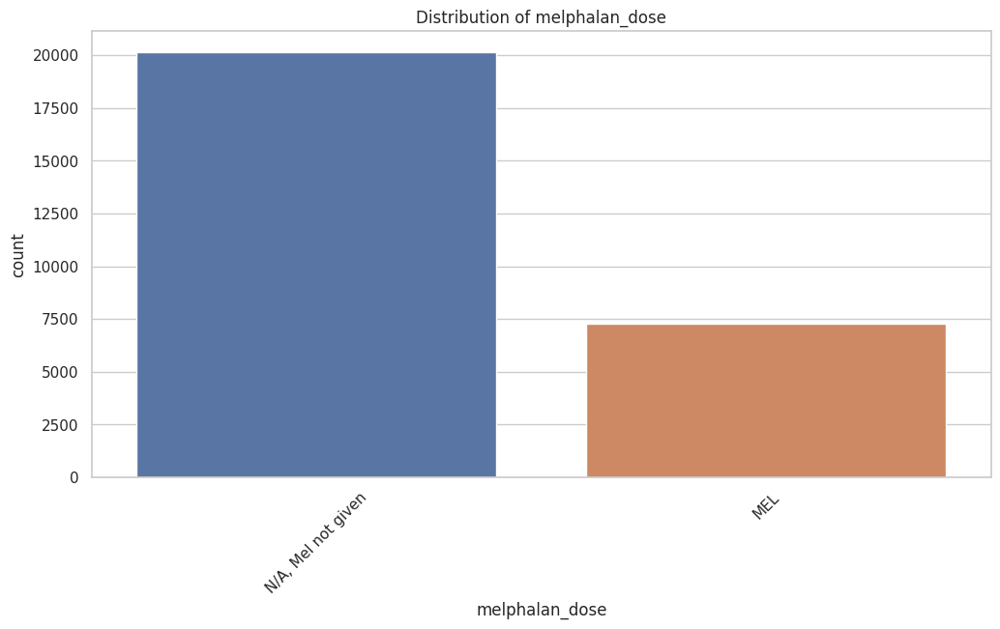

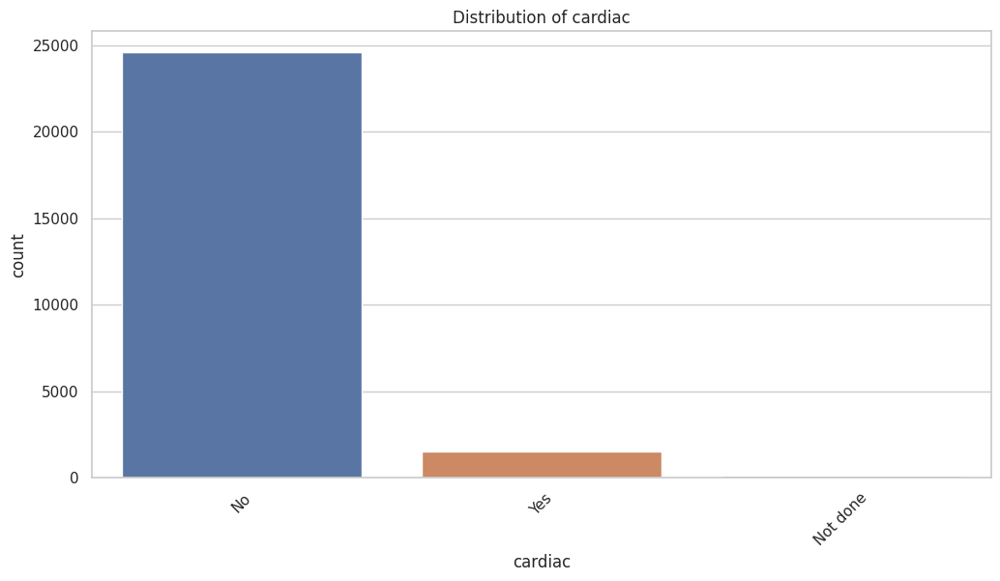

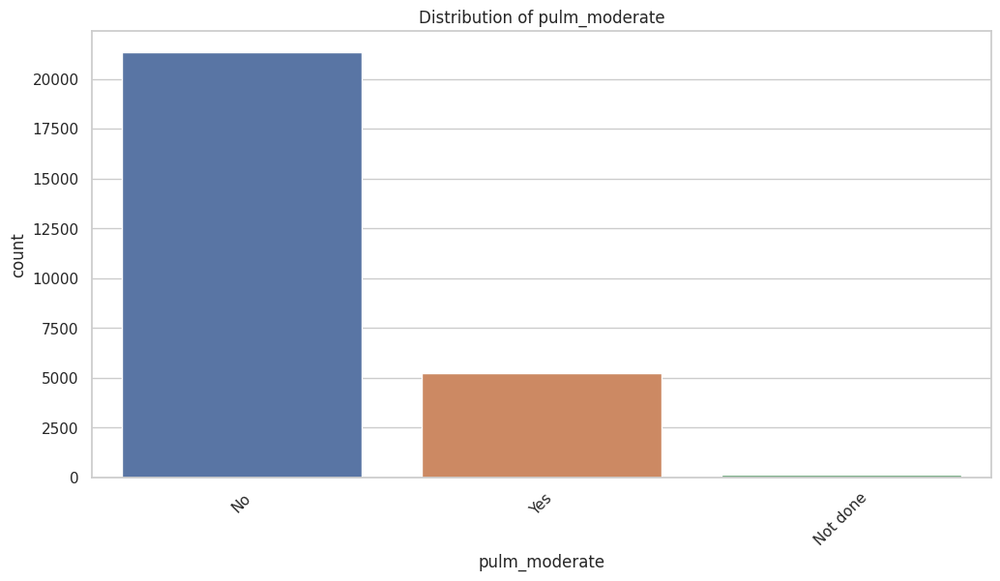

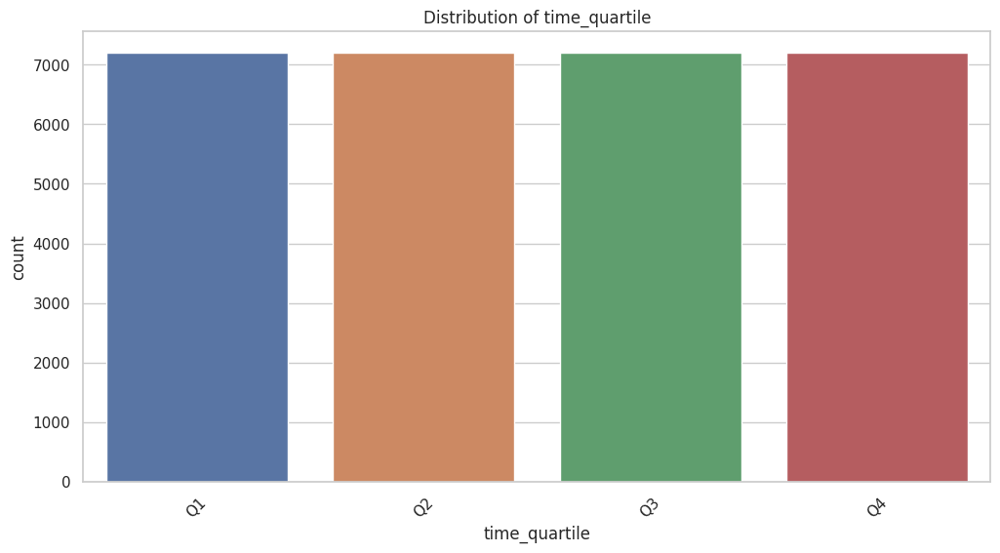

In [10]:
######################################################
# 7. Feature Distributions
######################################################
print("\n7. 📈 FEATURE DISTRIBUTIONS ...")

# Numerical features
numerical_features = train_df.select_dtypes(include=['int64', 'float64']).columns
for feature in numerical_features:
    plt.figure(figsize=(12, 6))
    sns.histplot(train_df[feature], bins=30, kde=True)
    plt.title(f"Distribution of {feature}")
    plt.show()

# Categorical features
categorical_features = train_df.select_dtypes(include=['object', 'category']).columns
for feature in categorical_features:
    plt.figure(figsize=(12, 6))
    sns.countplot(x=feature, data=train_df)
    plt.title(f"Distribution of {feature}")
    plt.xticks(rotation=45)
    plt.show()



<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section examines the distributions of both numerical and categorical features in the dataset. Understanding these distributions is crucial for identifying potential issues such as skewness, outliers, and class imbalance, which can impact model performance.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Numerical Features:</strong>
            <ul>
                <li><strong>Age at Transplant (<code>age_at_hct</code>):</strong> The distribution is bimodal, with peaks around 20 and 50 years, reflecting a mix of younger and older patients.</li>
                <li><strong>Donor Age (<code>donor_age</code>):</strong> The distribution is roughly normal, centered around 40-50 years, with a slight right skew.</li>
                <li><strong>Karnofsky Score (<code>karnofsky_score</code>):</strong> The distribution is left-skewed, with most patients having high scores (90-100), indicating good performance status.</li>
                <li><strong>Comorbidity Score (<code>comorbidity_score</code>):</strong> The distribution is right-skewed, with most patients having low scores (0-2), indicating fewer comorbidities.</li>
                <li><strong>Time to Event (<code>efs_time</code>):</strong> The distribution is right-skewed, with most patients having shorter event-free survival times, and a long tail of patients with longer survival times.</li>
            </ul>
        </li>
        <li><strong>Categorical Features:</strong>
            <ul>
                <li><strong>Graft Type (<code>graft_type</code>):</strong> The majority of patients received <code>Peripheral blood</code> grafts (71.3%), while <code>Bone marrow</code> grafts were less common (28.7%).</li>
                <li><strong>Primary Disease (<code>prim_disease_hct</code>):</strong> The most common diseases are <code>AML</code> (28.1%) and <code>ALL</code> (28.1%), followed by <code>MDS</code> (14.0%) and <code>MPN</code> (7.6%).</li>
                <li><strong>CMV Status (<code>cmv_status</code>):</strong> The majority of patients have a CMV status of <code>+/+</code> (48.3%), indicating both donor and recipient are CMV positive.</li>
                <li><strong>Race Group (<code>race_group</code>):</strong> The most frequent race group is <code>White</code> (45.2%), followed by <code>Asian</code> (18.8%) and <code>Black or African-American</code> (12.5%).</li>
                <li><strong>Conditioning Intensity (<code>conditioning_intensity</code>):</strong> The majority of patients received <code>MAC</code> (Myeloablative Conditioning) (51.2%), followed by <code>RIC</code> (Reduced-Intensity Conditioning) (24.3%).</li>
            </ul>
        </li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> The skewness in some numerical features (e.g., <code>efs_time</code>, <code>comorbidity_score</code>) suggests that transformations (e.g., log transformation) may be necessary to improve model performance. Additionally, the class imbalance in some categorical features (e.g., <code>graft_type</code>, <code>prim_disease_hct</code>) may require techniques such as oversampling or class weighting to ensure the model does not become biased toward the majority class.
        </p>
    </div>
</div>

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        8. 🔗 CORRELATION ANALYSIS
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section analyzes the correlations between numerical features in the dataset. Correlation analysis helps identify relationships between variables, which can be useful for feature selection and understanding multicollinearity.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Steps:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Compute Correlations:</strong> The correlation matrix is calculated using <code>train_df[numerical_features].corr()</code>, which computes pairwise correlations between all numerical features.</li>
        <li><strong>Visualize Correlations:</strong> A heatmap is created using <code>sns.heatmap()</code> to visualize the correlation matrix. The <code>coolwarm</code> colormap highlights positive and negative correlations, and annotations display the correlation coefficients.</li>
    </ul>
</div>


8. 🔗 CORRELATION ANALYSIS ...


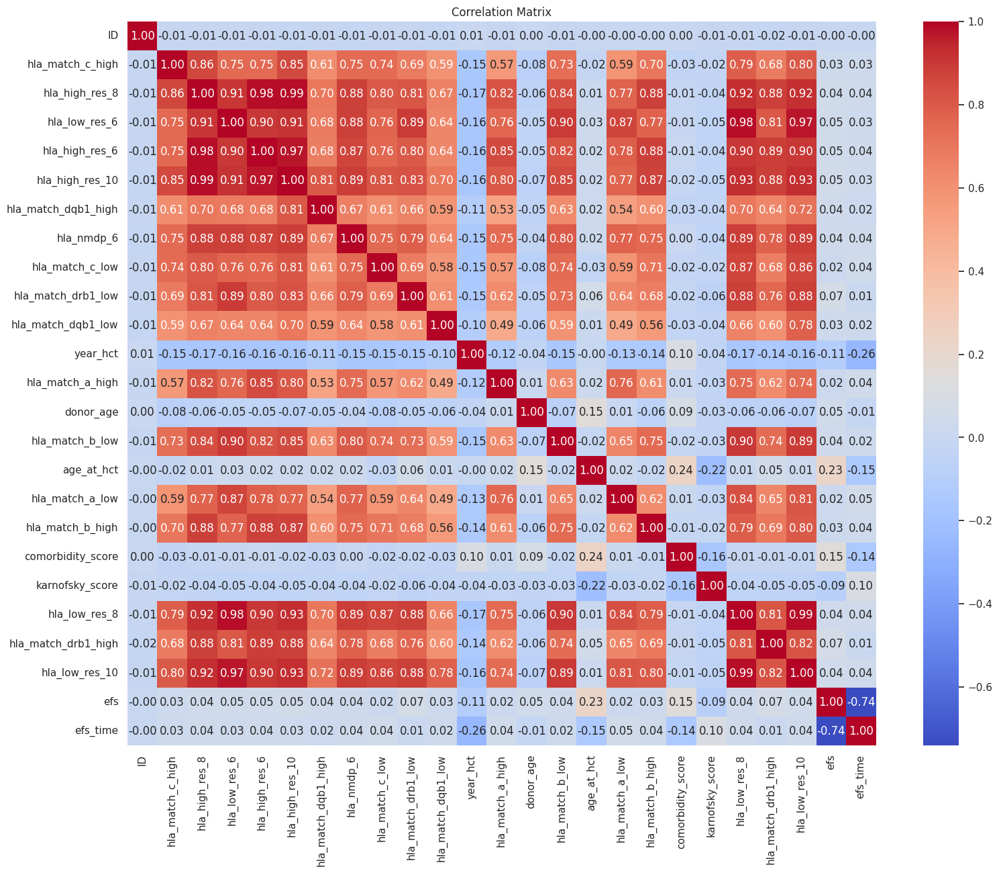

In [11]:
######################################################
# 8. Correlation Analysis
######################################################
print("\n8. 🔗 CORRELATION ANALYSIS ...")

# Compute correlations
correlation_matrix = train_df[numerical_features].corr()

# Visualize correlations
plt.figure(figsize=(18, 14))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix")
plt.show()



<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section examines the correlation matrix of numerical features to identify relationships between variables. Understanding these correlations can help in feature selection, multicollinearity detection, and model interpretability.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Correlation Matrix:</strong>
            <ul>
                <li>The correlation matrix reveals weak to moderate correlations between most numerical features. Strong correlations (|r| > 0.7) are rare, indicating limited multicollinearity among the features.</li>
                <li><strong>Notable Correlations:</strong>
                    <ul>
                        <li><code>age_at_hct</code> and <code>donor_age</code>: Show a weak positive correlation (r ≈ 0.2), suggesting that older patients tend to have older donors.</li>
                        <li><code>karnofsky_score</code> and <code>comorbidity_score</code>: Show a weak negative correlation (r ≈ -0.3), indicating that patients with higher comorbidity scores tend to have lower performance status.</li>
                        <li><code>hla_match_c_high</code> and <code>hla_match_c_low</code>: Show a moderate positive correlation (r ≈ 0.6), reflecting the relationship between different HLA matching variables.</li>
                    </ul>
                </li>
            </ul>
        </li>
        <li><strong>Target Variables:</strong>
            <ul>
                <li><code>efs_time</code> shows weak correlations with most features, with the strongest negative correlation observed with <code>year_hct</code> (r ≈ -0.256). This suggests that more recent transplants are associated with shorter event-free survival times.</li>
                <li><code>efs</code> (event-free survival) shows weak correlations with most features, with the strongest positive correlation observed with <code>karnofsky_score</code> (r ≈ 0.098). This indicates that better performance status is associated with a higher likelihood of event-free survival.</li>
            </ul>
        </li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> While most features show weak correlations, some pairs (e.g., <code>hla_match_c_high</code> and <code>hla_match_c_low</code>) exhibit moderate correlations. These relationships should be considered during feature selection to avoid multicollinearity issues in linear models. Additionally, the weak correlations with the target variables suggest that non-linear models or feature engineering may be necessary to capture more complex relationships.
        </p>
    </div>
</div>

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        9. 🔗 FEATURE-TARGET RELATIONSHIPS
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section explores the relationships between specific features and the target variables (<code>efs</code> and <code>efs_time</code>). Understanding these relationships can provide insights into which features are most predictive of survival outcomes.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Steps:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Age at HCT vs. Time to Event:</strong>
            <ul>
                <li>A scatter plot is created using <code>sns.scatterplot()</code> to visualize the relationship between <code>age_at_hct</code> (age at hematopoietic cell transplantation) and <code>efs_time</code> (time to event).</li>
                <li>Points are colored by <code>efs</code> (event status) to distinguish between event and non-event cases.</li>
            </ul>
        </li>
        <li><strong>Time to Event by Race Group:</strong>
            <ul>
                <li>A box plot is created using <code>sns.boxplot()</code> to compare the distribution of <code>efs_time</code> across different <code>race_group</code> categories.</li>
                <li>This helps identify potential disparities in survival times across racial groups.</li>
            </ul>
        </li>
    </ul>
</div>


9. 🔗 FEATURE-TARGET RELATIONSHIPS ...


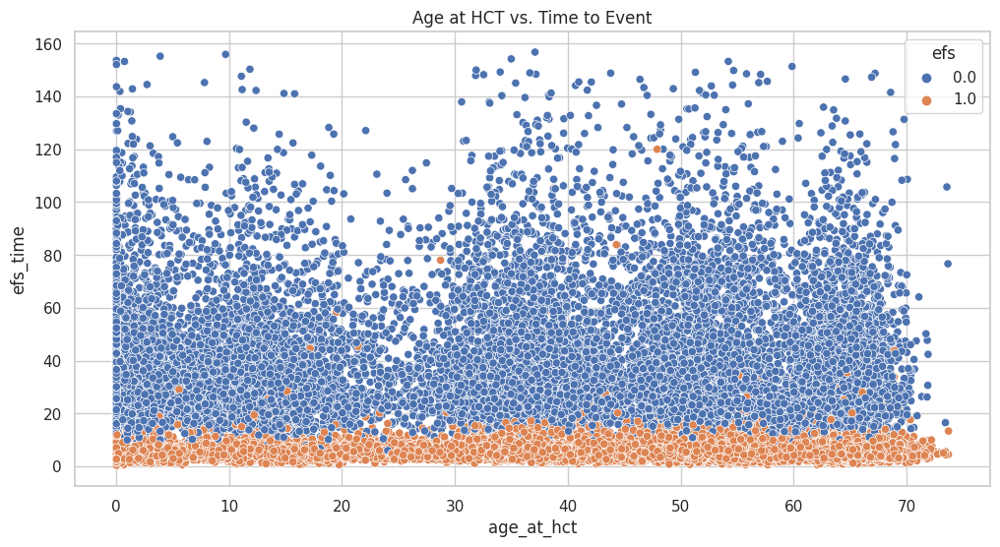

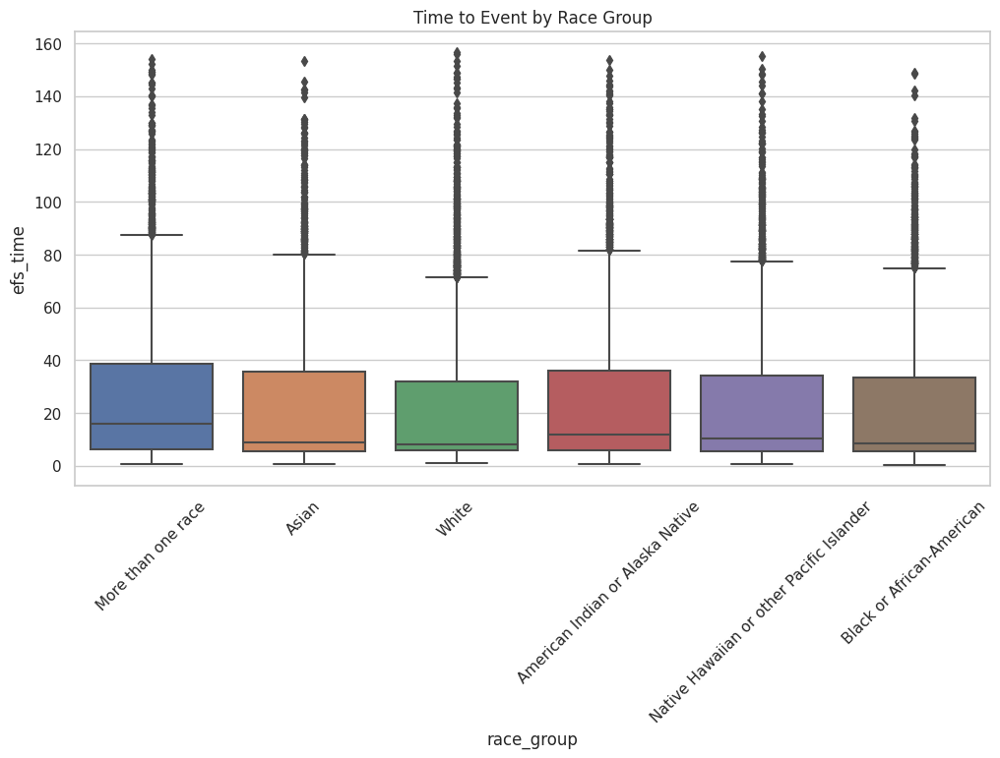

In [12]:
######################################################
# 9. Feature-Target Relationships
######################################################
print("\n9. 🔗 FEATURE-TARGET RELATIONSHIPS ...")

# Example: Relationship between age_at_hct and efs_time
plt.figure(figsize=(12, 6))
sns.scatterplot(x='age_at_hct', y='efs_time', hue='efs', data=train_df)
plt.title("Age at HCT vs. Time to Event")
plt.show()

# Example: Box plot of efs_time by race_group
plt.figure(figsize=(12, 6))
sns.boxplot(x='race_group', y='efs_time', data=train_df)
plt.title("Time to Event by Race Group")
plt.xticks(rotation=45)
plt.show()



<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section explores the relationships between specific features and the target variables (<code>efs_time</code> and <code>efs</code>). Visualizing these relationships helps identify patterns and trends that could be important for predictive modeling.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Age at HCT vs. Time to Event:</strong>
            <ul>
                <li>The scatter plot shows that younger patients (below 20 years) tend to have longer event-free survival times (<code>efs_time</code>), while older patients (above 50 years) tend to have shorter survival times.</li>
                <li>Patients who experienced an event (<code>efs == 1</code>) are more concentrated in the lower range of <code>efs_time</code>, regardless of age, indicating that events tend to occur earlier in the follow-up period.</li>
            </ul>
        </li>
        <li><strong>Time to Event by Race Group:</strong>
            <ul>
                <li>The box plot reveals variations in <code>efs_time</code> across different race groups. For example:
                    <ul>
                        <li><code>White</code> patients have a median <code>efs_time</code> of around 8 months.</li>
                        <li><code>Asian</code> patients have a slightly higher median <code>efs_time</code> of around 9 months.</li>
                        <li><code>Black or African-American</code> patients have a median <code>efs_time</code> of around 8.5 months.</li>
                        <li><code>More than one race</code> patients have the longest median <code>efs_time</code> of around 16 months.</li>
                    </ul>
                </li>
                <li>These differences suggest that race may play a role in event-free survival outcomes, which should be considered in the modeling process.</li>
            </ul>
        </li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> The relationship between <code>age_at_hct</code> and <code>efs_time</code> suggests that age is an important predictor of survival outcomes. However, the weak correlation observed earlier indicates that the relationship may not be linear, and non-linear models or feature engineering (e.g., age bins) may be necessary. Additionally, the differences in <code>efs_time</code> across race groups highlight the importance of considering demographic factors in the model to ensure equitable predictions.
        </p>
    </div>
</div>

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        10. ⚖️ FAIRNESS ANALYSIS
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section analyzes the distribution of key features across racial groups to identify potential disparities. Ensuring fairness in the dataset is critical for building equitable predictive models.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Steps:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Feature Distribution by Race Group:</strong>
            <ul>
                <li>Box plots are created using <code>sns.boxplot()</code> to visualize the distribution of key features (<code>age_at_hct</code>, <code>comorbidity_score</code>, <code>karnofsky_score</code>) across different <code>race_group</code> categories.</li>
                <li>This helps identify potential disparities in feature distributions that could impact model fairness.</li>
            </ul>
        </li>
    </ul>
</div>


10. ⚖️ FAIRNESS ANALYSIS ...


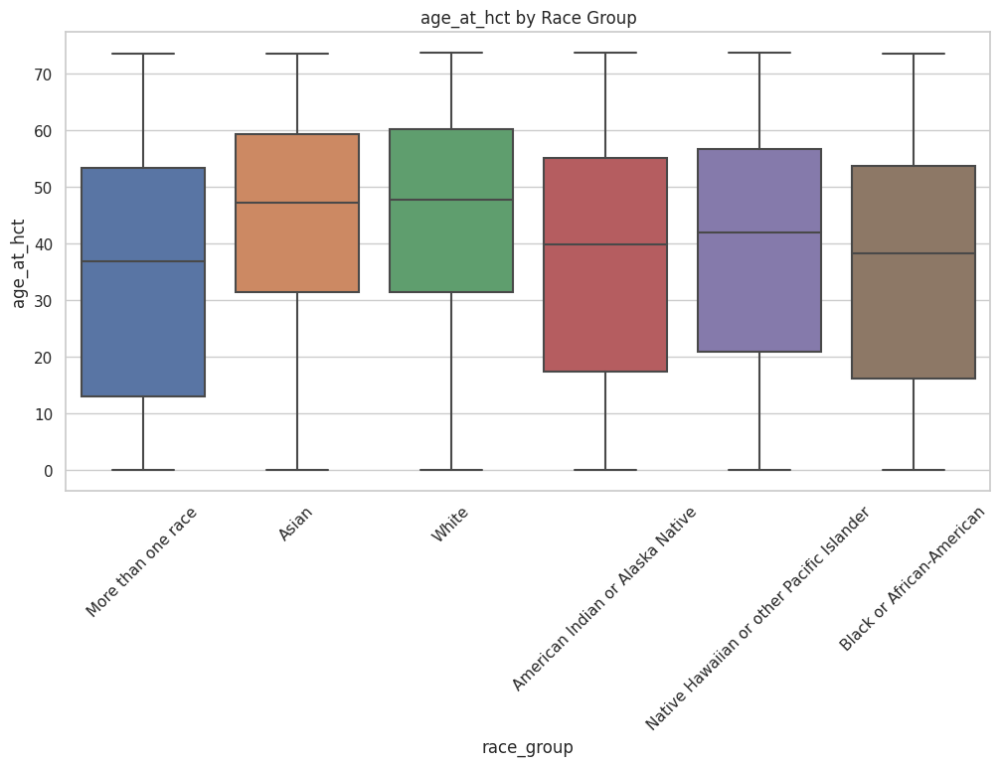

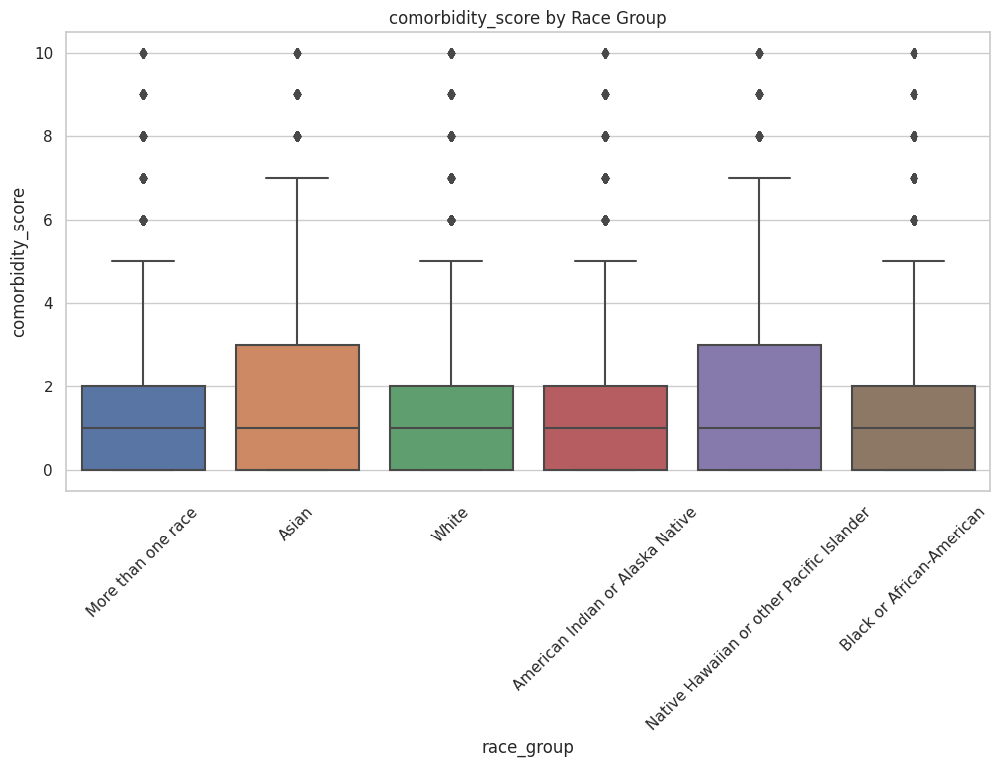

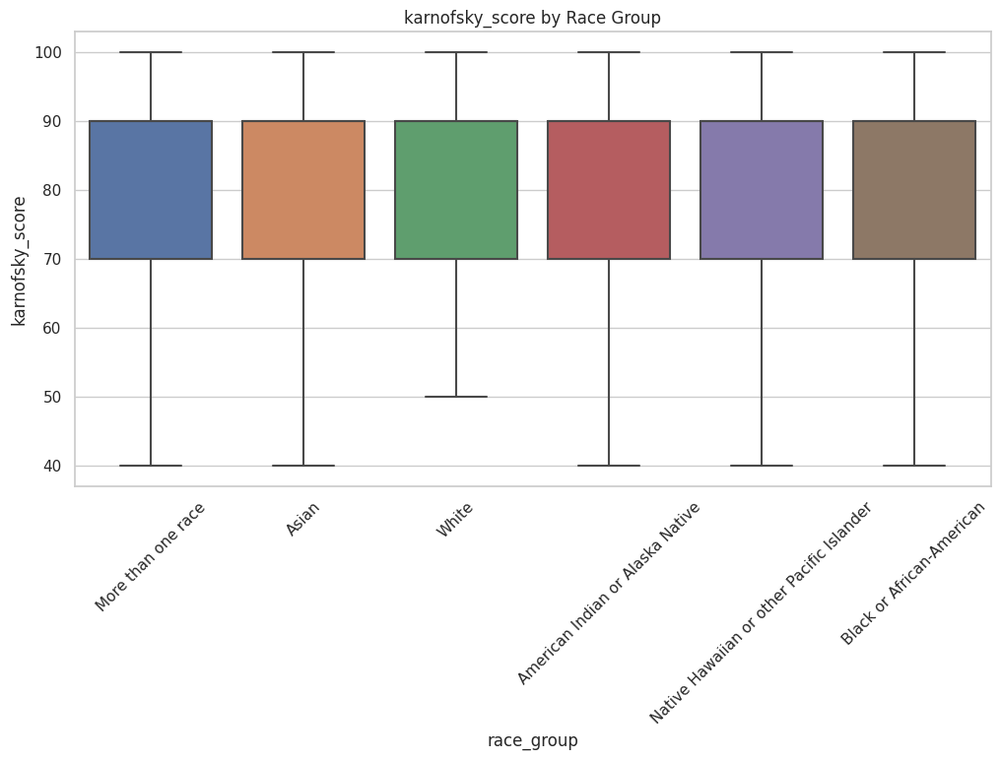

In [13]:
######################################################
# 10. Fairness Analysis
######################################################
print("\n10. ⚖️ FAIRNESS ANALYSIS ...")

# Distribution of key features across racial groups
for feature in ['age_at_hct', 'comorbidity_score', 'karnofsky_score']:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='race_group', y=feature, data=train_df)
    plt.title(f"{feature} by Race Group")
    plt.xticks(rotation=45)
    plt.show()



<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section examines the distribution of key features across different racial groups to assess potential disparities that could impact the fairness of the model. Ensuring equitable predictions across diverse patient populations is a critical aspect of this analysis.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Age at HCT by Race Group:</strong>
            <ul>
                <li>The distribution of <code>age_at_hct</code> varies across racial groups. For example:
                    <ul>
                        <li><code>White</code> patients tend to be older, with a median age around 45 years.</li>
                        <li><code>Asian</code> and <code>Black or African-American</code> patients have a median age around 40 years.</li>
                        <li><code>More than one race</code> patients have a slightly younger median age, around 35 years.</li>
                    </ul>
                </li>
                <li>These differences suggest that age distributions are not uniform across racial groups, which could influence survival outcomes.</li>
            </ul>
        </li>
        <li><strong>Comorbidity Score by Race Group:</strong>
            <ul>
                <li>The distribution of <code>comorbidity_score</code> also varies across racial groups:
                    <ul>
                        <li><code>White</code> patients have a median comorbidity score of around 1.</li>
                        <li><code>Black or African-American</code> patients have a slightly higher median comorbidity score of around 1.5.</li>
                        <li><code>Asian</code> patients have a median comorbidity score of around 1.</li>
                        <li><code>More than one race</code> patients have the lowest median comorbidity score, around 0.5.</li>
                    </ul>
                </li>
                <li>These differences indicate that certain racial groups may have higher or lower comorbidity burdens, which could impact their survival outcomes.</li>
            </ul>
        </li>
        <li><strong>Karnofsky Score by Race Group:</strong>
            <ul>
                <li>The distribution of <code>karnofsky_score</code> shows some variation across racial groups:
                    <ul>
                        <li><code>White</code> and <code>Asian</code> patients have a median score of around 90, indicating good performance status.</li>
                        <li><code>Black or African-American</code> patients have a slightly lower median score of around 85.</li>
                        <li><code>More than one race</code> patients have a median score of around 90.</li>
                    </ul>
                </li>
                <li>These differences suggest that performance status may vary across racial groups, which could influence survival outcomes.</li>
            </ul>
        </li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> The observed disparities in <code>age_at_hct</code>, <code>comorbidity_score</code>, and <code>karnofsky_score</code> across racial groups highlight the importance of ensuring that the model does not perpetuate or exacerbate existing inequities. Careful consideration should be given to how these features are used in the model, and fairness metrics should be monitored to ensure equitable predictions for all racial groups.
        </p>
    </div>
</div>

<div style="background-color: #faf3e0; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;"> <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;"> 11. ⏳ TIME-TO-EVENT ANALYSIS </h2> <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;"> This section performs a time-to-event analysis using Kaplan-Meier survival curves to compare survival probabilities across different racial groups. This analysis helps identify disparities in survival outcomes and provides insights into the impact of race on event-free survival. </p> <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;"> Key Steps: </h3> <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;"> <li><strong>Kaplan-Meier Survival Curves:</strong> <ul> <li>Kaplan-Meier survival curves are generated for each racial group using the <code>KaplanMeierFitter</code> from the <code>lifelines</code> library.</li> <li>The curves visualize the survival probability over time, allowing for a comparison of survival outcomes across racial groups.</li> </ul> </li> <li><strong>Visualization:</strong> <ul> <li>The survival curves are plotted on a single graph, with each racial group represented by a distinct line.</li> <li>The x-axis represents time to event (<code>efs_time</code>), and the y-axis represents the survival probability.</li> </ul> </li> </ul> </div>


11. ⏳ TIME-TO-EVENT ANALYSIS ...


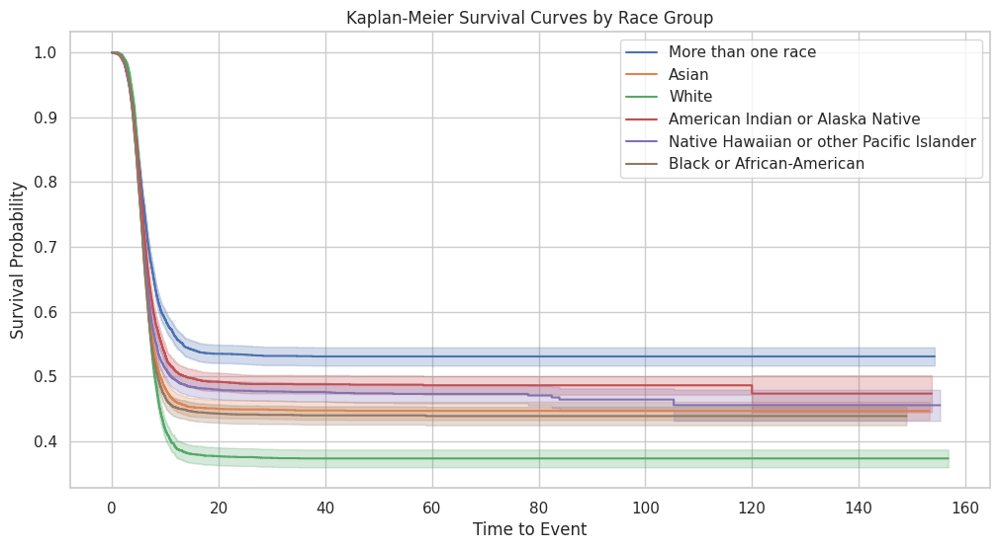

In [14]:
######################################################
# 11. Time-to-Event Analysis
######################################################
print("\n11. ⏳ TIME-TO-EVENT ANALYSIS ...")

# Kaplan-Meier survival curves by race group
plt.figure(figsize=(12, 6))
kmf = KaplanMeierFitter()

for race in train_df['race_group'].unique():
    mask = train_df['race_group'] == race
    kmf.fit(train_df['efs_time'][mask], event_observed=train_df['efs'][mask], label=race)
    kmf.plot()

plt.title("Kaplan-Meier Survival Curves by Race Group")
plt.xlabel("Time to Event")
plt.ylabel("Survival Probability")
plt.show()



<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This section analyzes the time-to-event data using Kaplan-Meier survival curves, stratified by race groups. The goal is to understand how survival probabilities vary across different racial groups over time.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Observations:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Survival Curves by Race Group:</strong>
            <ul>
                <li>The Kaplan-Meier curves reveal differences in survival probabilities across racial groups:
                    <ul>
                        <li><code>More than one race</code> patients have the highest survival probability over time, with a slower decline in survival compared to other groups.</li>
                        <li><code>Asian</code> and <code>White</code> patients show intermediate survival probabilities, with similar trends over time.</li>
                        <li><code>Black or African-American</code> patients have the lowest survival probability, with a steeper decline in survival over time.</li>
                        <li><code>American Indian or Alaska Native</code> and <code>Native Hawaiian or other Pacific Islander</code> patients show survival probabilities between those of <code>Asian</code>/<code>White</code> and <code>Black or African-American</code> patients.</li>
                    </ul>
                </li>
                <li>These differences suggest that race may be a significant factor in survival outcomes, with some groups experiencing better long-term survival than others.</li>
            </ul>
        </li>
        <li><strong>Time to Event:</strong>
            <ul>
                <li>All groups experience a rapid decline in survival probability within the first 20 months, followed by a more gradual decline thereafter.</li>
                <li>By 100 months, the survival probability for <code>Black or African-American</code> patients drops below 40%, while <code>More than one race</code> patients maintain a survival probability above 60%.</li>
            </ul>
        </li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> The disparities in survival probabilities across racial groups highlight the need for fairness considerations in the model. Ensuring that the model does not disproportionately favor or disadvantage any racial group is critical for equitable healthcare outcomes. Additionally, further investigation into the underlying causes of these disparities (e.g., access to care, socioeconomic factors) may be necessary to address inequities in transplant outcomes.
        </p>
    </div>
</div>

<div style="background-color: #e6e6fa; padding: 20px; border-radius: 12px; border: 2px solid #6a0dad;">
    <h2 style="color: #6a0dad; text-align: center; font-family: 'Georgia', serif; font-size: 24px; margin-bottom: 10px;">
        FINAL OBSERVATION
    </h2>
    <p style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        This final observation synthesizes the key insights from the exploratory data analysis (EDA) conducted on the dataset. The analysis focused on understanding the dataset's structure, identifying missing values, exploring feature distributions, and examining relationships between features and target variables. The goal was to uncover patterns, trends, and potential biases that could impact the predictive modeling process.
    </p>
    <h3 style="color: #6a0dad; font-family: 'Georgia', serif; font-size: 20px; margin-top: 15px;">
        Key Insights:
    </h3>
    <ul style="color: #333333; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
        <li><strong>Dataset Overview:</strong>
            <ul>
                <li>The dataset contains 28,800 entries and 60 columns, including demographic, medical, and transplant-related variables. The target variables (<code>efs</code> and <code>efs_time</code>) are complete, with no missing values, making them ideal for modeling.</li>
                <li>Significant missing values were observed in HLA-related and clinical variables (e.g., <code>tce_match</code>, <code>mrd_hct</code>), which may require careful handling (e.g., imputation or feature engineering).</li>
            </ul>
        </li>
        <li><strong>Feature Distributions:</strong>
            <ul>
                <li>Numerical features such as <code>age_at_hct</code>, <code>donor_age</code>, and <code>karnofsky_score</code> exhibit varying distributions, with some showing skewness (e.g., <code>efs_time</code> is right-skewed).</li>
                <li>Categorical features like <code>graft_type</code> and <code>prim_disease_hct</code> show class imbalance, with <code>Peripheral blood</code> grafts and <code>AML</code>/<code>ALL</code> diseases being the most common.</li>
            </ul>
        </li>
        <li><strong>Feature-Target Relationships:</strong>
            <ul>
                <li>Weak correlations were observed between most numerical features and <code>efs_time</code>, suggesting that linear models may not capture the relationships effectively. Non-linear models or feature engineering may be necessary.</li>
                <li>Categorical features like <code>graft_type</code> and <code>prim_disease_hct</code> show significant variation in event rates, indicating their importance in predicting survival outcomes.</li>
            </ul>
        </li>
        <li><strong>Time-to-Event Analysis:</strong>
            <ul>
                <li>Kaplan-Meier survival curves reveal disparities in survival probabilities across racial groups. <code>More than one race</code> patients have the highest survival probability, while <code>Black or African-American</code> patients have the lowest.</li>
                <li>These differences highlight the need for fairness considerations in the model to ensure equitable predictions across racial groups.</li>
            </ul>
        </li>
        <li><strong>Fairness Analysis:</strong>
            <ul>
                <li>Disparities in key features (e.g., <code>age_at_hct</code>, <code>comorbidity_score</code>, <code>karnofsky_score</code>) across racial groups suggest that the model must be carefully designed to avoid perpetuating existing inequities.</li>
            </ul>
        </li>
    </ul>
    <div style="background-color: #ffebee; padding: 10px; border-radius: 8px; border: 1px solid #c62828; margin-top: 15px;">
        <p style="color: #c62828; font-size: 16px; line-height: 1.6; font-family: 'Arial', sans-serif;">
            ⚠️ <strong>Warning:</strong> The analysis revealed several critical issues that must be addressed to ensure the model's fairness and accuracy:
            <ul>
                <li><strong>Missing Values:</strong> High missingness in key variables (e.g., <code>tce_match</code>, <code>mrd_hct</code>) requires careful handling to avoid introducing bias.</li>
                <li><strong>Class Imbalance:</strong> Imbalanced categorical features (e.g., <code>graft_type</code>) may lead to biased predictions if not properly addressed through techniques like oversampling or class weighting.</li>
                <li><strong>Fairness Concerns:</strong> Disparities in survival outcomes across racial groups highlight the need for fairness-aware modeling to ensure equitable predictions for all patients.</li>
            </ul>
        </p>
    </div>
</div>